In [ ]:
import init

In [2]:
import tensorflow as tf


def get_dataset(x, y, batch_size=128, shuffle_buffer=10_000, drop_remainder=True):
    """Scale image bytes to diffusion space and batch aligned labels.

    The affine transform does not clip values. No prefetching, repetition, validation
    split, or deterministic shuffle seed is added. Labels remain aligned with images
    while shuffling.

    Args:
        x (np.ndarray): Image values nominally in [0, 255]. Expected NHW grayscale
            input; a singleton channel is appended unconditionally.
        y (np.ndarray): Labels with the same leading length as x. One is added to
            reserve zero for classifier-free null conditioning.
        batch_size (int): Number of examples in each dataset batch. Defaults to ``128``.
        shuffle_buffer (int | None): None preserves input order; a positive integer
            enables shuffling without an explicit operation seed. TensorFlow global
            seeding can still control this randomness. Defaults to ``10000``.
        drop_remainder (bool): True discards an incomplete final batch; False retains
            it. Defaults to ``True``.

    Returns:
        tf.data.Dataset: Finite (images, labels) batches, with float32 image values
        transformed as 2*x/255-1 and the configured remainder policy.
    """

    x = x.astype("float32") / 255.0
    x = (x * 2.0) - 1.0
    x = x[..., None]

    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    # A supplied buffer enables random shuffling; None keeps input order.
    if shuffle_buffer is not None:
        dataset = dataset.shuffle(shuffle_buffer)
    dataset = dataset.batch(batch_size, drop_remainder=drop_remainder)

    return dataset

In [3]:
epochs = 500

In [4]:
from tensorflow.keras import datasets


(x_train, y_train), (x_test, y_test) = datasets.mnist.load_data()

trainset = get_dataset(x_train, y_train)
valset = get_dataset(x_test, y_test, shuffle_buffer=None, drop_remainder=False)

In [5]:
from diffusion.models.transformer.diffusion_transformer import DiffusionTransformer
from diffusion.models.wrapper.diffusion_model import DiffusionModel


vit = DiffusionTransformer()
model = DiffusionModel(network=vit)

vit.summary()

Model: "diffusion_transformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depth_0_patch_embedder (Pat  (None, 196, 32)          160       
 chEmbedding)                                                    
                                                                 
 depth_0_time_embedder (Cond  (None, 32)               32000     
 itionEmbedding)                                                 
                                                                 
 depth_0_label_embedder (Con  (None, 32)               352       
 ditionEmbedding)                                                
                                                                 
 depth_0_time_label_merger (  (None, 32)               0         
 Add)                                                            
                                                                 
 depth_1_encoder_block (Visi  (None, 196, 32)

In [6]:
from tensorflow.keras import optimizers


lr_schedule = optimizers.schedules.CosineDecay(
    initial_learning_rate=5e-3, 
    decay_steps=epochs * len(trainset)
)

model.compile(
    optimizer=optimizers.Adam(lr_schedule), 
    loss="mse"
)

In [ ]:
from tensorflow.keras import callbacks

from diffusion import ImageGenerator
from common.callbacks.lr_logger import LrLogger


callbacks_list = [
    LrLogger(), 
    callbacks.ProgbarLogger(), 
    ImageGenerator()
]

Epoch 1/500
468/468 [==============================] - 31s 45ms/step - noise_loss: 0.0975 - val_loss: 0.6188 - val_noise_loss: 0.6188 - val_image_loss: 20.4280 - learning_rate: 0.0050


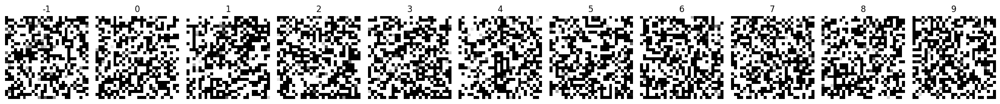

Epoch 2/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0544 - val_loss: 0.2786 - val_noise_loss: 0.2786 - val_image_loss: 5.1359 - learning_rate: 0.0050


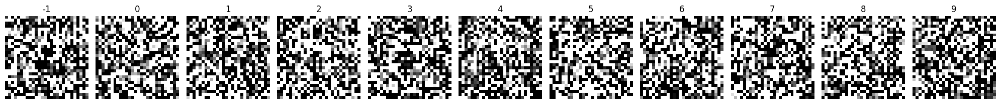

Epoch 3/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0449 - val_loss: 0.1480 - val_noise_loss: 0.1480 - val_image_loss: 1.6846 - learning_rate: 0.0050


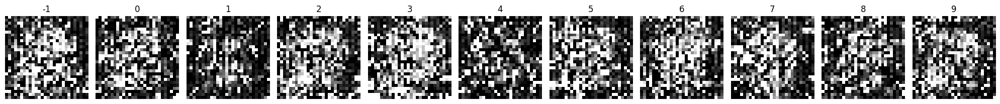

Epoch 4/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0399 - val_loss: 0.0954 - val_noise_loss: 0.0954 - val_image_loss: 0.8081 - learning_rate: 0.0050


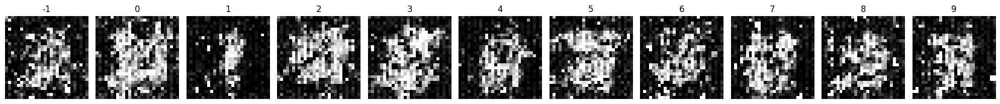

Epoch 5/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0374 - val_loss: 0.0668 - val_noise_loss: 0.0668 - val_image_loss: 0.4250 - learning_rate: 0.0050


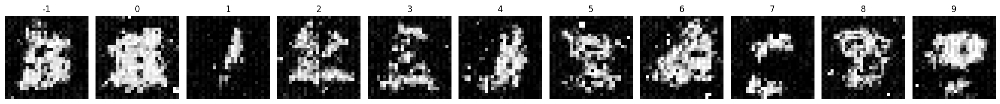

Epoch 6/500
468/468 [==============================] - 24s 52ms/step - noise_loss: 0.0364 - val_loss: 0.0527 - val_noise_loss: 0.0527 - val_image_loss: 0.2947 - learning_rate: 0.0050


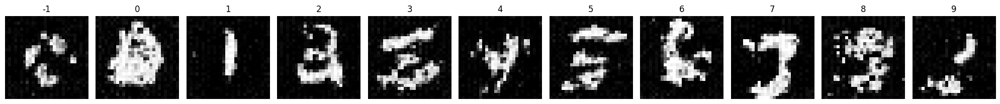

Epoch 7/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0357 - val_loss: 0.0477 - val_noise_loss: 0.0477 - val_image_loss: 0.2429 - learning_rate: 0.0050


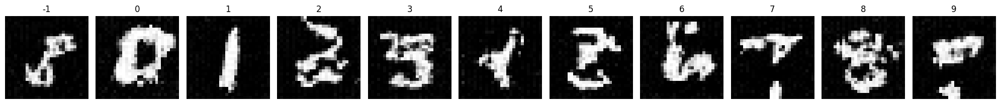

Epoch 8/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0351 - val_loss: 0.0464 - val_noise_loss: 0.0464 - val_image_loss: 0.2246 - learning_rate: 0.0050


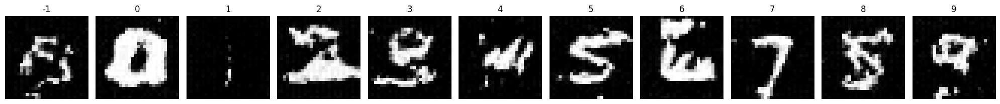

Epoch 9/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0345 - val_loss: 0.0476 - val_noise_loss: 0.0476 - val_image_loss: 0.2067 - learning_rate: 0.0050


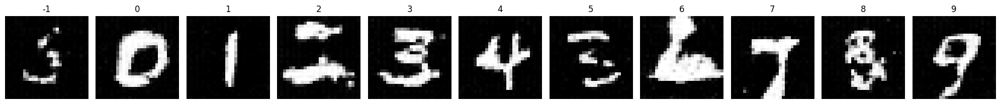

Epoch 10/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0343 - val_loss: 0.0487 - val_noise_loss: 0.0487 - val_image_loss: 0.2194 - learning_rate: 0.0050


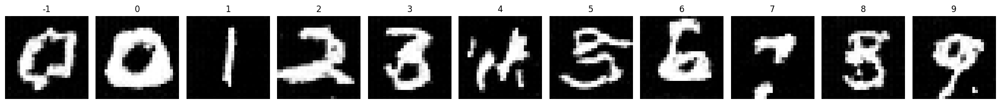

Epoch 11/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0340 - val_loss: 0.0500 - val_noise_loss: 0.0500 - val_image_loss: 0.2241 - learning_rate: 0.0050


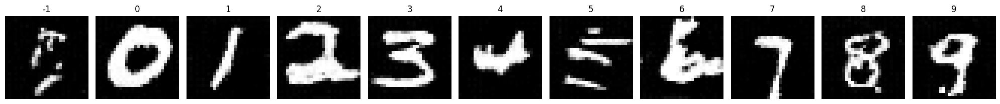

Epoch 12/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0338 - val_loss: 0.0512 - val_noise_loss: 0.0512 - val_image_loss: 0.2224 - learning_rate: 0.0050


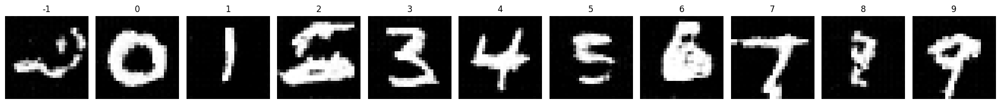

Epoch 13/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0337 - val_loss: 0.0518 - val_noise_loss: 0.0518 - val_image_loss: 0.2282 - learning_rate: 0.0050


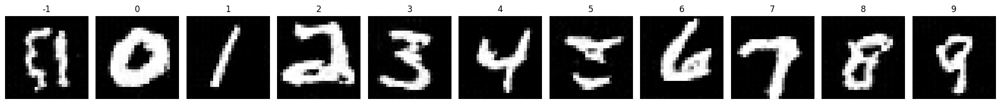

Epoch 14/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0333 - val_loss: 0.0526 - val_noise_loss: 0.0526 - val_image_loss: 0.2295 - learning_rate: 0.0050


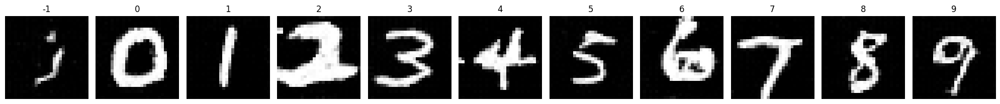

Epoch 15/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0332 - val_loss: 0.0537 - val_noise_loss: 0.0537 - val_image_loss: 0.2311 - learning_rate: 0.0050


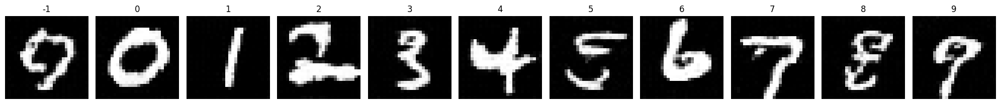

Epoch 16/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0330 - val_loss: 0.0537 - val_noise_loss: 0.0537 - val_image_loss: 0.2323 - learning_rate: 0.0050


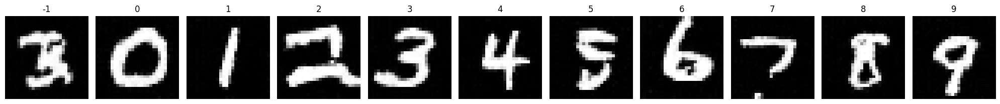

Epoch 17/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0329 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2284 - learning_rate: 0.0050


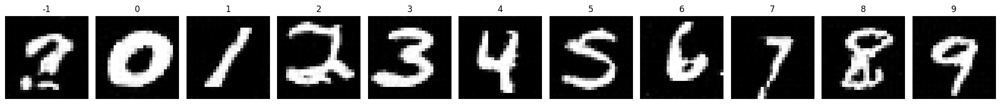

Epoch 18/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0329 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2295 - learning_rate: 0.0050


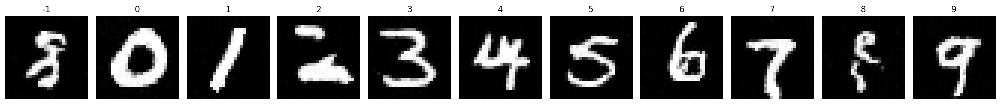

Epoch 19/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0328 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2356 - learning_rate: 0.0050


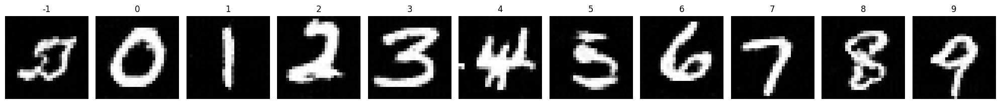

Epoch 20/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0326 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2325 - learning_rate: 0.0050


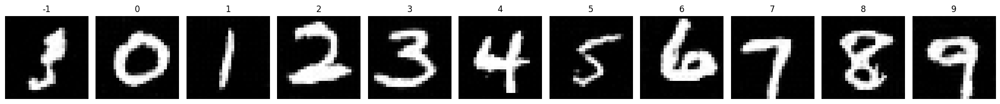

Epoch 21/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0325 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2300 - learning_rate: 0.0050


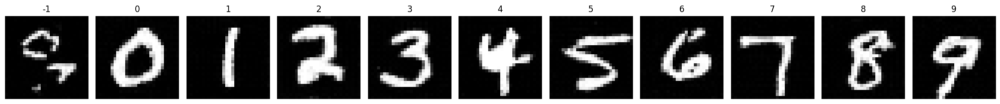

Epoch 22/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0324 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2320 - learning_rate: 0.0050


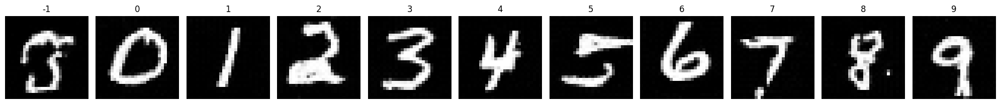

Epoch 23/500
468/468 [==============================] - 22s 46ms/step - noise_loss: 0.0322 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2377 - learning_rate: 0.0050


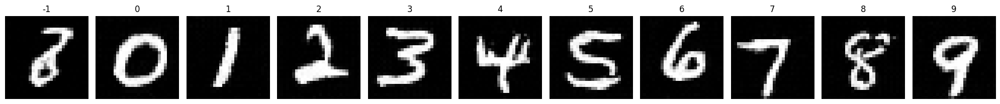

Epoch 24/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0322 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2348 - learning_rate: 0.0050


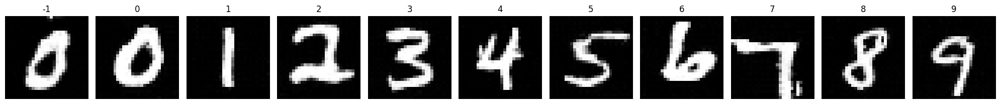

Epoch 25/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0322 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2373 - learning_rate: 0.0050


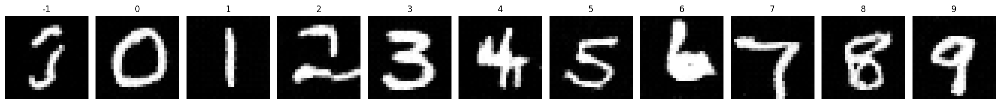

Epoch 26/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0321 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2343 - learning_rate: 0.0050


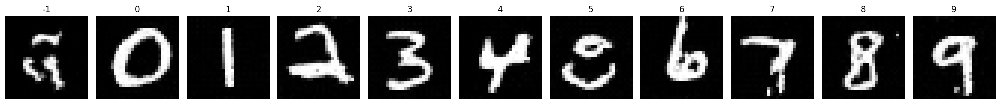

Epoch 27/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0319 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2370 - learning_rate: 0.0050


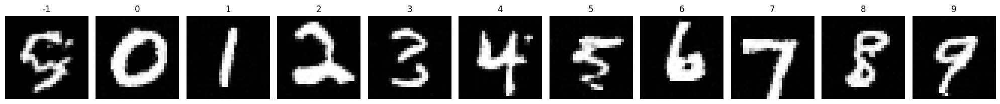

Epoch 28/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0318 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2336 - learning_rate: 0.0050


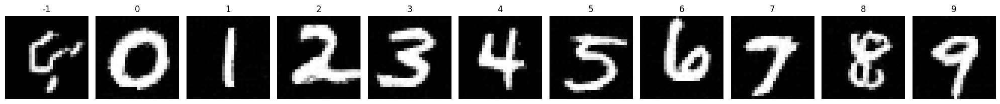

Epoch 29/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0317 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2317 - learning_rate: 0.0050


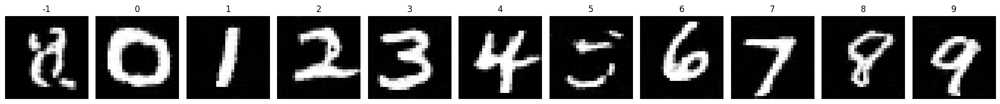

Epoch 30/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0315 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2356 - learning_rate: 0.0050


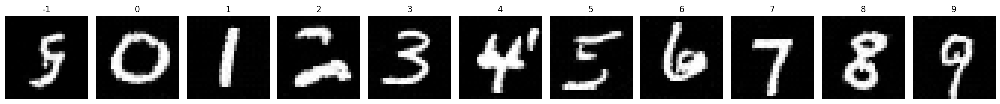

Epoch 31/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0316 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2304 - learning_rate: 0.0050


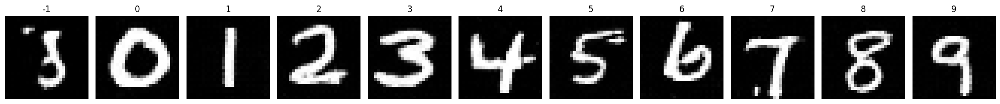

Epoch 32/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0314 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2332 - learning_rate: 0.0049


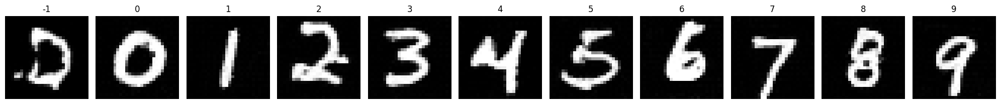

Epoch 33/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0315 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2335 - learning_rate: 0.0049


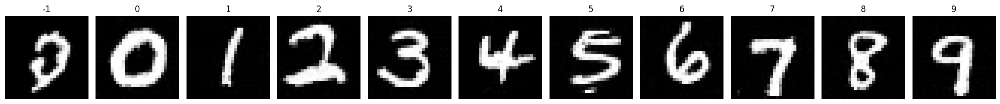

Epoch 34/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0313 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2365 - learning_rate: 0.0049


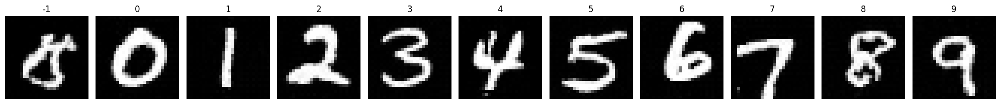

Epoch 35/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0313 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2345 - learning_rate: 0.0049


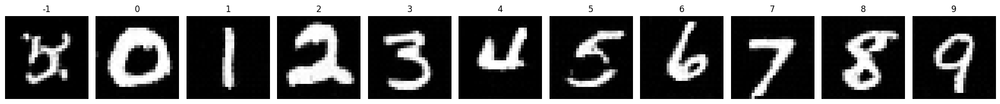

Epoch 36/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0313 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2320 - learning_rate: 0.0049


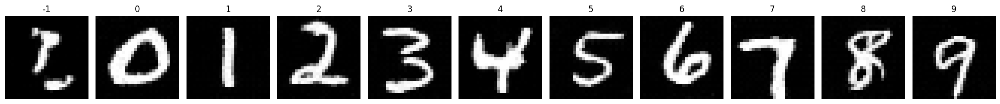

Epoch 37/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0312 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2331 - learning_rate: 0.0049


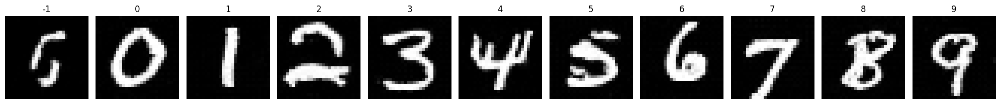

Epoch 38/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0313 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2315 - learning_rate: 0.0049


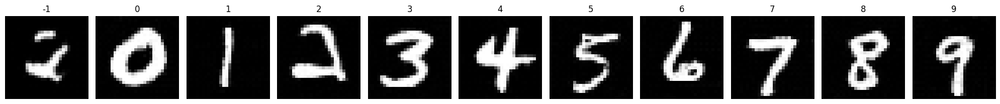

Epoch 39/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0311 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2330 - learning_rate: 0.0049


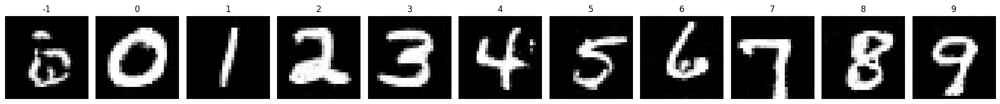

Epoch 40/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0311 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2341 - learning_rate: 0.0049


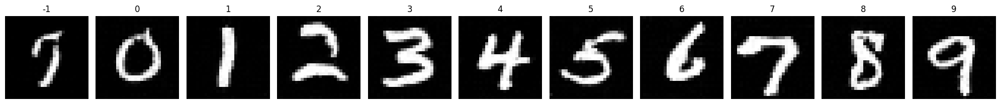

Epoch 41/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0310 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2310 - learning_rate: 0.0049


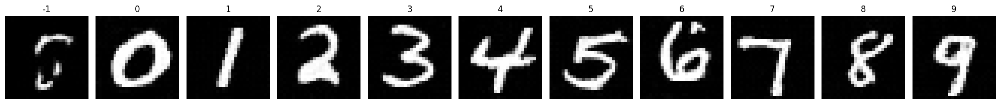

Epoch 42/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0310 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2321 - learning_rate: 0.0049


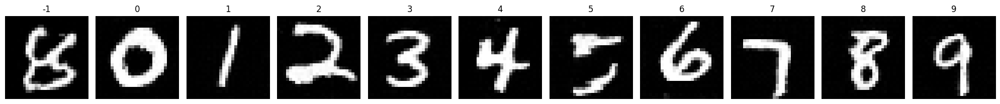

Epoch 43/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0307 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2298 - learning_rate: 0.0049


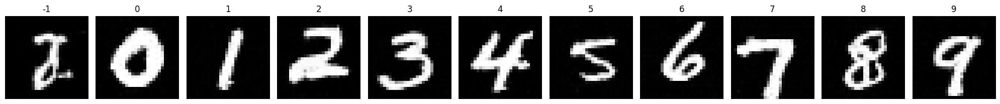

Epoch 44/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0308 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2315 - learning_rate: 0.0049


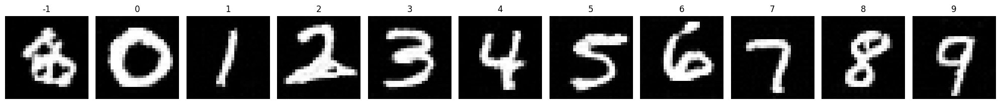

Epoch 45/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0309 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2303 - learning_rate: 0.0049


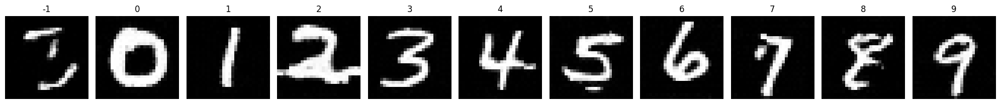

Epoch 46/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0308 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2268 - learning_rate: 0.0049


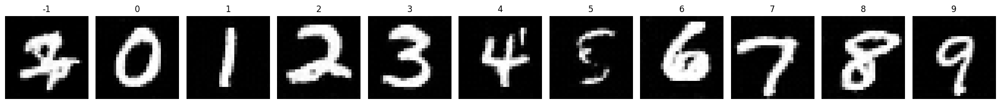

Epoch 47/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0305 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2332 - learning_rate: 0.0049


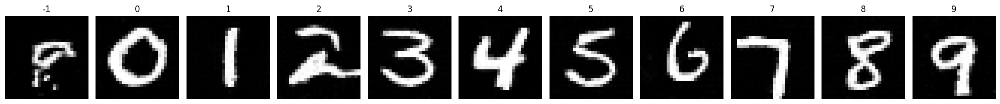

Epoch 48/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0307 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2293 - learning_rate: 0.0049


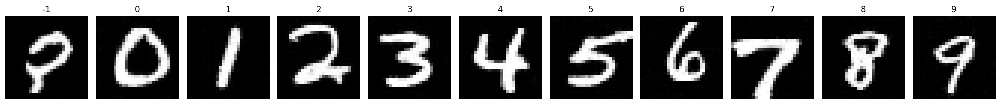

Epoch 49/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0307 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2270 - learning_rate: 0.0049


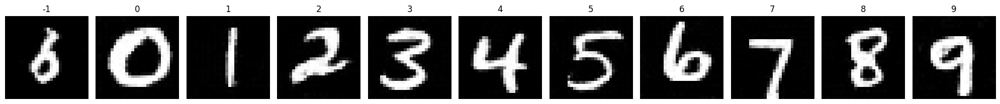

Epoch 50/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0306 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2291 - learning_rate: 0.0049


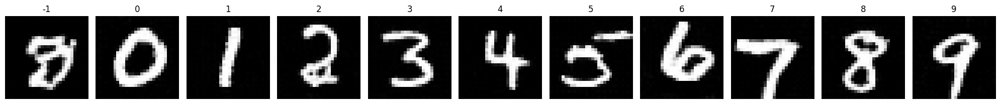

Epoch 51/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0306 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2321 - learning_rate: 0.0049


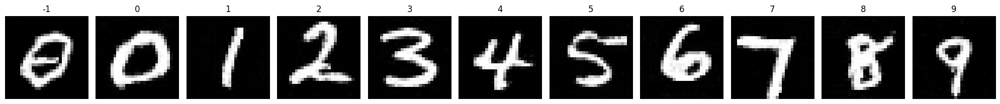

Epoch 52/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0306 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2316 - learning_rate: 0.0049


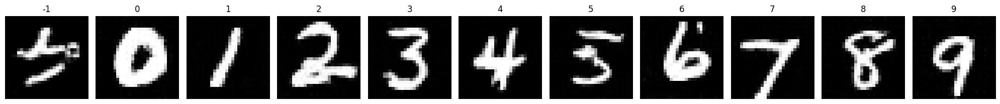

Epoch 53/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0306 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2307 - learning_rate: 0.0049


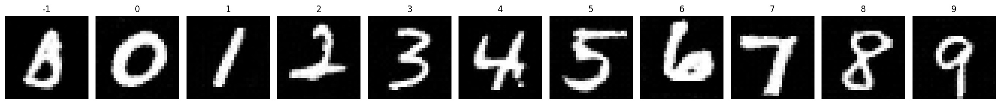

Epoch 54/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0304 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2351 - learning_rate: 0.0049


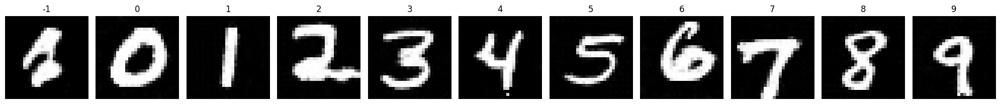

Epoch 55/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0305 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2315 - learning_rate: 0.0049


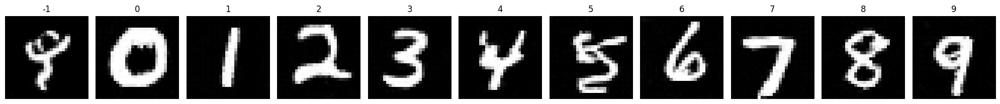

Epoch 56/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0305 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2322 - learning_rate: 0.0048


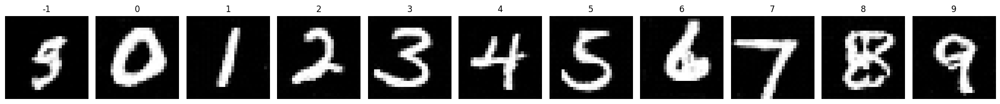

Epoch 57/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0304 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2295 - learning_rate: 0.0048


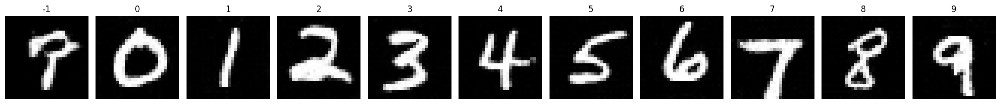

Epoch 58/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0304 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2361 - learning_rate: 0.0048


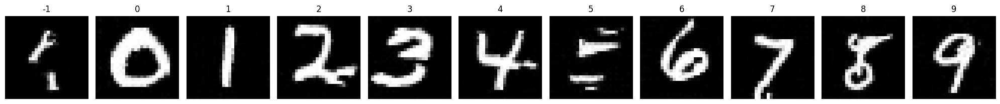

Epoch 59/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0304 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2306 - learning_rate: 0.0048


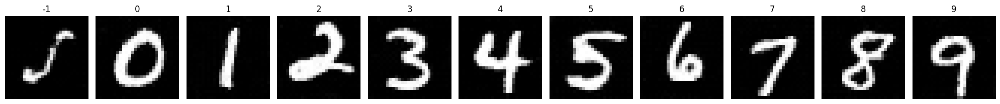

Epoch 60/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0304 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2352 - learning_rate: 0.0048


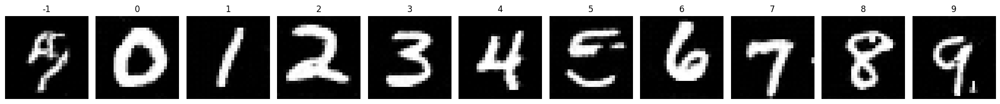

Epoch 61/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0304 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2335 - learning_rate: 0.0048


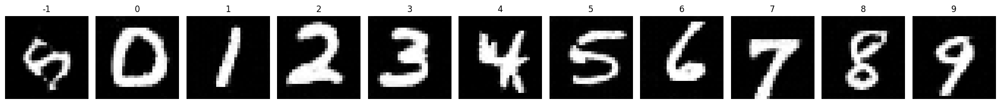

Epoch 62/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0303 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2357 - learning_rate: 0.0048


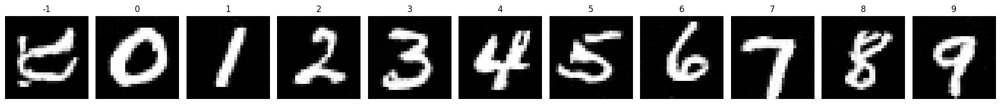

Epoch 63/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0302 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2298 - learning_rate: 0.0048


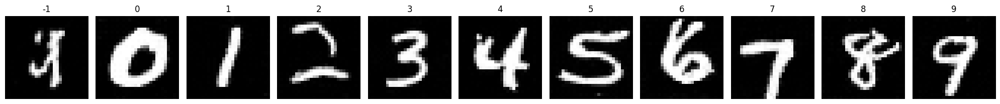

Epoch 64/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0301 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2365 - learning_rate: 0.0048


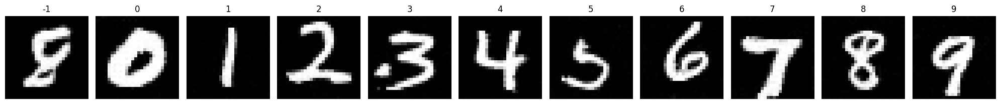

Epoch 65/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0302 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2349 - learning_rate: 0.0048


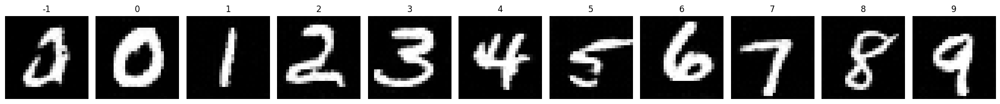

Epoch 66/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0303 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2377 - learning_rate: 0.0048


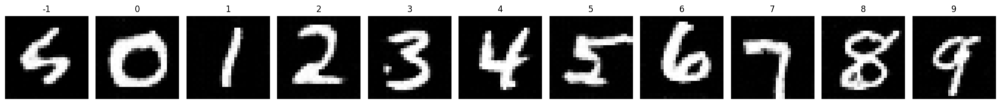

Epoch 67/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0302 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2299 - learning_rate: 0.0048


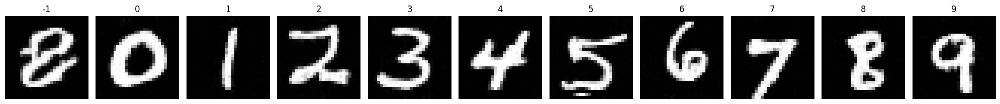

Epoch 68/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0301 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2339 - learning_rate: 0.0048


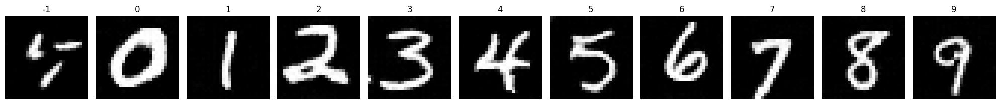

Epoch 69/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0302 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2243 - learning_rate: 0.0048


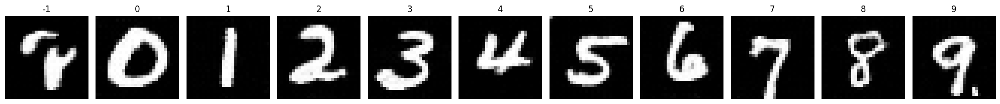

Epoch 70/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0301 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2330 - learning_rate: 0.0048


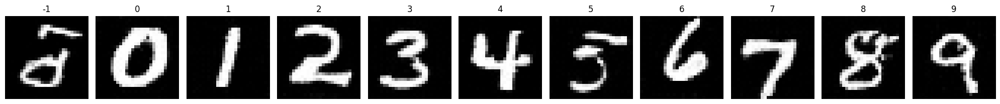

Epoch 71/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0302 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2304 - learning_rate: 0.0048


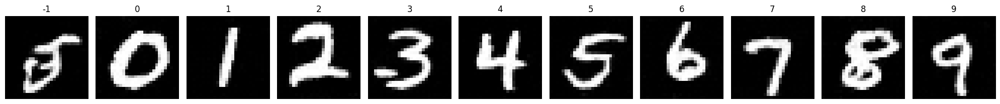

Epoch 72/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0300 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2360 - learning_rate: 0.0047


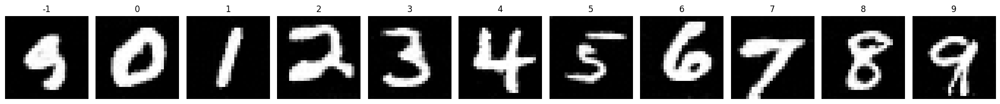

Epoch 73/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0301 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2243 - learning_rate: 0.0047


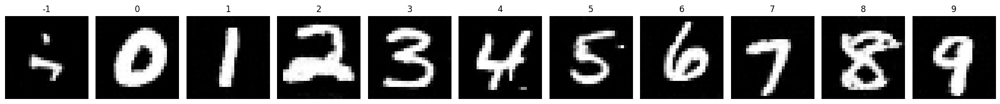

Epoch 74/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0299 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2367 - learning_rate: 0.0047


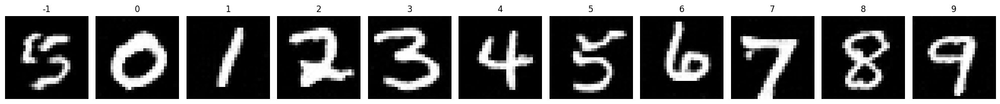

Epoch 75/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0301 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2370 - learning_rate: 0.0047


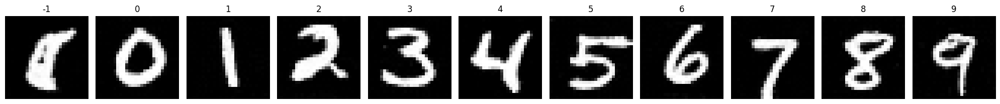

Epoch 76/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0300 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2287 - learning_rate: 0.0047


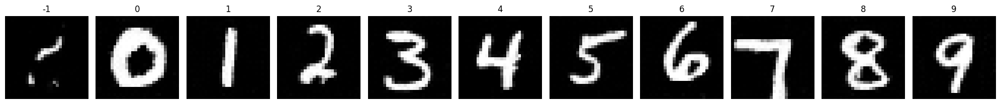

Epoch 77/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0300 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2310 - learning_rate: 0.0047


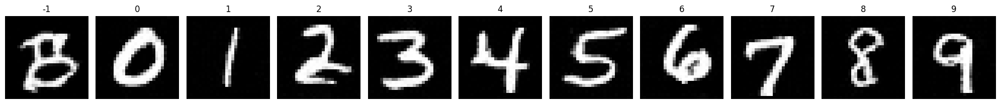

Epoch 78/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0299 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2322 - learning_rate: 0.0047


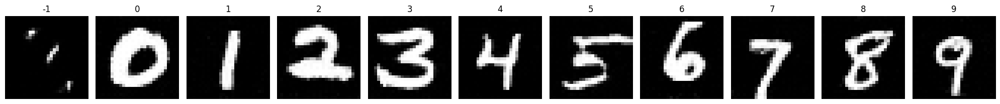

Epoch 79/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0301 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2329 - learning_rate: 0.0047


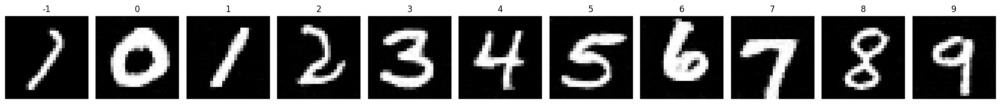

Epoch 80/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0297 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2273 - learning_rate: 0.0047


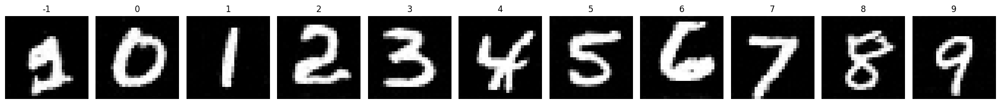

Epoch 81/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0299 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2267 - learning_rate: 0.0047


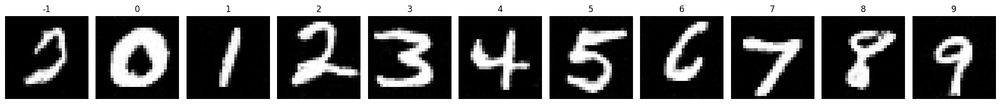

Epoch 82/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0299 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2326 - learning_rate: 0.0047


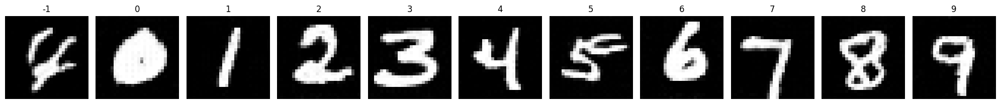

Epoch 83/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0299 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2331 - learning_rate: 0.0047


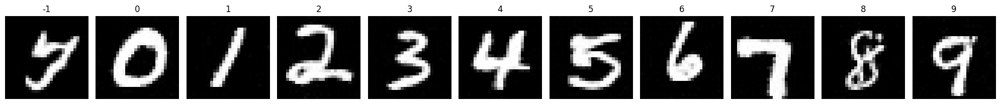

Epoch 84/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0299 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2320 - learning_rate: 0.0047


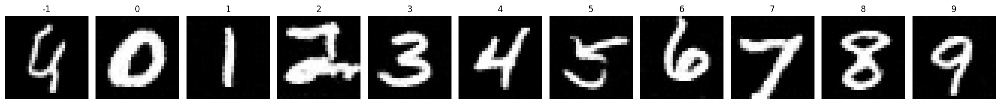

Epoch 85/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0298 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2312 - learning_rate: 0.0047


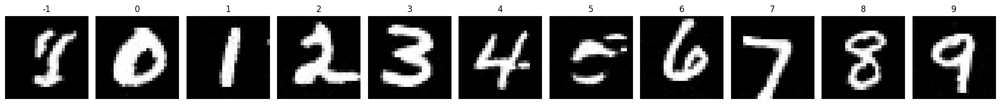

Epoch 86/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0298 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2323 - learning_rate: 0.0046


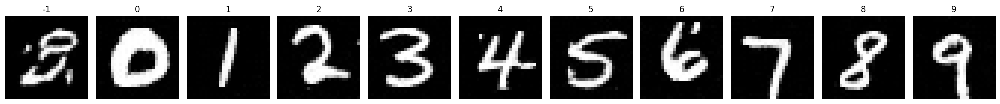

Epoch 87/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0299 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2379 - learning_rate: 0.0046


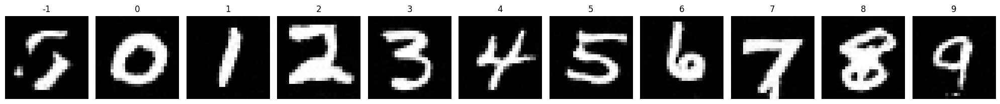

Epoch 88/500
468/468 [==============================] - 20s 43ms/step - noise_loss: 0.0298 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2357 - learning_rate: 0.0046


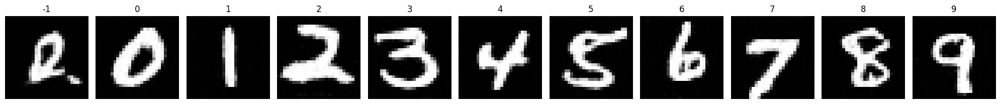

Epoch 89/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0297 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2332 - learning_rate: 0.0046


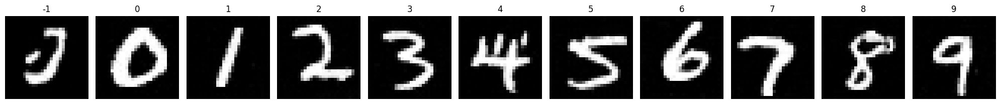

Epoch 90/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0298 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2293 - learning_rate: 0.0046


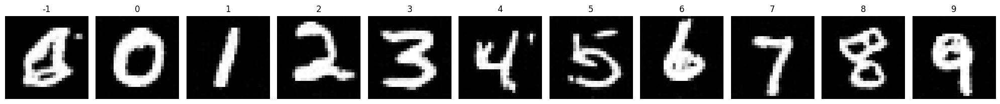

Epoch 91/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0299 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2313 - learning_rate: 0.0046


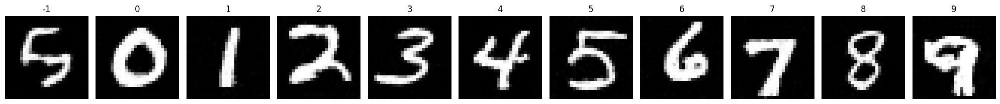

Epoch 92/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0297 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2316 - learning_rate: 0.0046


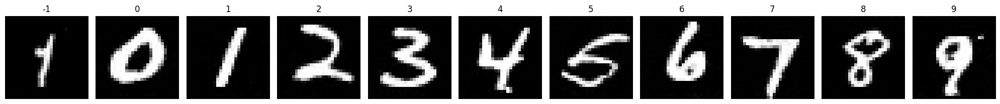

Epoch 93/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0297 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2332 - learning_rate: 0.0046


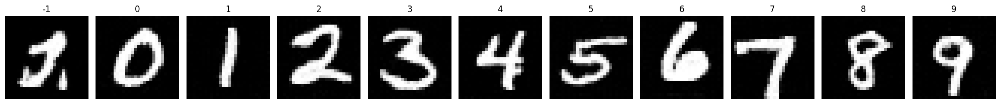

Epoch 94/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0298 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2337 - learning_rate: 0.0046


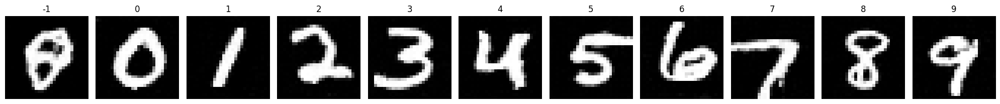

Epoch 95/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0298 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2337 - learning_rate: 0.0046


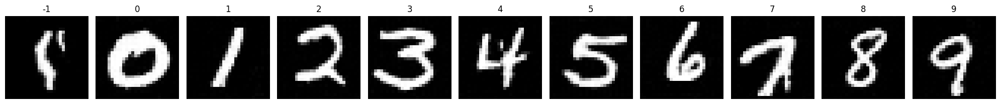

Epoch 96/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0297 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2361 - learning_rate: 0.0046


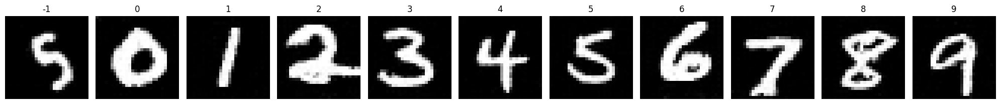

Epoch 97/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0297 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2267 - learning_rate: 0.0045


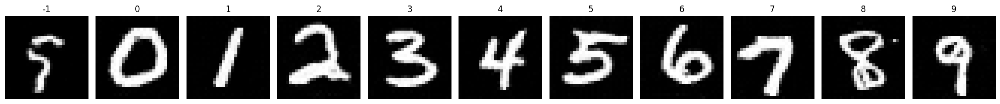

Epoch 98/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0296 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2307 - learning_rate: 0.0045


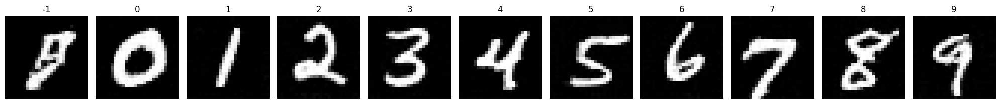

Epoch 99/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0296 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2357 - learning_rate: 0.0045


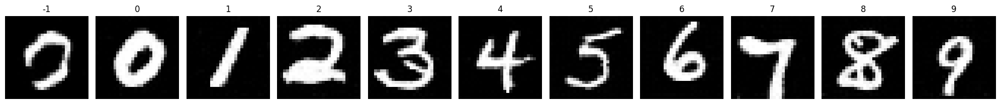

Epoch 100/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0297 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2355 - learning_rate: 0.0045


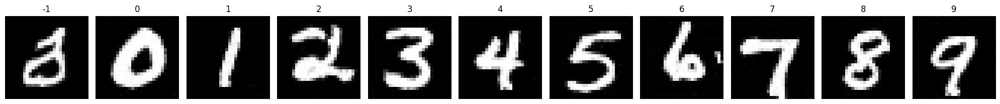

Epoch 101/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0296 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2293 - learning_rate: 0.0045


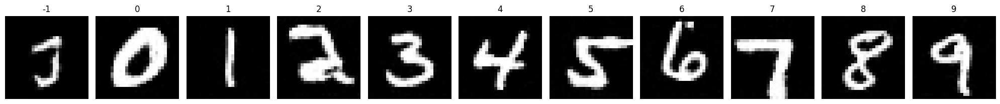

Epoch 102/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0295 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2314 - learning_rate: 0.0045


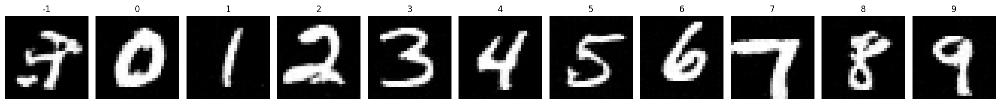

Epoch 103/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0296 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2362 - learning_rate: 0.0045


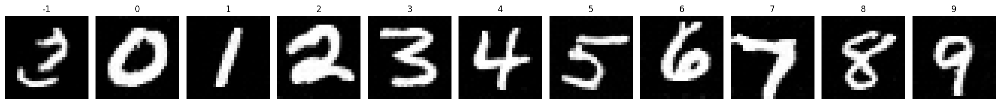

Epoch 104/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0296 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2375 - learning_rate: 0.0045


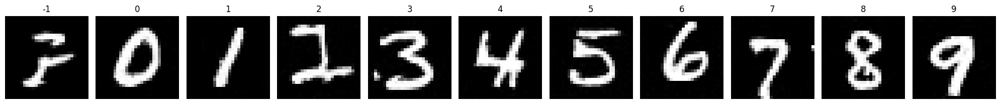

Epoch 105/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0296 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2306 - learning_rate: 0.0045


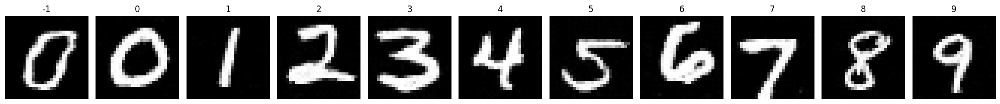

Epoch 106/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0295 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2305 - learning_rate: 0.0045


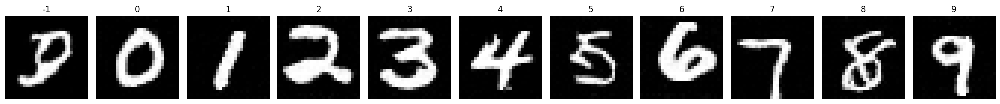

Epoch 107/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0295 - val_loss: 0.0537 - val_noise_loss: 0.0537 - val_image_loss: 0.2310 - learning_rate: 0.0045


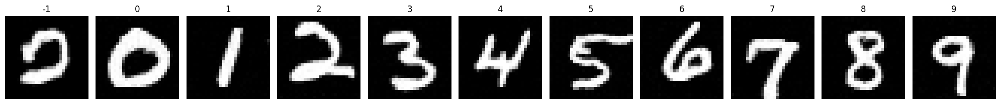

Epoch 108/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0295 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2293 - learning_rate: 0.0044


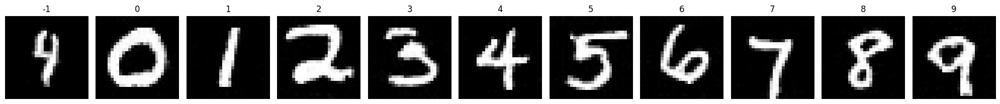

Epoch 109/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0295 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2308 - learning_rate: 0.0044


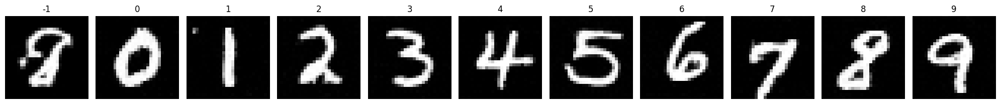

Epoch 110/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0295 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2332 - learning_rate: 0.0044


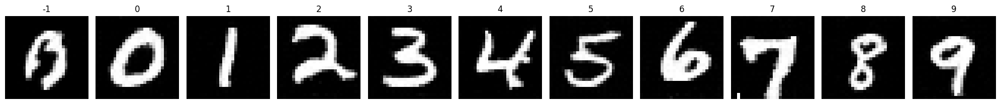

Epoch 111/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0295 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2281 - learning_rate: 0.0044


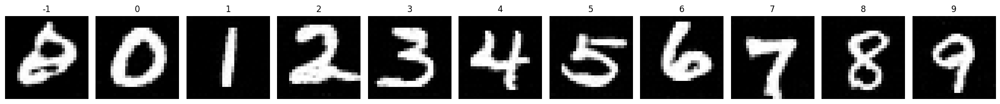

Epoch 112/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0295 - val_loss: 0.0536 - val_noise_loss: 0.0536 - val_image_loss: 0.2341 - learning_rate: 0.0044


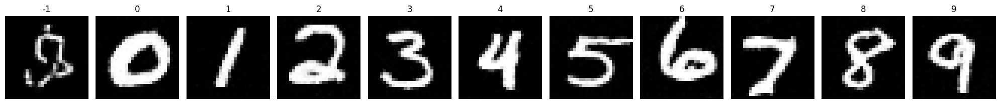

Epoch 113/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0295 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2337 - learning_rate: 0.0044


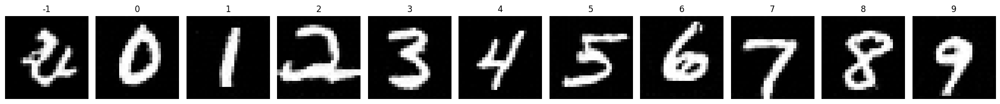

Epoch 114/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0296 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2314 - learning_rate: 0.0044


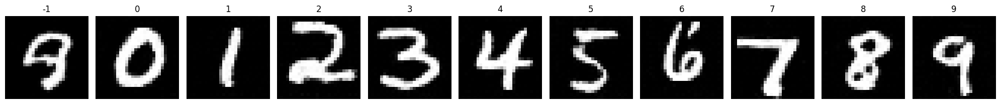

Epoch 115/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0295 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2401 - learning_rate: 0.0044


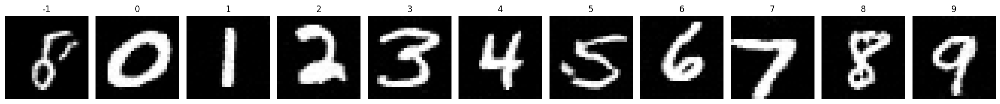

Epoch 116/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0295 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2340 - learning_rate: 0.0044


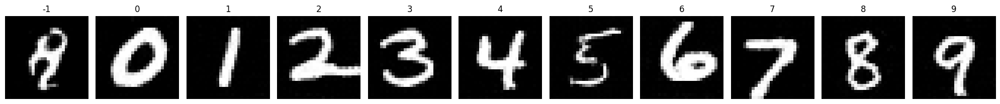

Epoch 117/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2346 - learning_rate: 0.0044


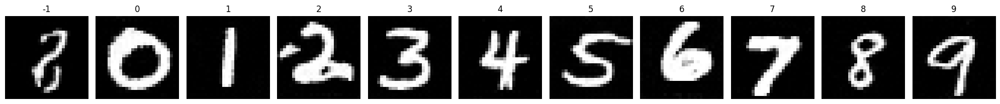

Epoch 118/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0294 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2341 - learning_rate: 0.0043


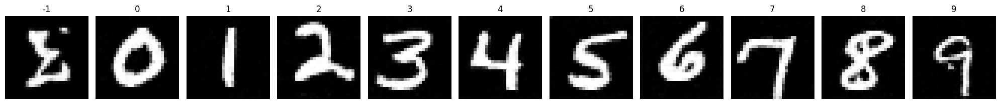

Epoch 119/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0294 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2322 - learning_rate: 0.0043


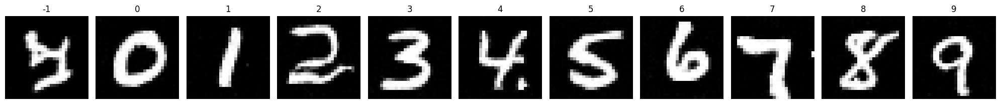

Epoch 120/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0294 - val_loss: 0.0537 - val_noise_loss: 0.0537 - val_image_loss: 0.2333 - learning_rate: 0.0043


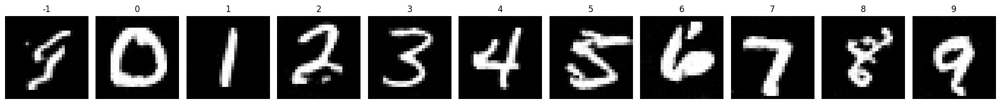

Epoch 121/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0294 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2311 - learning_rate: 0.0043


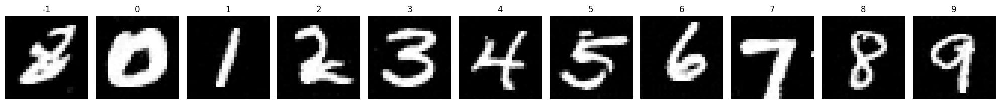

Epoch 122/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0294 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2351 - learning_rate: 0.0043


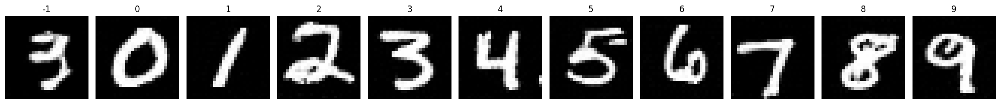

Epoch 123/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2359 - learning_rate: 0.0043


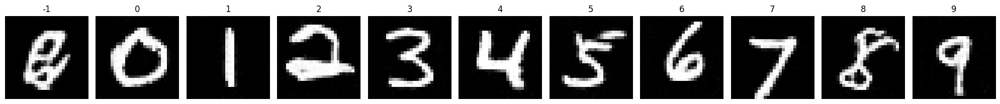

Epoch 124/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0294 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2284 - learning_rate: 0.0043


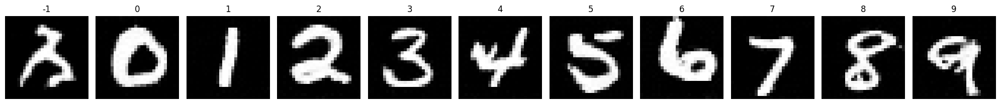

Epoch 125/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2288 - learning_rate: 0.0043


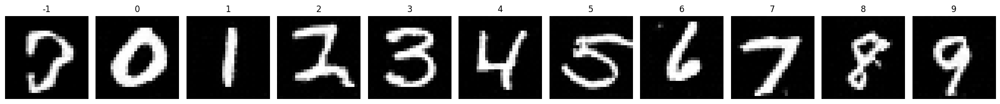

Epoch 126/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2327 - learning_rate: 0.0043


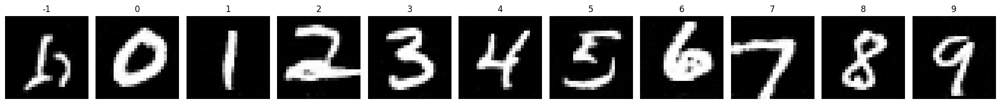

Epoch 127/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2333 - learning_rate: 0.0042


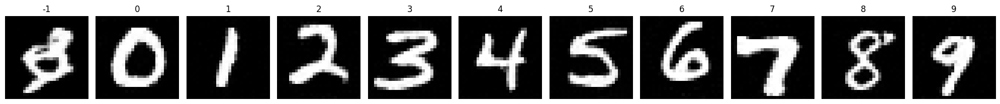

Epoch 128/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0294 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2272 - learning_rate: 0.0042


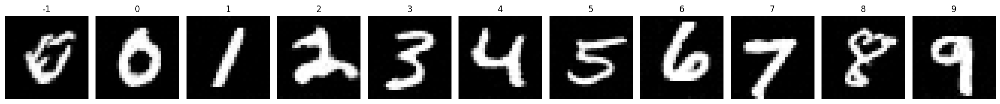

Epoch 129/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2350 - learning_rate: 0.0042


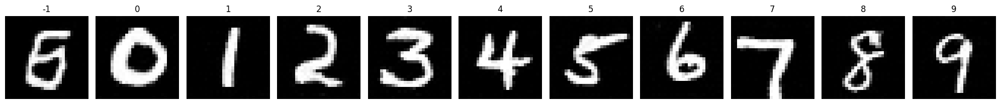

Epoch 130/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2307 - learning_rate: 0.0042


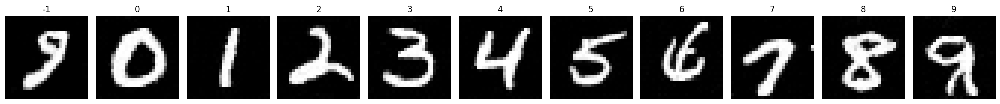

Epoch 131/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2325 - learning_rate: 0.0042


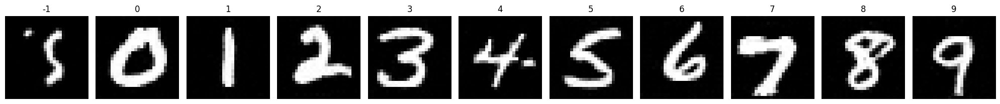

Epoch 132/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2324 - learning_rate: 0.0042


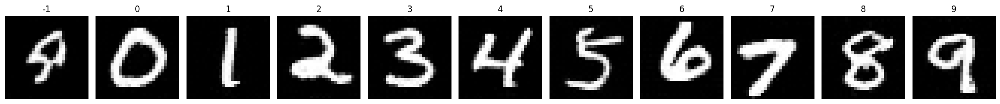

Epoch 133/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2337 - learning_rate: 0.0042


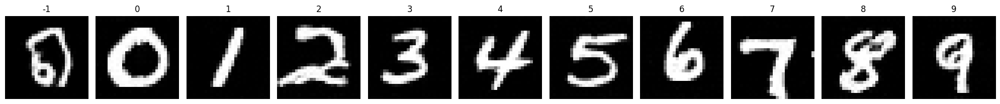

Epoch 134/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2300 - learning_rate: 0.0042


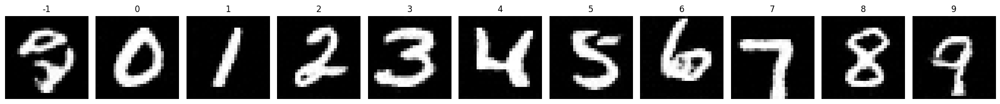

Epoch 135/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2286 - learning_rate: 0.0042


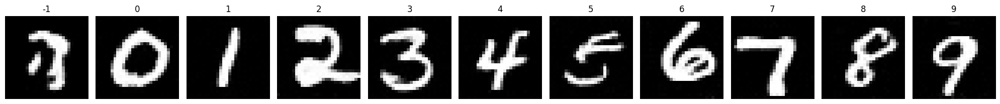

Epoch 136/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2318 - learning_rate: 0.0041


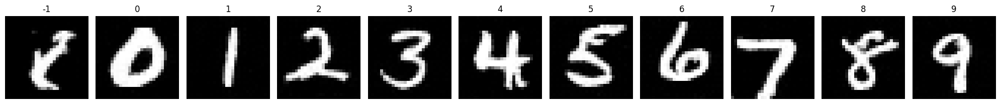

Epoch 137/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2340 - learning_rate: 0.0041


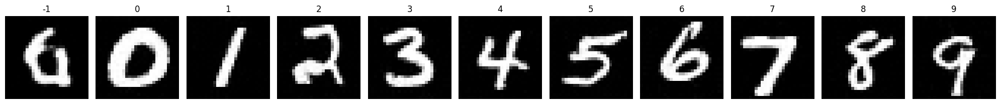

Epoch 138/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2295 - learning_rate: 0.0041


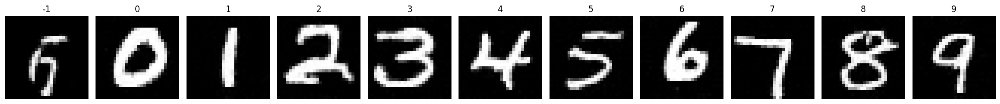

Epoch 139/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2337 - learning_rate: 0.0041


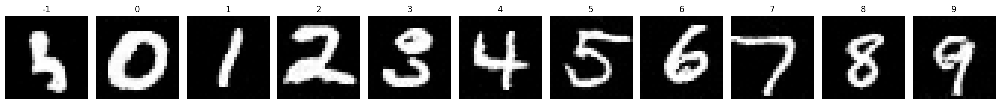

Epoch 140/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2319 - learning_rate: 0.0041


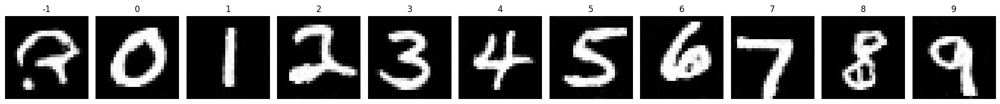

Epoch 141/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2322 - learning_rate: 0.0041


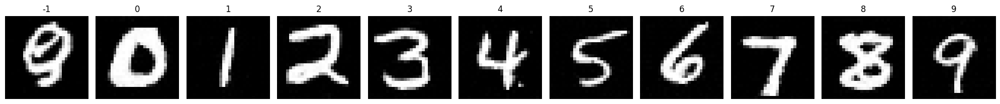

Epoch 142/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2300 - learning_rate: 0.0041


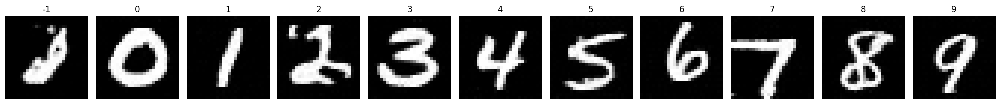

Epoch 143/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2306 - learning_rate: 0.0041


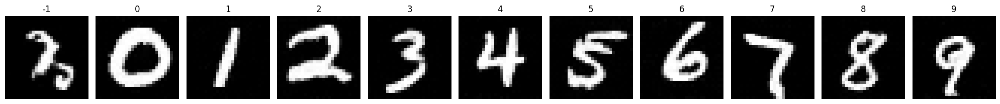

Epoch 144/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2337 - learning_rate: 0.0040


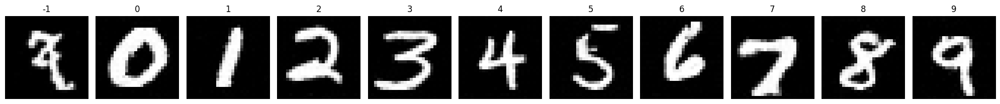

Epoch 145/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2323 - learning_rate: 0.0040


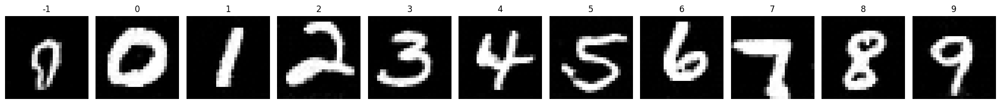

Epoch 146/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2354 - learning_rate: 0.0040


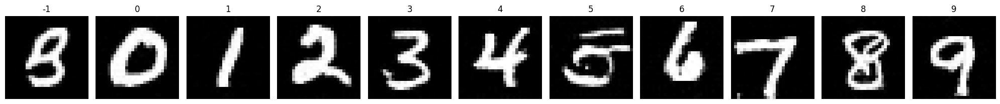

Epoch 147/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2358 - learning_rate: 0.0040


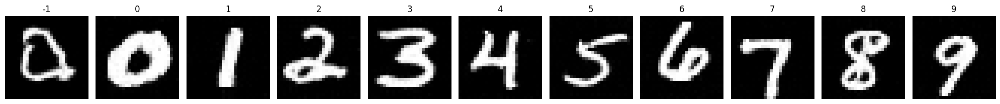

Epoch 148/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2354 - learning_rate: 0.0040


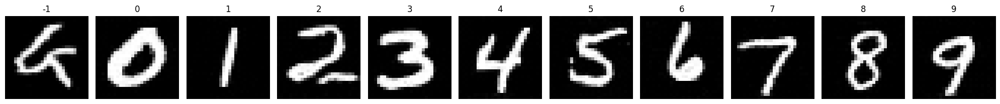

Epoch 149/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2337 - learning_rate: 0.0040


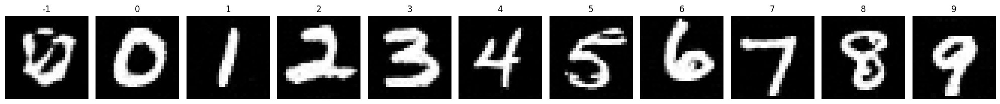

Epoch 150/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2313 - learning_rate: 0.0040


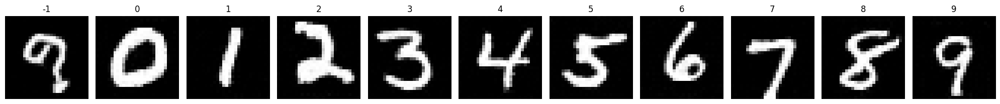

Epoch 151/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0293 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2302 - learning_rate: 0.0040


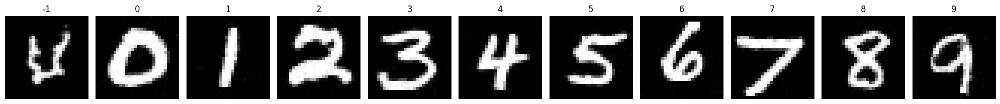

Epoch 152/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2300 - learning_rate: 0.0039


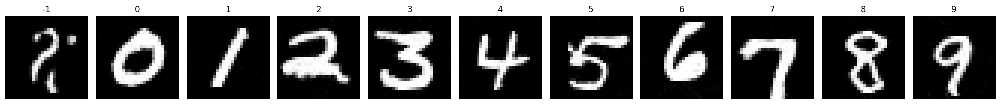

Epoch 153/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2357 - learning_rate: 0.0039


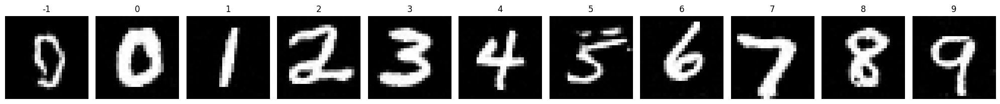

Epoch 154/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0292 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2307 - learning_rate: 0.0039


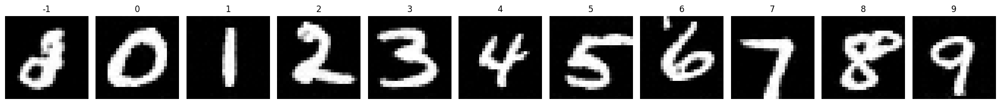

Epoch 155/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2322 - learning_rate: 0.0039


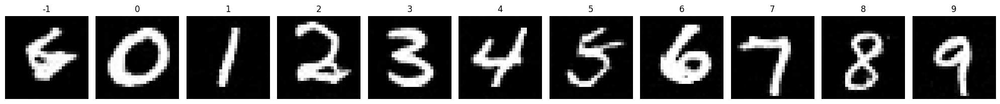

Epoch 156/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2338 - learning_rate: 0.0039


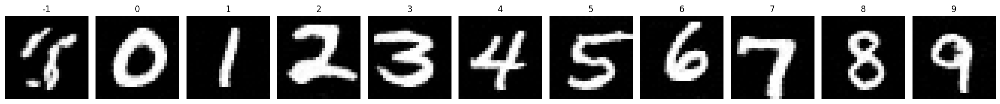

Epoch 157/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2350 - learning_rate: 0.0039


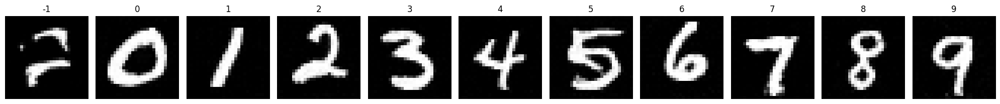

Epoch 158/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2304 - learning_rate: 0.0039


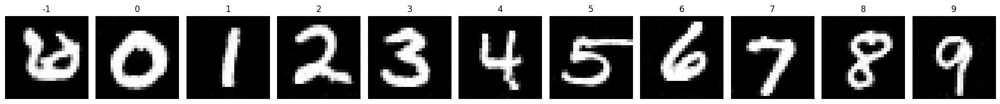

Epoch 159/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2343 - learning_rate: 0.0039


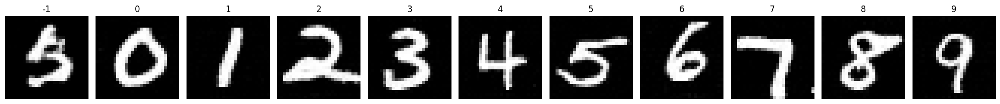

Epoch 160/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2339 - learning_rate: 0.0038


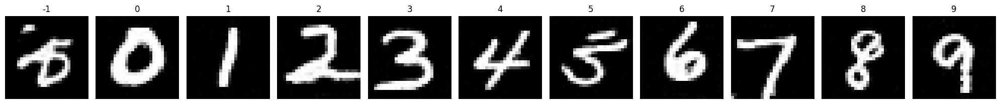

Epoch 161/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2383 - learning_rate: 0.0038


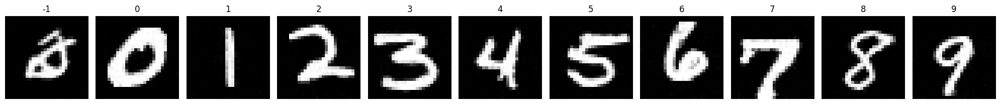

Epoch 162/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2344 - learning_rate: 0.0038


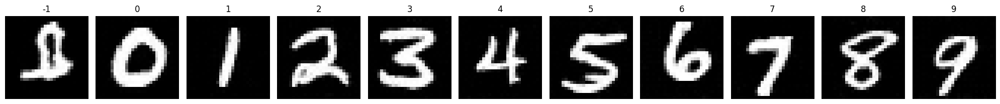

Epoch 163/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2371 - learning_rate: 0.0038


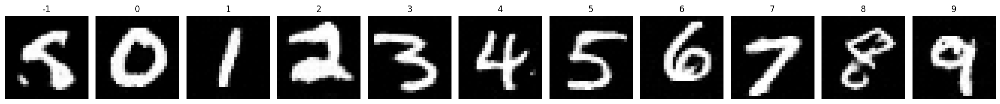

Epoch 164/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2322 - learning_rate: 0.0038


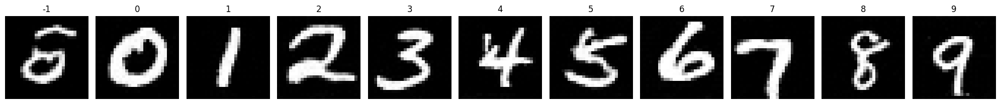

Epoch 165/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2306 - learning_rate: 0.0038


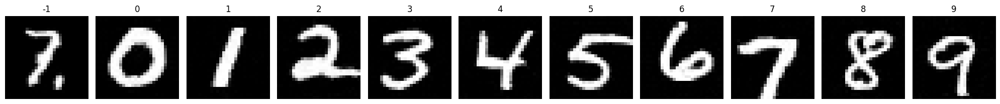

Epoch 166/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2313 - learning_rate: 0.0038


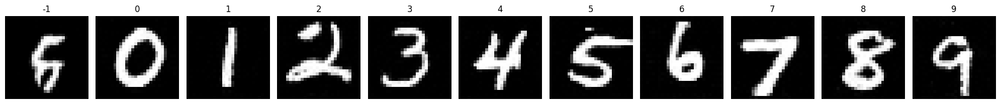

Epoch 167/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2369 - learning_rate: 0.0037


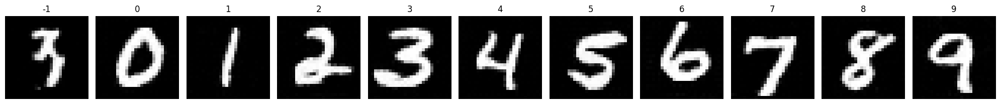

Epoch 168/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2339 - learning_rate: 0.0037


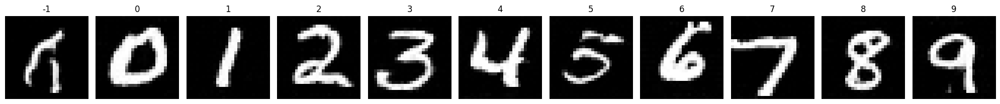

Epoch 169/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2334 - learning_rate: 0.0037


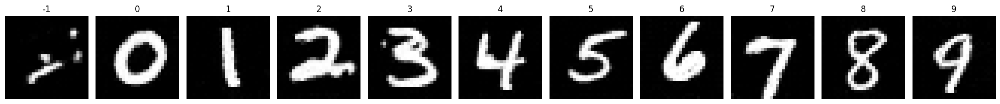

Epoch 170/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2333 - learning_rate: 0.0037


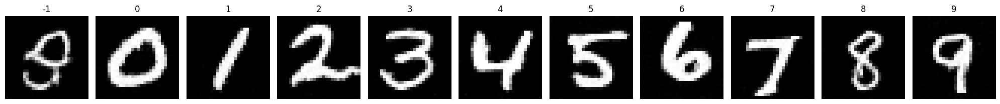

Epoch 171/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2331 - learning_rate: 0.0037


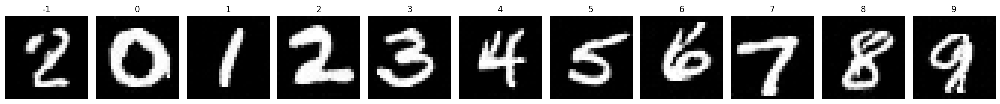

Epoch 172/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2338 - learning_rate: 0.0037


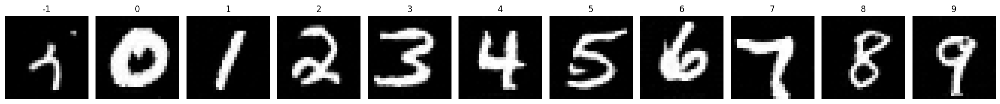

Epoch 173/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2394 - learning_rate: 0.0037


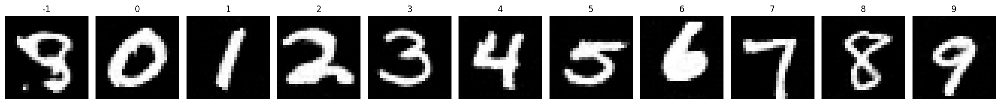

Epoch 174/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2293 - learning_rate: 0.0036


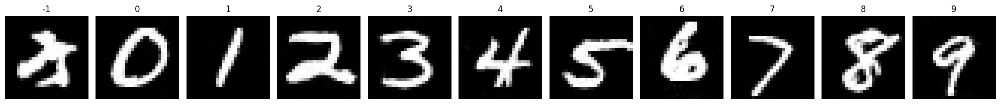

Epoch 175/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2339 - learning_rate: 0.0036


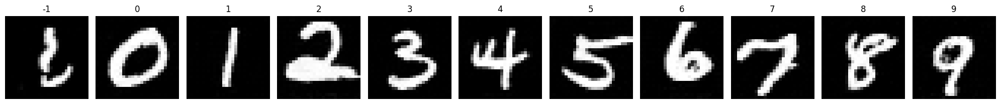

Epoch 176/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0290 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2321 - learning_rate: 0.0036


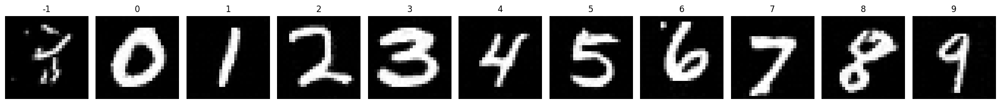

Epoch 177/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2371 - learning_rate: 0.0036


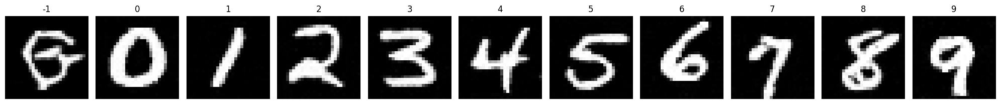

Epoch 178/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2389 - learning_rate: 0.0036


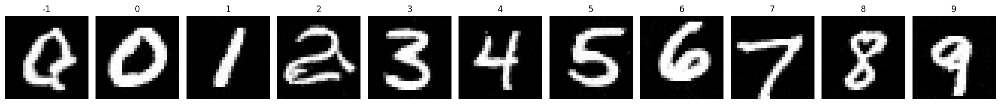

Epoch 179/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2347 - learning_rate: 0.0036


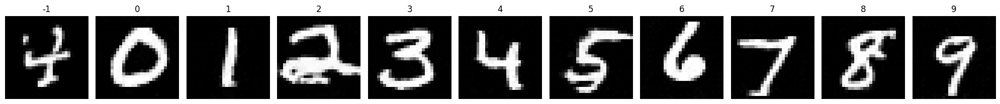

Epoch 180/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2340 - learning_rate: 0.0036


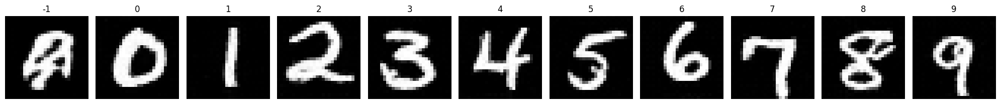

Epoch 181/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2318 - learning_rate: 0.0036


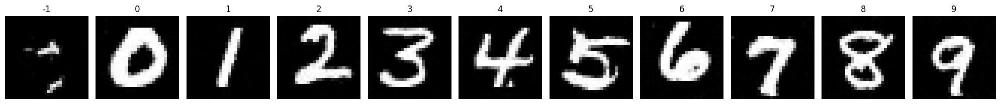

Epoch 182/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0291 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2296 - learning_rate: 0.0035


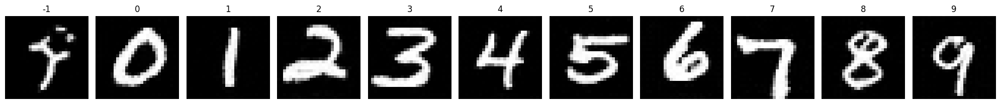

Epoch 183/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0287 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2310 - learning_rate: 0.0035


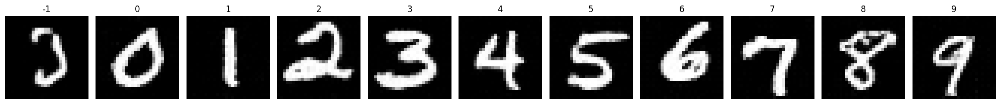

Epoch 184/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2360 - learning_rate: 0.0035


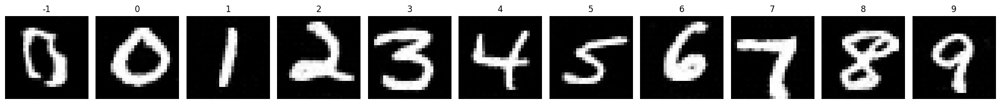

Epoch 185/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2368 - learning_rate: 0.0035


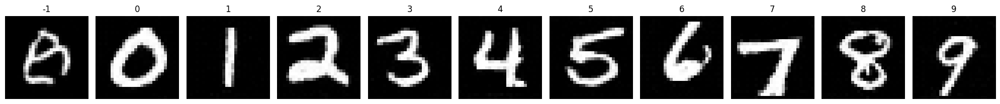

Epoch 186/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2306 - learning_rate: 0.0035


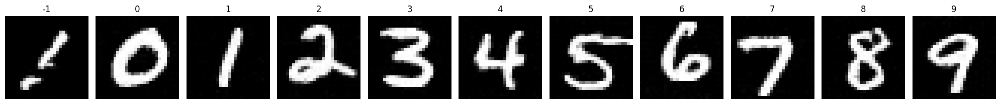

Epoch 187/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2331 - learning_rate: 0.0035


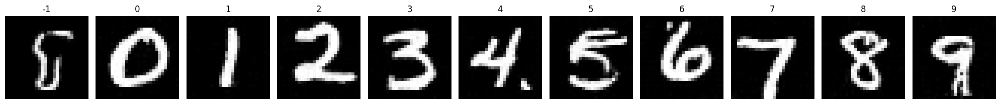

Epoch 188/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2373 - learning_rate: 0.0034


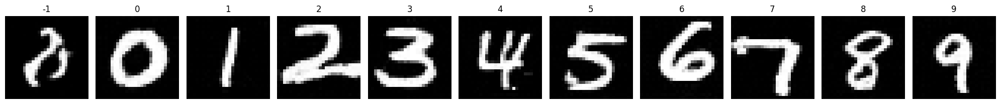

Epoch 189/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2319 - learning_rate: 0.0034


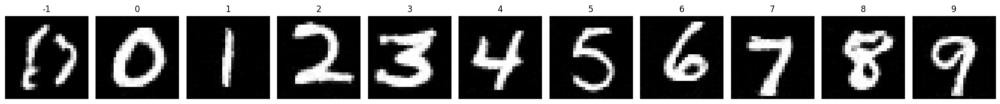

Epoch 190/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2365 - learning_rate: 0.0034


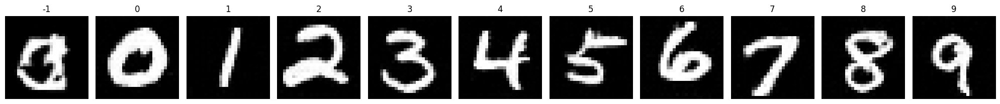

Epoch 191/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2322 - learning_rate: 0.0034


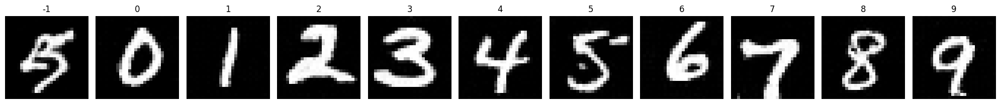

Epoch 192/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2342 - learning_rate: 0.0034


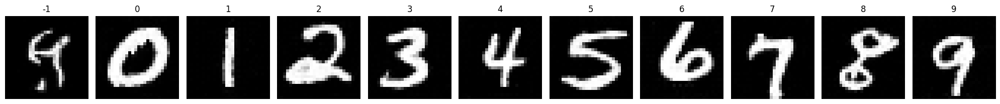

Epoch 193/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2379 - learning_rate: 0.0034


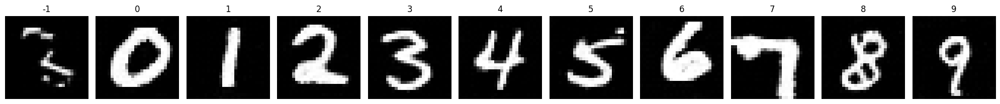

Epoch 194/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2317 - learning_rate: 0.0034


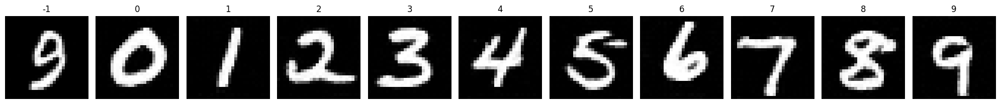

Epoch 195/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2344 - learning_rate: 0.0033


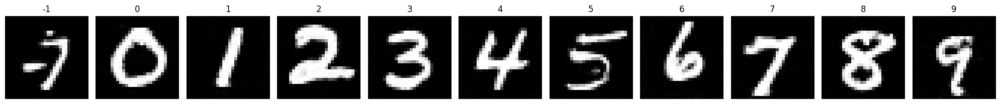

Epoch 196/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2352 - learning_rate: 0.0033


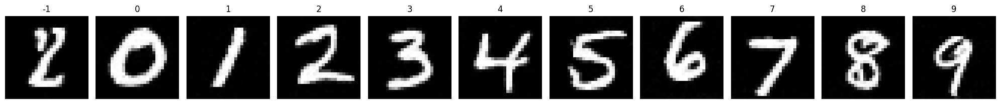

Epoch 197/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2368 - learning_rate: 0.0033


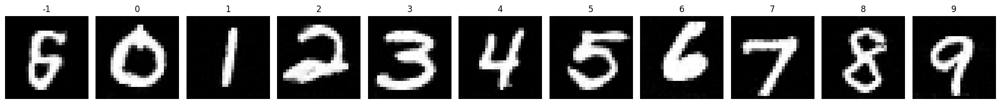

Epoch 198/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0289 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2369 - learning_rate: 0.0033


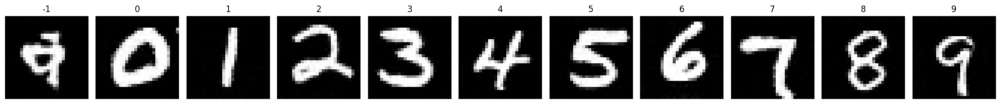

Epoch 199/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2315 - learning_rate: 0.0033


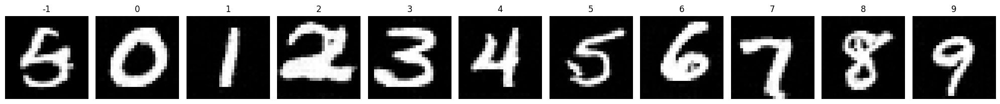

Epoch 200/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0286 - val_loss: 0.0537 - val_noise_loss: 0.0537 - val_image_loss: 0.2378 - learning_rate: 0.0033


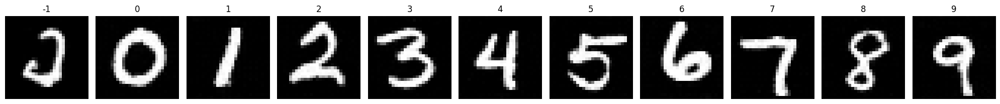

Epoch 201/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2320 - learning_rate: 0.0033


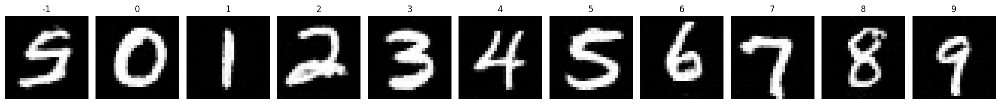

Epoch 202/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2304 - learning_rate: 0.0032


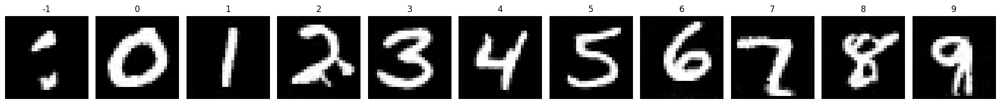

Epoch 203/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0288 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2381 - learning_rate: 0.0032


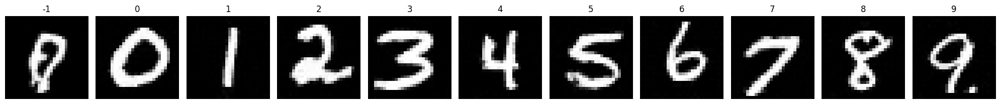

Epoch 204/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2365 - learning_rate: 0.0032


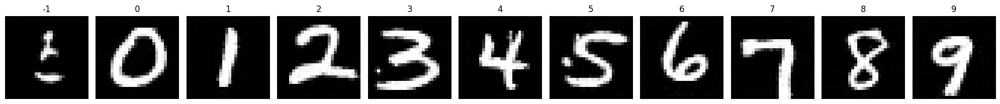

Epoch 205/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2342 - learning_rate: 0.0032


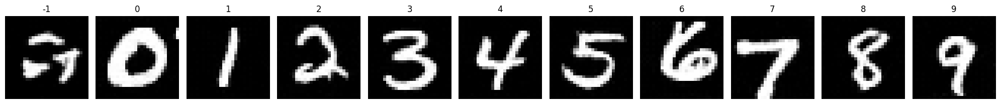

Epoch 206/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2330 - learning_rate: 0.0032


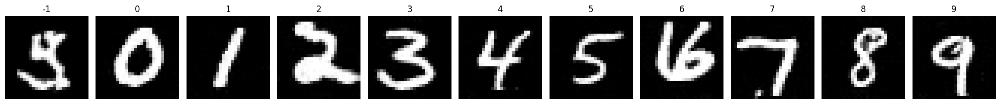

Epoch 207/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2379 - learning_rate: 0.0032


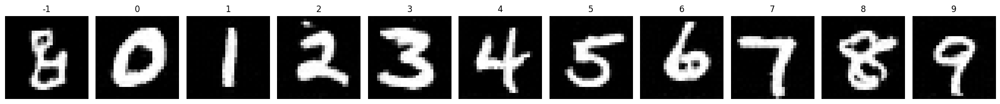

Epoch 208/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2290 - learning_rate: 0.0032


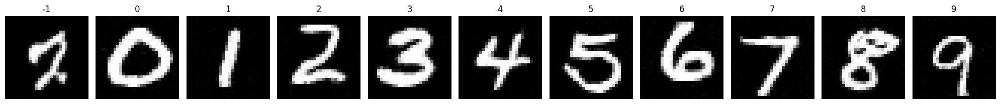

Epoch 209/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2340 - learning_rate: 0.0031


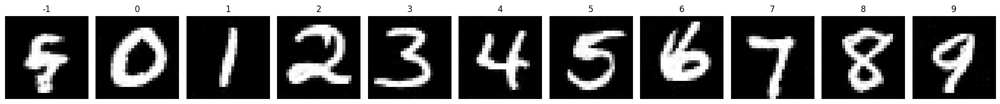

Epoch 210/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2357 - learning_rate: 0.0031


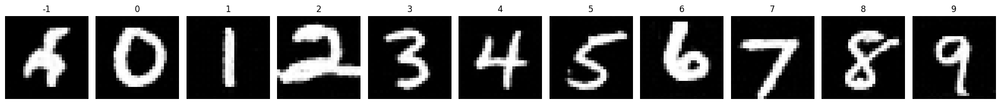

Epoch 211/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2355 - learning_rate: 0.0031


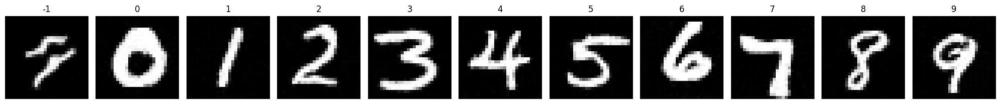

Epoch 212/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2378 - learning_rate: 0.0031


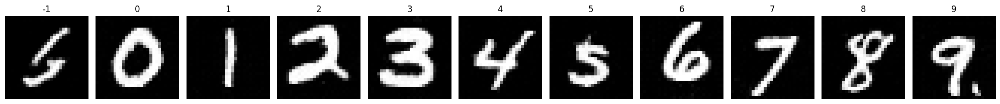

Epoch 213/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2398 - learning_rate: 0.0031


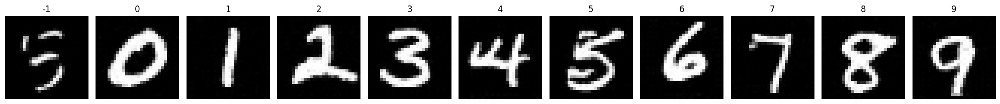

Epoch 214/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2335 - learning_rate: 0.0031


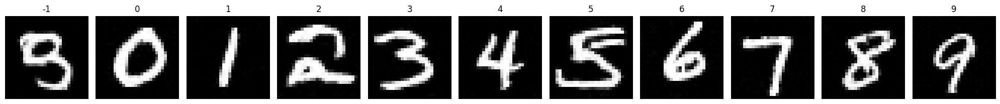

Epoch 215/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2387 - learning_rate: 0.0030


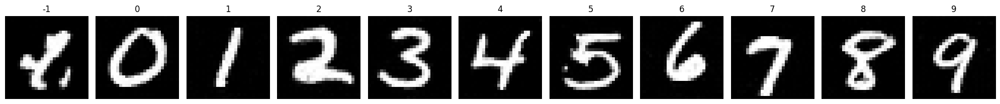

Epoch 216/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2326 - learning_rate: 0.0030


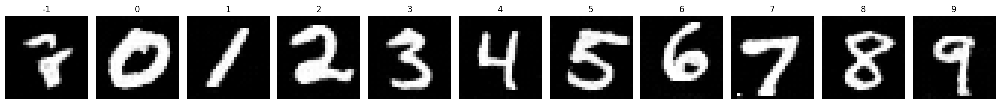

Epoch 217/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2366 - learning_rate: 0.0030


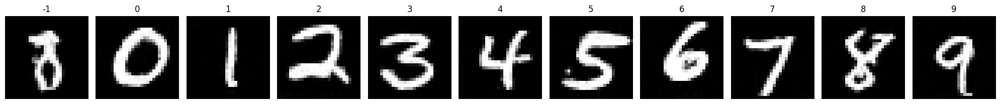

Epoch 218/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2346 - learning_rate: 0.0030


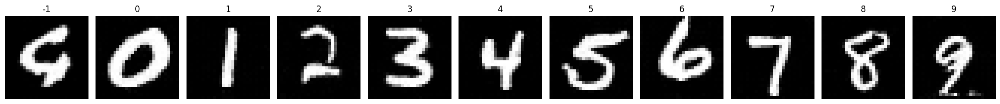

Epoch 219/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0287 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2342 - learning_rate: 0.0030


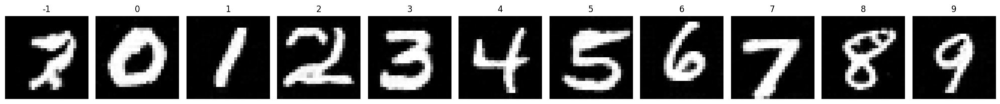

Epoch 220/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2309 - learning_rate: 0.0030


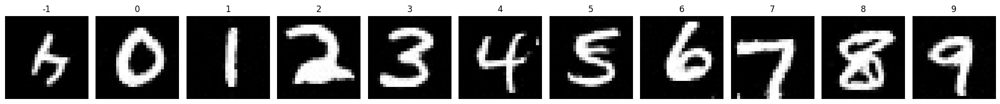

Epoch 221/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2364 - learning_rate: 0.0030


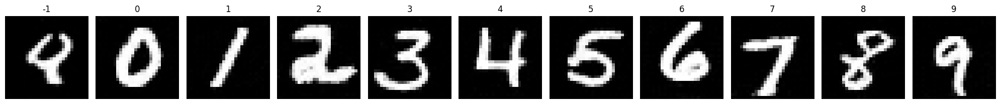

Epoch 222/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2402 - learning_rate: 0.0029


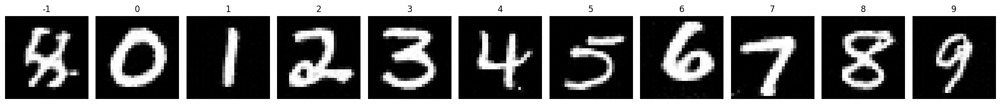

Epoch 223/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2371 - learning_rate: 0.0029


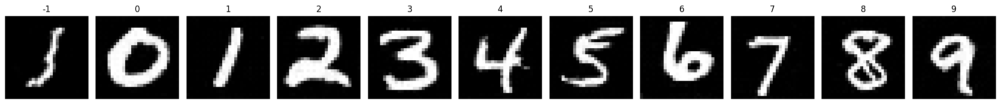

Epoch 224/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2366 - learning_rate: 0.0029


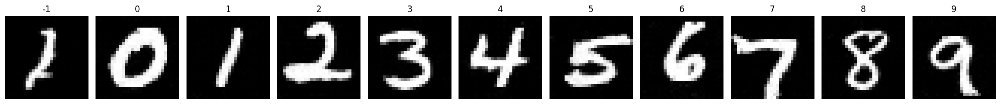

Epoch 225/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2362 - learning_rate: 0.0029


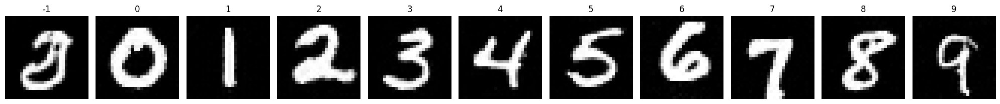

Epoch 226/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2386 - learning_rate: 0.0029


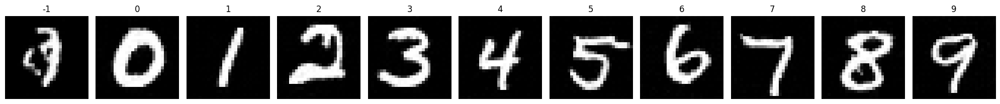

Epoch 227/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2359 - learning_rate: 0.0029


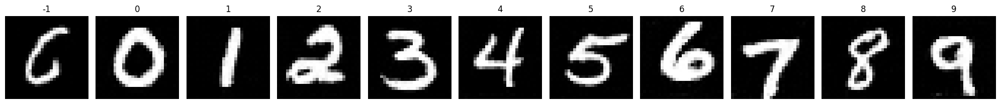

Epoch 228/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2387 - learning_rate: 0.0028


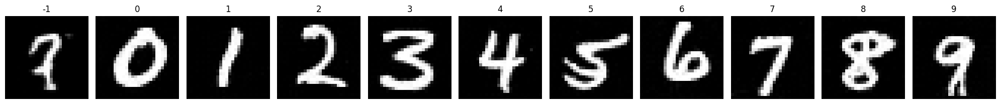

Epoch 229/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2315 - learning_rate: 0.0028


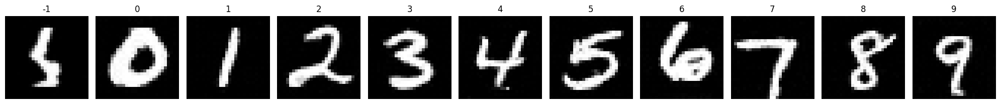

Epoch 230/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2346 - learning_rate: 0.0028


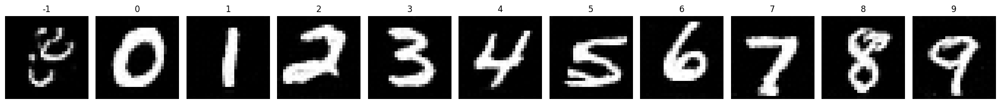

Epoch 231/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2328 - learning_rate: 0.0028


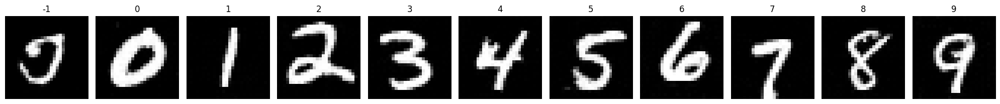

Epoch 232/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2328 - learning_rate: 0.0028


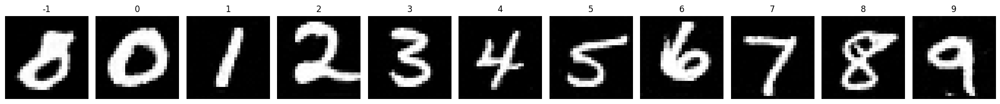

Epoch 233/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2343 - learning_rate: 0.0028


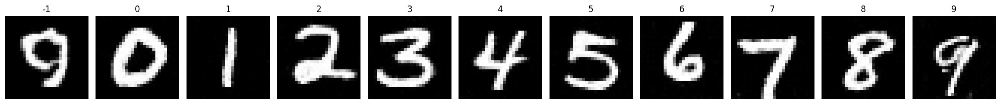

Epoch 234/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2349 - learning_rate: 0.0028


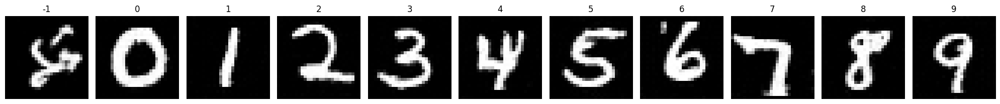

Epoch 235/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2350 - learning_rate: 0.0027


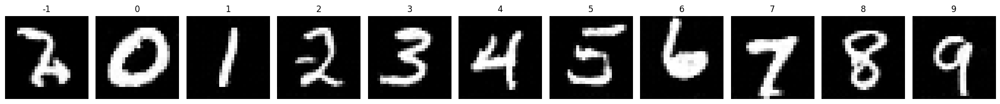

Epoch 236/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2362 - learning_rate: 0.0027


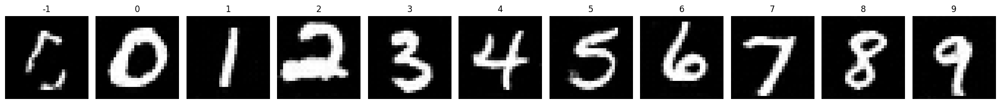

Epoch 237/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0538 - val_noise_loss: 0.0538 - val_image_loss: 0.2399 - learning_rate: 0.0027


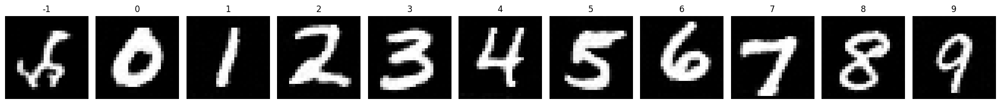

Epoch 238/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2334 - learning_rate: 0.0027


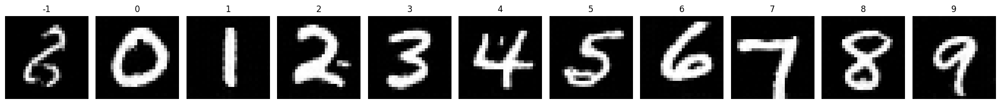

Epoch 239/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2351 - learning_rate: 0.0027


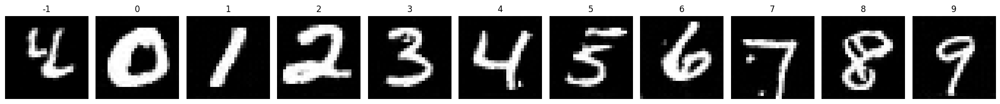

Epoch 240/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0284 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2343 - learning_rate: 0.0027


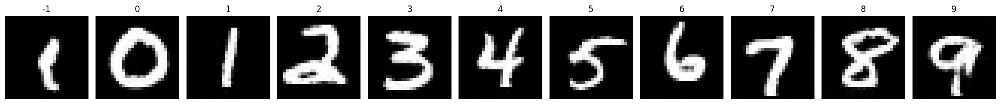

Epoch 241/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2360 - learning_rate: 0.0026


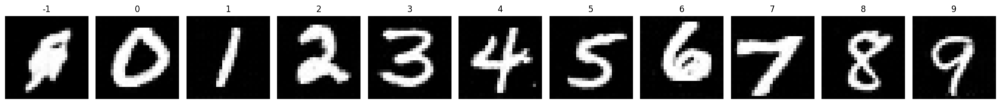

Epoch 242/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2372 - learning_rate: 0.0026


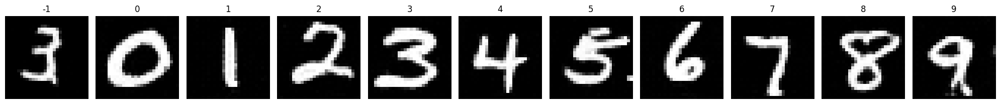

Epoch 243/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2356 - learning_rate: 0.0026


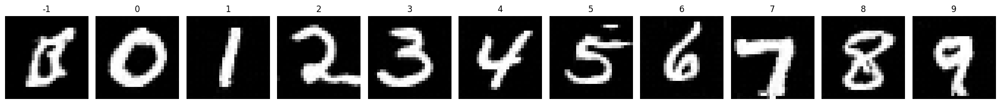

Epoch 244/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2348 - learning_rate: 0.0026


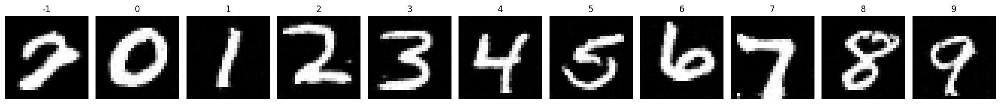

Epoch 245/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2383 - learning_rate: 0.0026


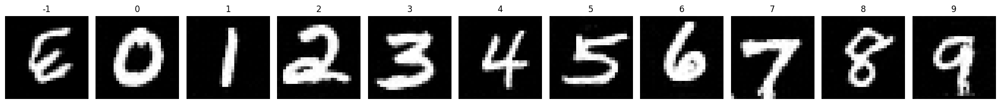

Epoch 246/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2406 - learning_rate: 0.0026


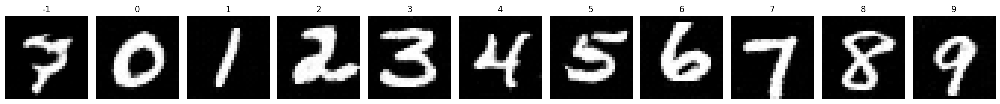

Epoch 247/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2407 - learning_rate: 0.0025


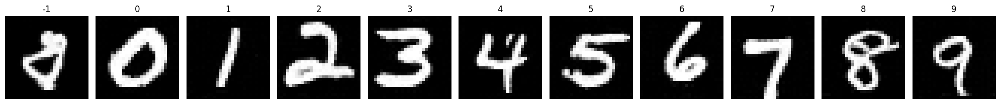

Epoch 248/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0284 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2341 - learning_rate: 0.0025


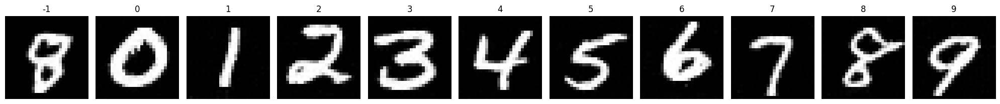

Epoch 249/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0286 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2364 - learning_rate: 0.0025


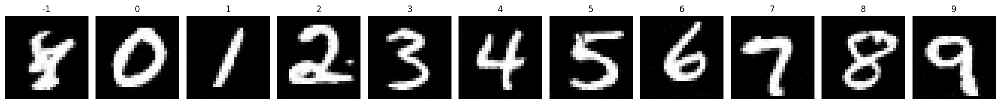

Epoch 250/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2379 - learning_rate: 0.0025


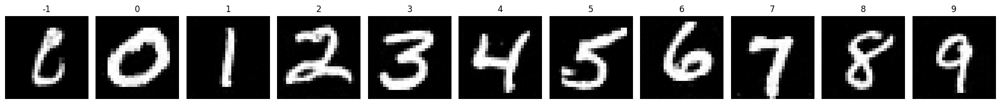

Epoch 251/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2407 - learning_rate: 0.0025


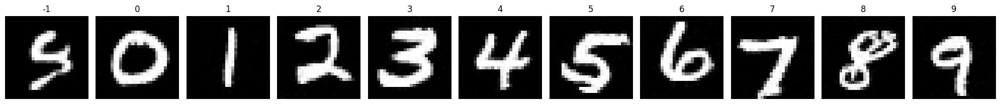

Epoch 252/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2406 - learning_rate: 0.0025


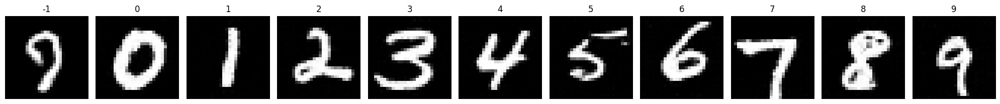

Epoch 253/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0285 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2376 - learning_rate: 0.0025


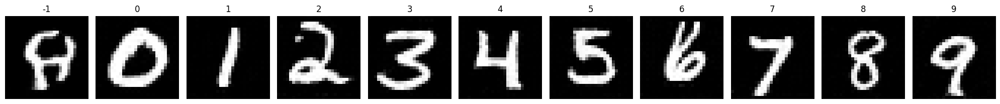

Epoch 254/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2365 - learning_rate: 0.0024


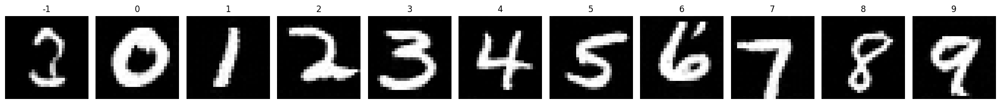

Epoch 255/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2347 - learning_rate: 0.0024


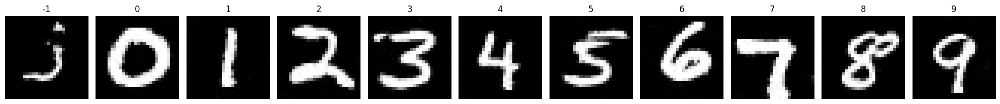

Epoch 256/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2389 - learning_rate: 0.0024


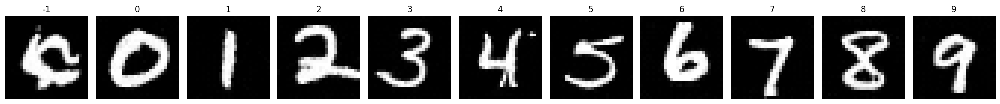

Epoch 257/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0285 - val_loss: 0.0541 - val_noise_loss: 0.0541 - val_image_loss: 0.2367 - learning_rate: 0.0024


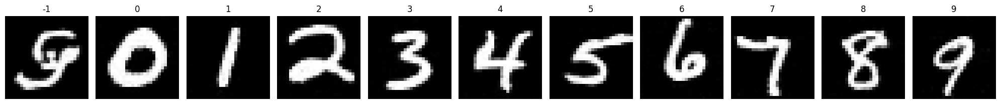

Epoch 258/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0284 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2362 - learning_rate: 0.0024


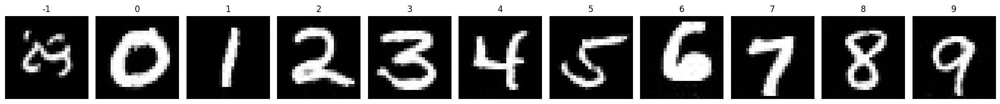

Epoch 259/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2372 - learning_rate: 0.0024


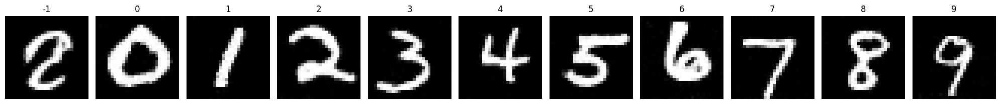

Epoch 260/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2326 - learning_rate: 0.0023


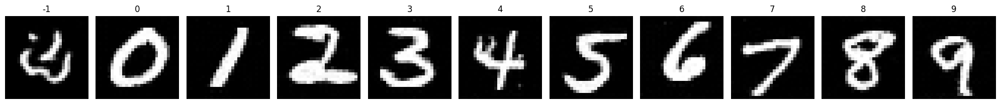

Epoch 261/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2378 - learning_rate: 0.0023


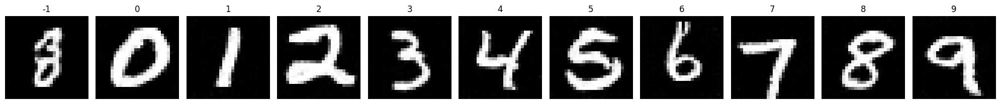

Epoch 262/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2351 - learning_rate: 0.0023


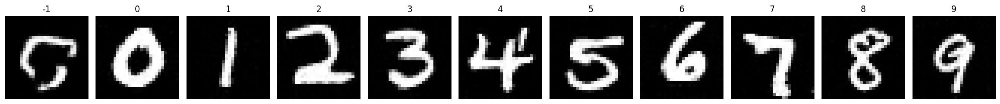

Epoch 263/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2374 - learning_rate: 0.0023


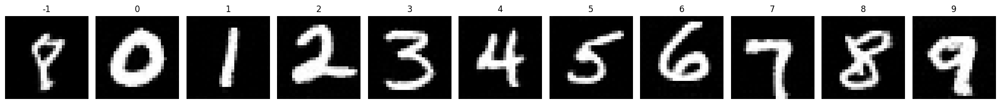

Epoch 264/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0537 - val_noise_loss: 0.0537 - val_image_loss: 0.2397 - learning_rate: 0.0023


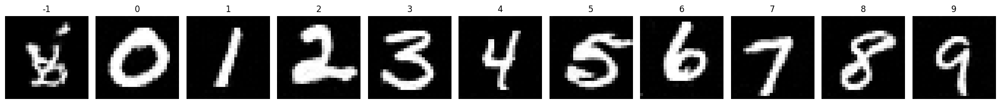

Epoch 265/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2346 - learning_rate: 0.0023


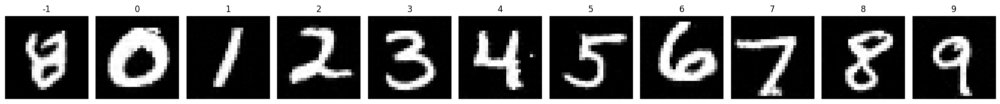

Epoch 266/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2325 - learning_rate: 0.0022


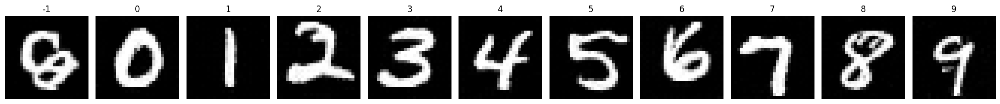

Epoch 267/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2372 - learning_rate: 0.0022


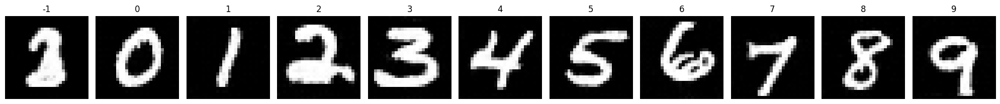

Epoch 268/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2389 - learning_rate: 0.0022


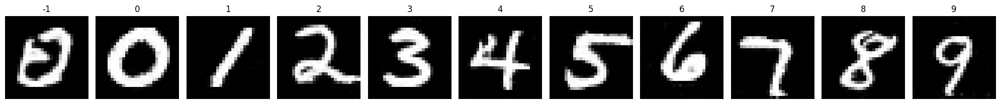

Epoch 269/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2363 - learning_rate: 0.0022


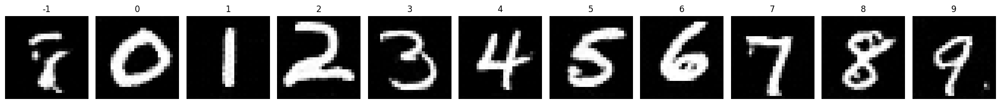

Epoch 270/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2359 - learning_rate: 0.0022


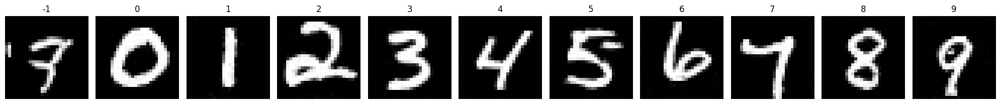

Epoch 271/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2392 - learning_rate: 0.0022


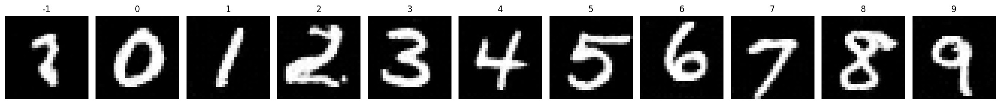

Epoch 272/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2360 - learning_rate: 0.0022


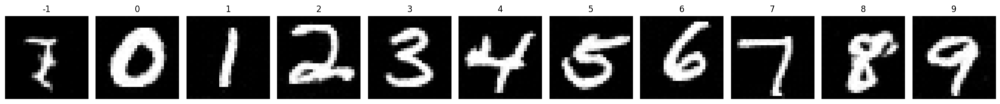

Epoch 273/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0281 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2358 - learning_rate: 0.0021


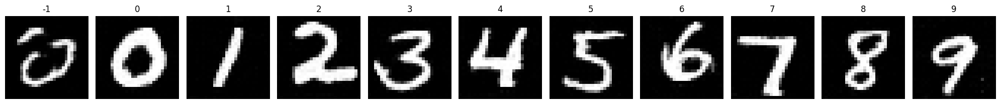

Epoch 274/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0540 - val_noise_loss: 0.0540 - val_image_loss: 0.2388 - learning_rate: 0.0021


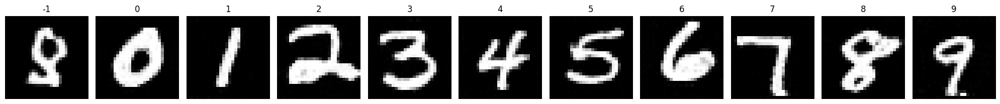

Epoch 275/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2370 - learning_rate: 0.0021


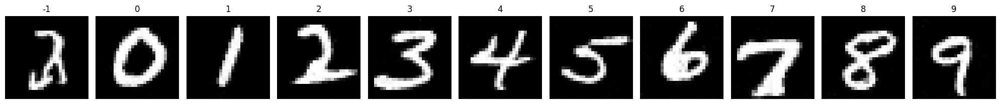

Epoch 276/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2423 - learning_rate: 0.0021


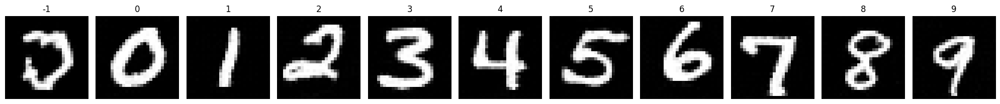

Epoch 277/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0284 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2383 - learning_rate: 0.0021


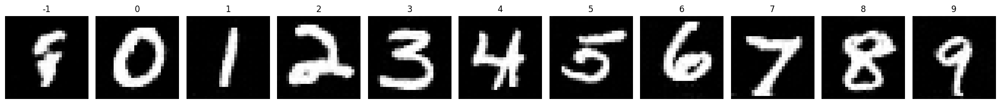

Epoch 278/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2362 - learning_rate: 0.0021


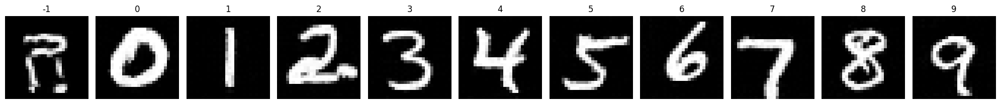

Epoch 279/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2382 - learning_rate: 0.0020


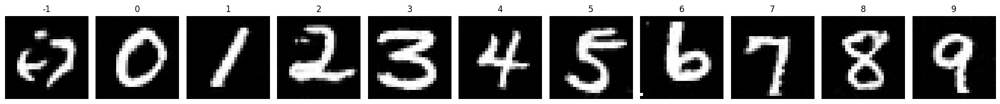

Epoch 280/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2366 - learning_rate: 0.0020


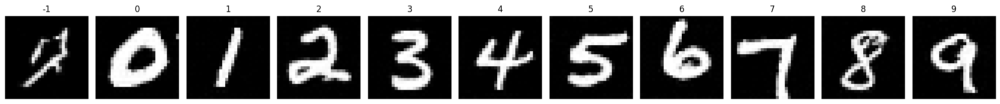

Epoch 281/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2391 - learning_rate: 0.0020


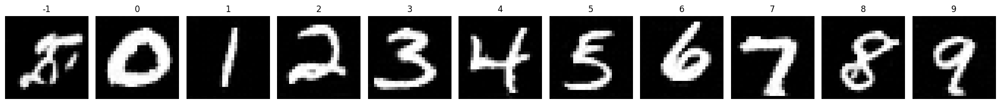

Epoch 282/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2384 - learning_rate: 0.0020


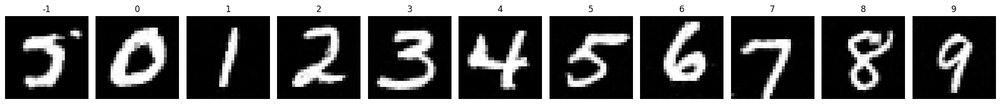

Epoch 283/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0284 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2379 - learning_rate: 0.0020


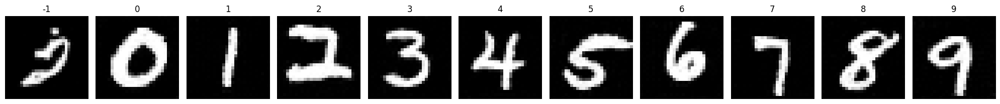

Epoch 284/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2356 - learning_rate: 0.0020


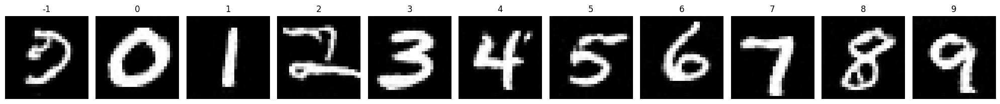

Epoch 285/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0282 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2367 - learning_rate: 0.0020


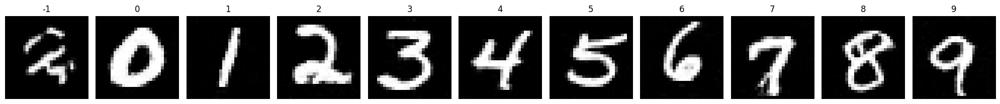

Epoch 286/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2405 - learning_rate: 0.0019


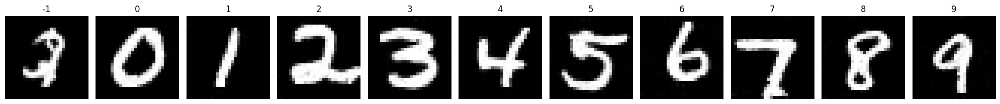

Epoch 287/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0283 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2372 - learning_rate: 0.0019


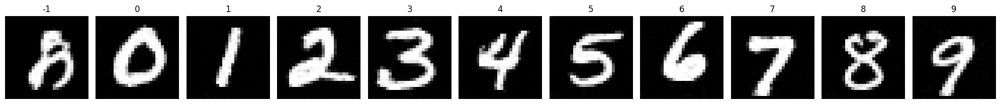

Epoch 288/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2355 - learning_rate: 0.0019


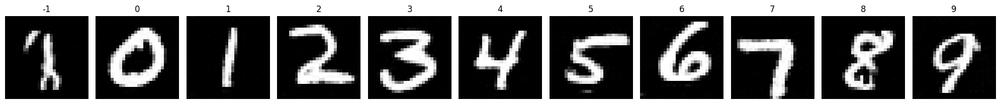

Epoch 289/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2384 - learning_rate: 0.0019


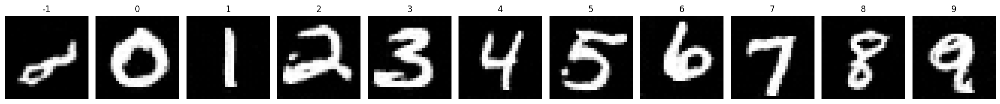

Epoch 290/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0282 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2393 - learning_rate: 0.0019


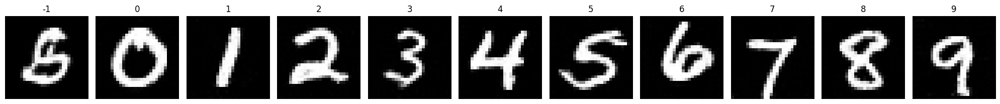

Epoch 291/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0281 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2334 - learning_rate: 0.0019


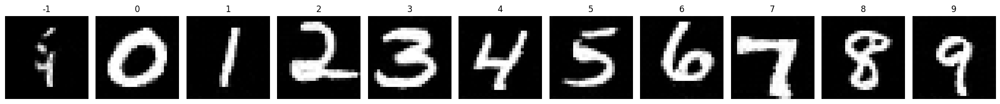

Epoch 292/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2328 - learning_rate: 0.0018


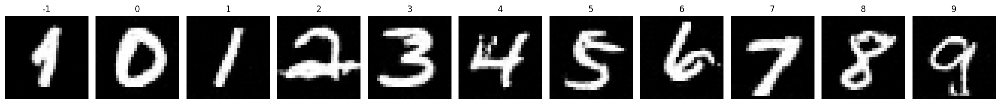

Epoch 293/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2383 - learning_rate: 0.0018


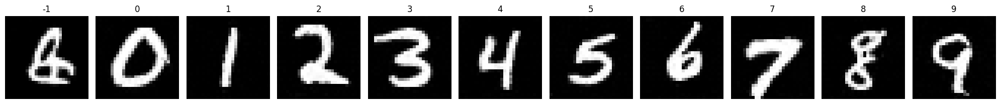

Epoch 294/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2349 - learning_rate: 0.0018


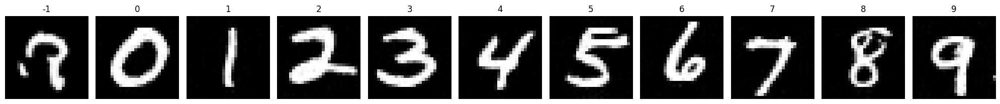

Epoch 295/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2371 - learning_rate: 0.0018


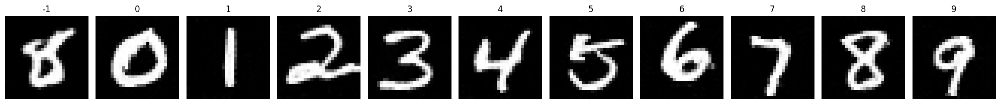

Epoch 296/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2376 - learning_rate: 0.0018


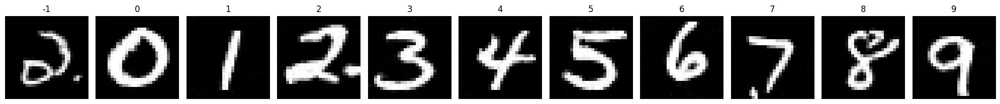

Epoch 297/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2346 - learning_rate: 0.0018


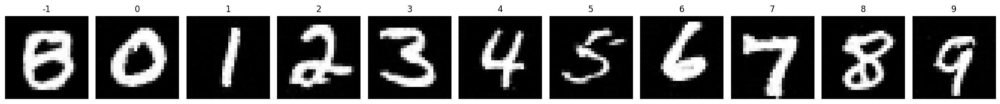

Epoch 298/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2359 - learning_rate: 0.0018


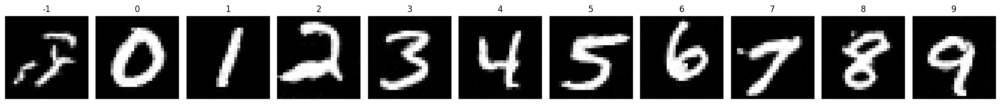

Epoch 299/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2378 - learning_rate: 0.0017


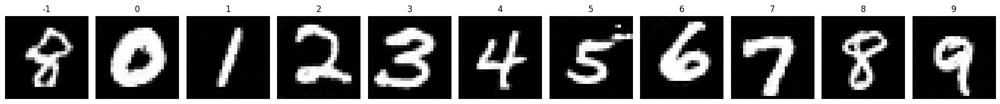

Epoch 300/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2367 - learning_rate: 0.0017


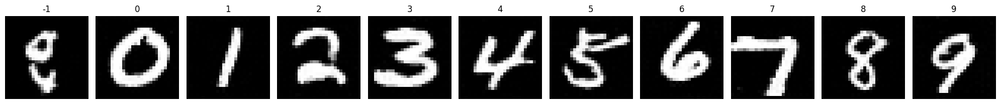

Epoch 301/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2336 - learning_rate: 0.0017


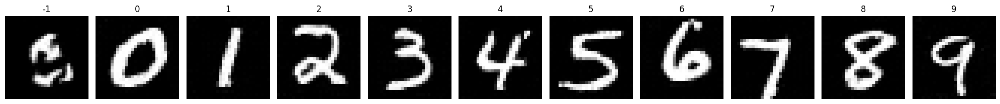

Epoch 302/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0539 - val_noise_loss: 0.0539 - val_image_loss: 0.2433 - learning_rate: 0.0017


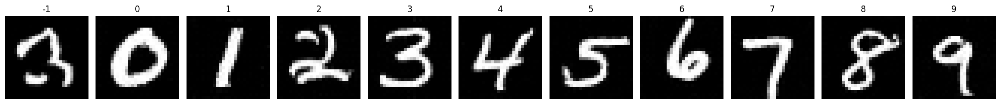

Epoch 303/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2398 - learning_rate: 0.0017


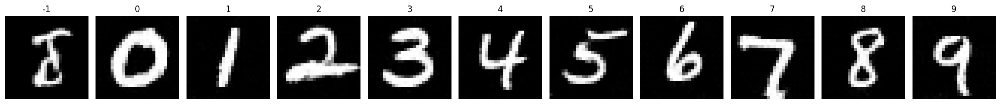

Epoch 304/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2325 - learning_rate: 0.0017


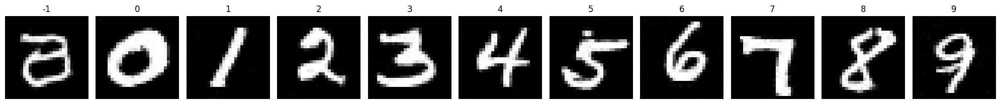

Epoch 305/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2338 - learning_rate: 0.0017


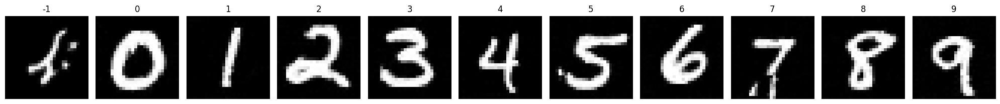

Epoch 306/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2362 - learning_rate: 0.0016


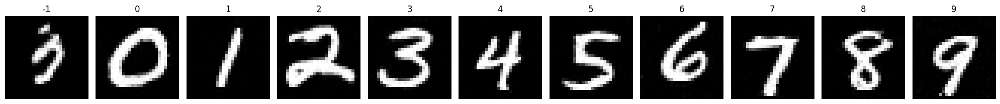

Epoch 307/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2394 - learning_rate: 0.0016


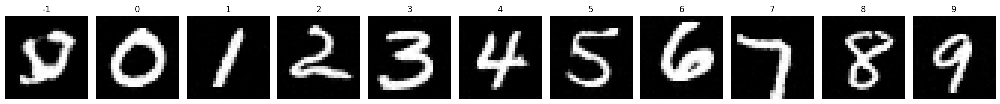

Epoch 308/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0281 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2358 - learning_rate: 0.0016


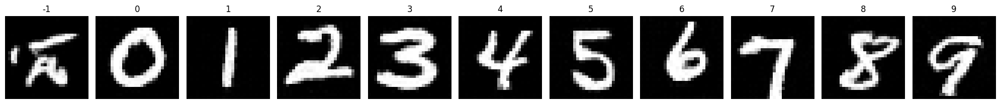

Epoch 309/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2348 - learning_rate: 0.0016


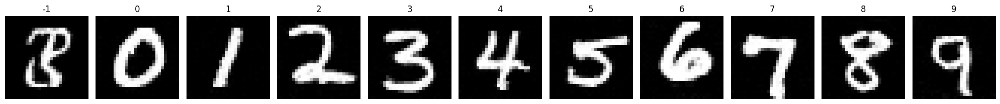

Epoch 310/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2405 - learning_rate: 0.0016


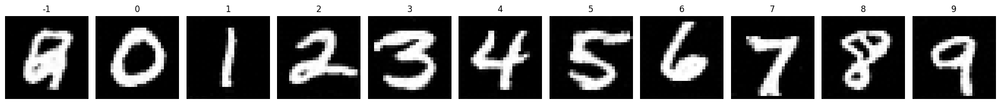

Epoch 311/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2355 - learning_rate: 0.0016


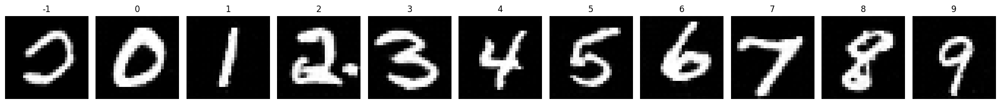

Epoch 312/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2395 - learning_rate: 0.0016


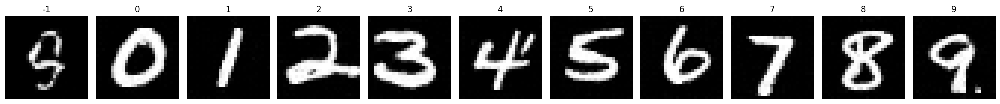

Epoch 313/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2383 - learning_rate: 0.0015


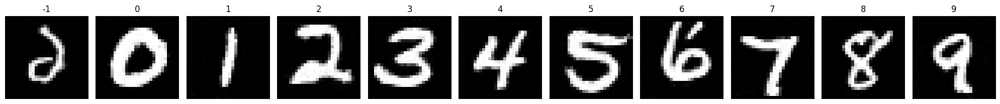

Epoch 314/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0282 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2349 - learning_rate: 0.0015


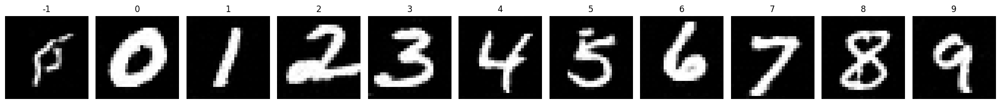

Epoch 315/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2375 - learning_rate: 0.0015


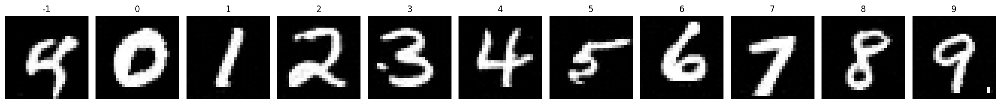

Epoch 316/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0543 - val_noise_loss: 0.0543 - val_image_loss: 0.2381 - learning_rate: 0.0015


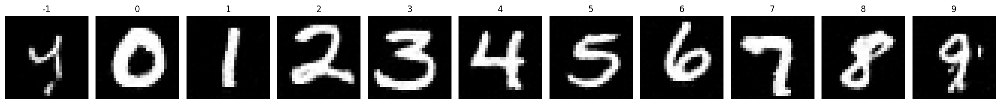

Epoch 317/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2405 - learning_rate: 0.0015


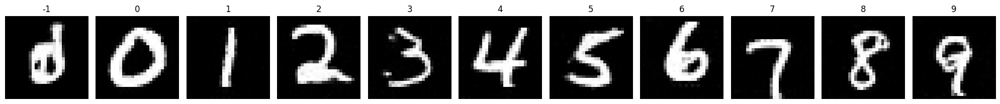

Epoch 318/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2404 - learning_rate: 0.0015


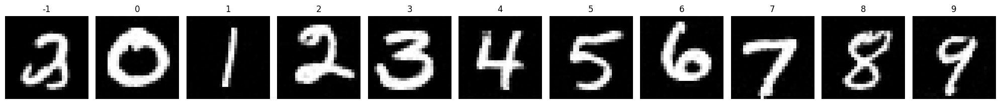

Epoch 319/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0282 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2420 - learning_rate: 0.0014


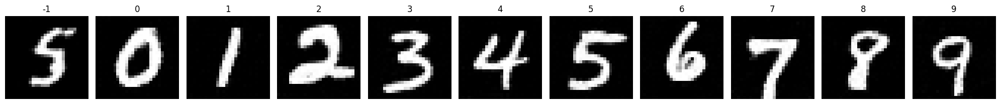

Epoch 320/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2355 - learning_rate: 0.0014


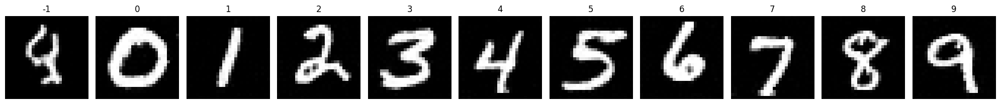

Epoch 321/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2351 - learning_rate: 0.0014


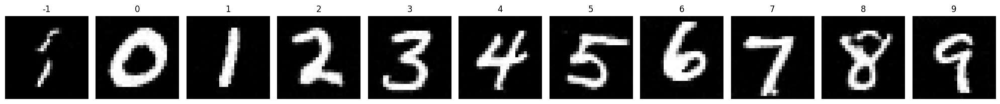

Epoch 322/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0280 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2387 - learning_rate: 0.0014


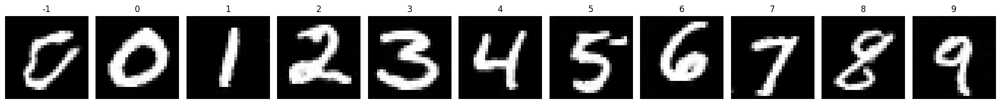

Epoch 323/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2389 - learning_rate: 0.0014


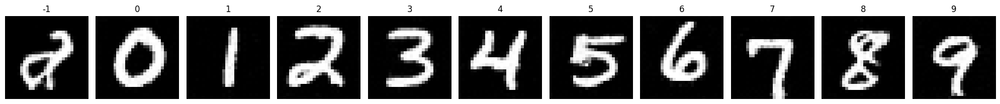

Epoch 324/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0280 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2375 - learning_rate: 0.0014


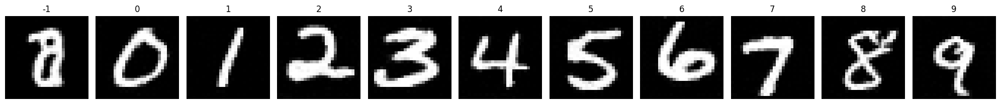

Epoch 325/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2365 - learning_rate: 0.0014


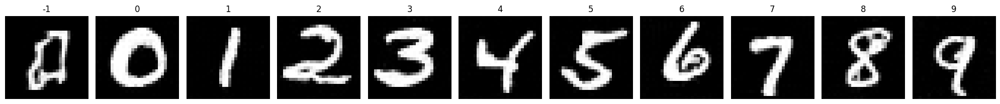

Epoch 326/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2363 - learning_rate: 0.0014


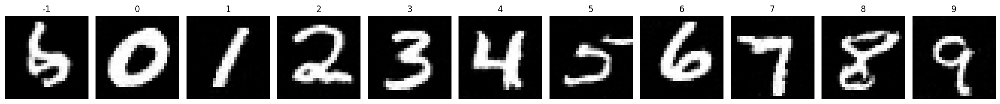

Epoch 327/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0279 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2424 - learning_rate: 0.0013


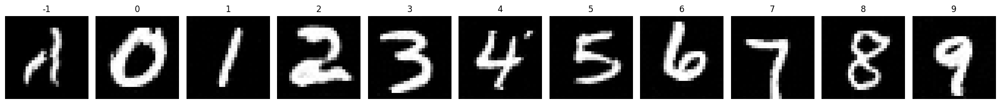

Epoch 328/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2392 - learning_rate: 0.0013


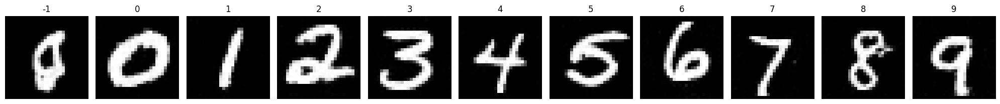

Epoch 329/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2373 - learning_rate: 0.0013


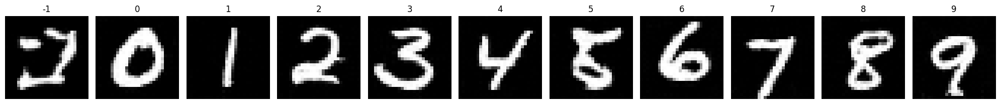

Epoch 330/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2413 - learning_rate: 0.0013


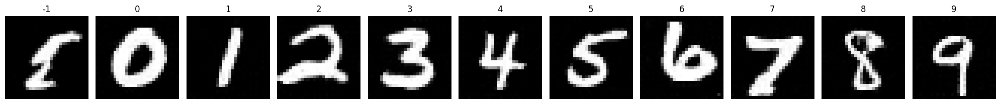

Epoch 331/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2422 - learning_rate: 0.0013


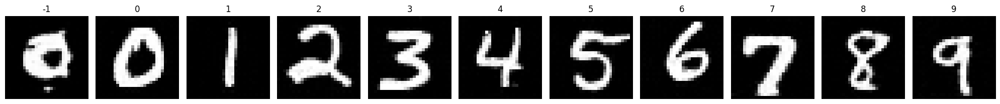

Epoch 332/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0281 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2362 - learning_rate: 0.0013


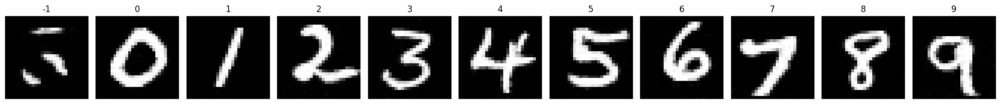

Epoch 333/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2388 - learning_rate: 0.0013


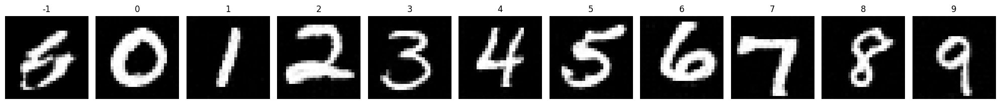

Epoch 334/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2392 - learning_rate: 0.0012


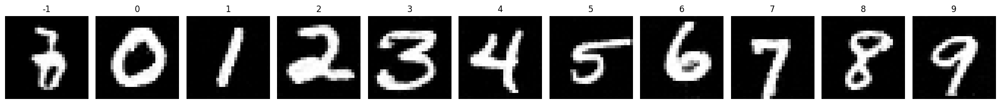

Epoch 335/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2365 - learning_rate: 0.0012


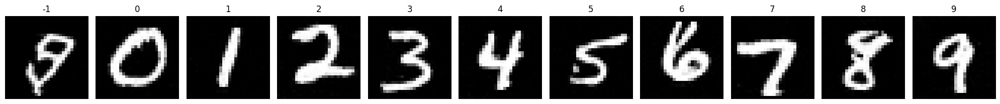

Epoch 336/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2352 - learning_rate: 0.0012


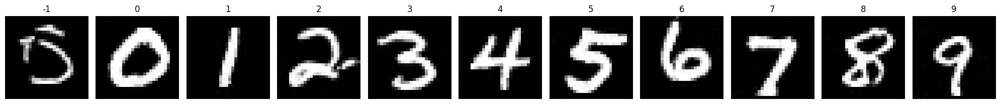

Epoch 337/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2441 - learning_rate: 0.0012


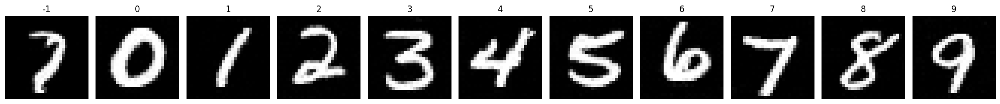

Epoch 338/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2393 - learning_rate: 0.0012


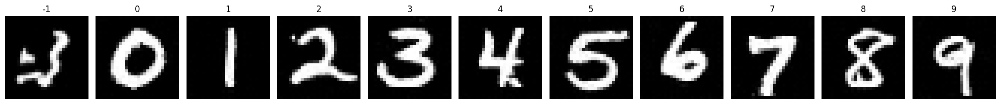

Epoch 339/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2390 - learning_rate: 0.0012


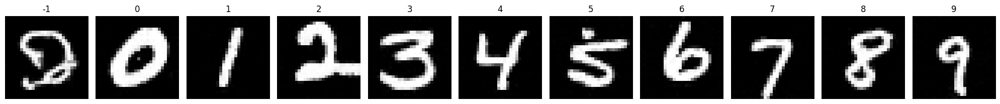

Epoch 340/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2375 - learning_rate: 0.0012


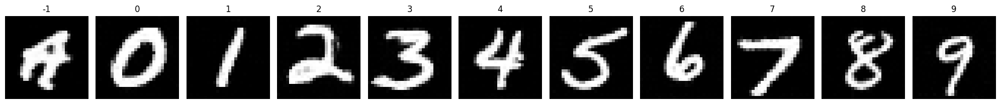

Epoch 341/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2419 - learning_rate: 0.0011


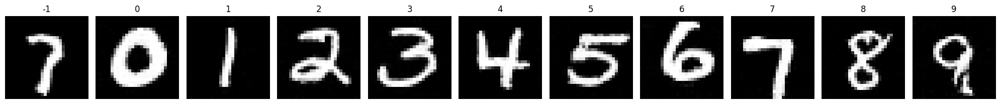

Epoch 342/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2352 - learning_rate: 0.0011


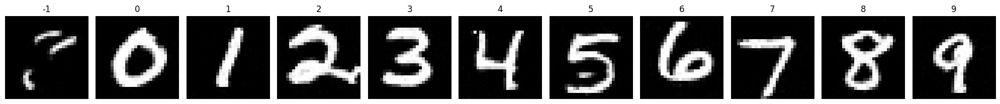

Epoch 343/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0544 - val_noise_loss: 0.0544 - val_image_loss: 0.2400 - learning_rate: 0.0011


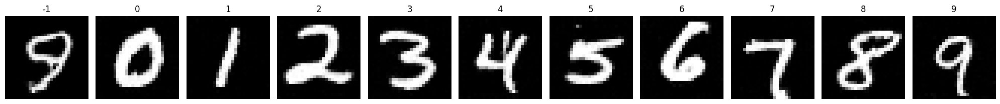

Epoch 344/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0280 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2382 - learning_rate: 0.0011


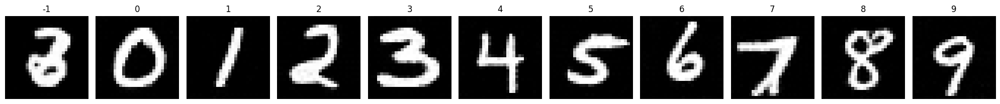

Epoch 345/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0546 - val_noise_loss: 0.0546 - val_image_loss: 0.2445 - learning_rate: 0.0011


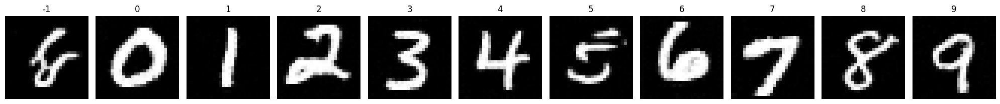

Epoch 346/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2339 - learning_rate: 0.0011


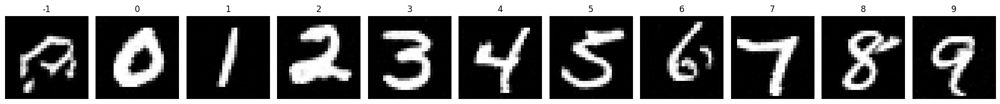

Epoch 347/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2378 - learning_rate: 0.0011


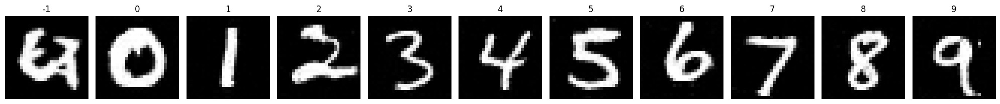

Epoch 348/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2368 - learning_rate: 0.0011


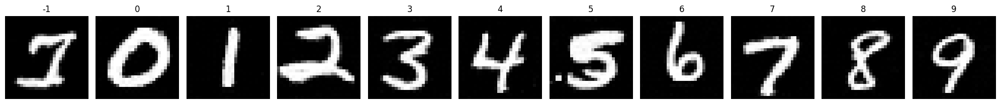

Epoch 349/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2382 - learning_rate: 0.0010


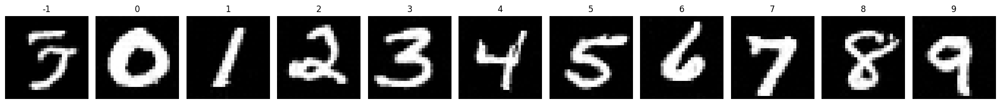

Epoch 350/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0278 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2444 - learning_rate: 0.0010


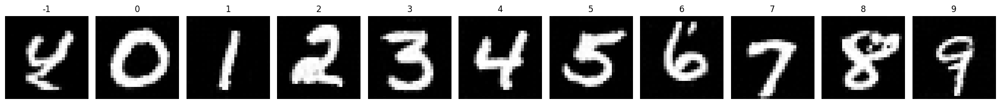

Epoch 351/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2378 - learning_rate: 0.0010


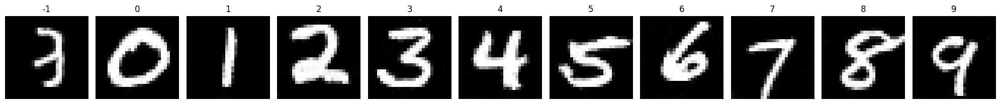

Epoch 352/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2380 - learning_rate: 0.0010


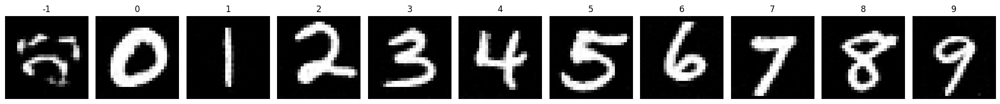

Epoch 353/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2391 - learning_rate: 9.9268e-04


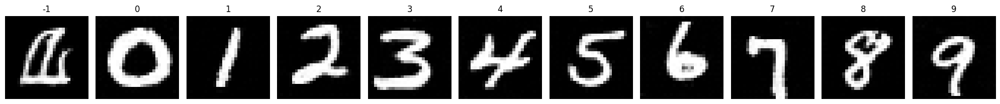

Epoch 354/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0547 - val_noise_loss: 0.0547 - val_image_loss: 0.2423 - learning_rate: 9.8017e-04


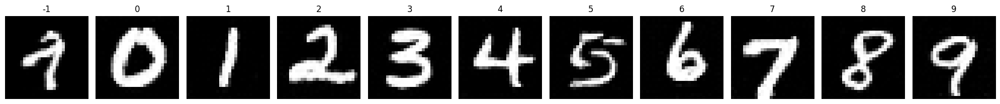

Epoch 355/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2390 - learning_rate: 9.6773e-04


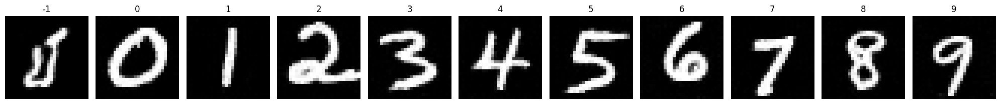

Epoch 356/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2405 - learning_rate: 9.5535e-04


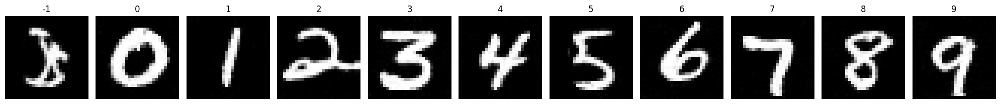

Epoch 357/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2385 - learning_rate: 9.4303e-04


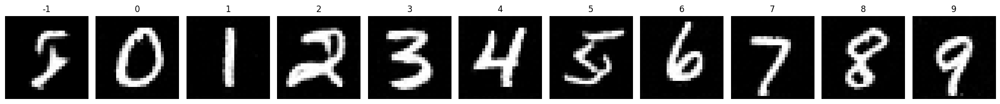

Epoch 358/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2410 - learning_rate: 9.3077e-04


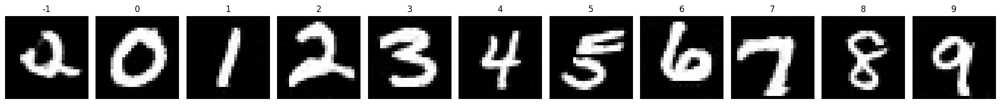

Epoch 359/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0279 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2368 - learning_rate: 9.1857e-04


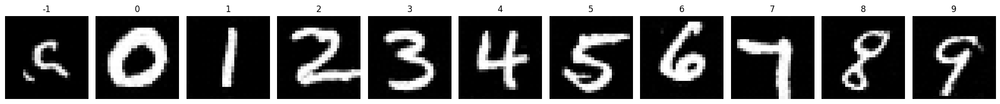

Epoch 360/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2388 - learning_rate: 9.0644e-04


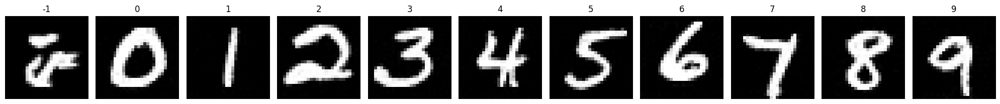

Epoch 361/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2366 - learning_rate: 8.9437e-04


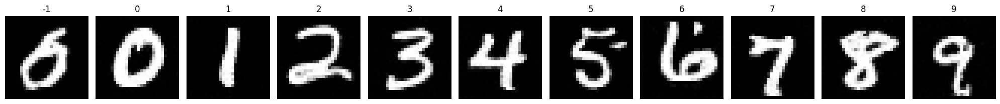

Epoch 362/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0278 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2383 - learning_rate: 8.8236e-04


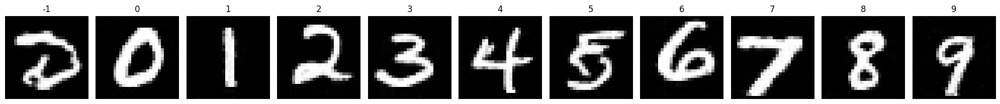

Epoch 363/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2419 - learning_rate: 8.7042e-04


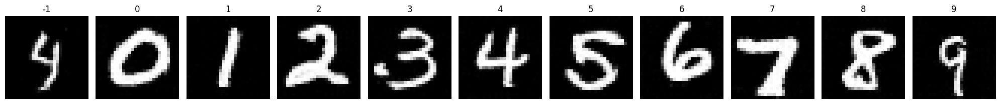

Epoch 364/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2410 - learning_rate: 8.5854e-04


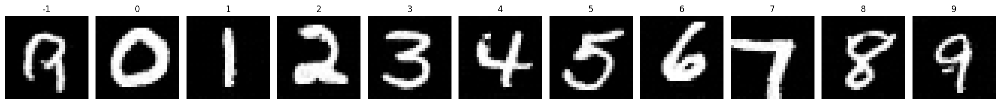

Epoch 365/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2417 - learning_rate: 8.4672e-04


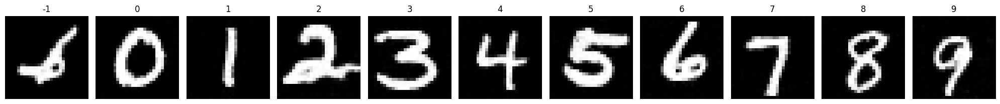

Epoch 366/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2399 - learning_rate: 8.3497e-04


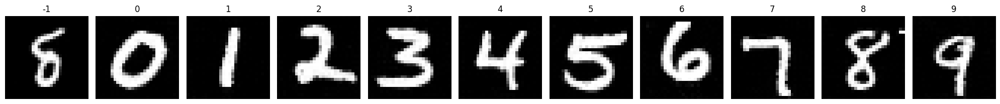

Epoch 367/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2419 - learning_rate: 8.2329e-04


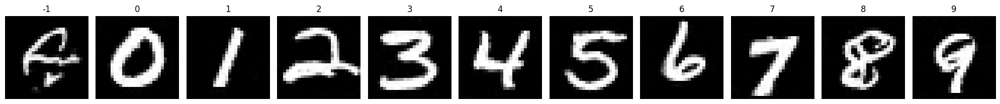

Epoch 368/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2394 - learning_rate: 8.1167e-04


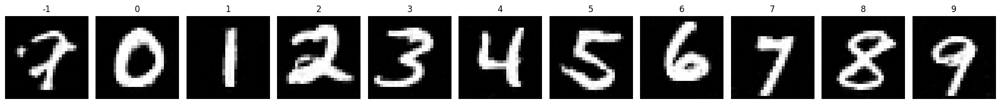

Epoch 369/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0542 - val_noise_loss: 0.0542 - val_image_loss: 0.2480 - learning_rate: 8.0012e-04


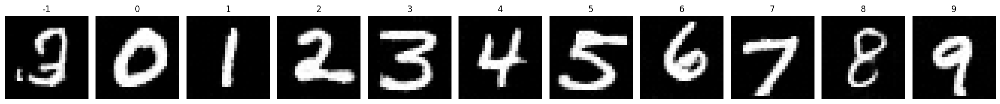

Epoch 370/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2371 - learning_rate: 7.8863e-04


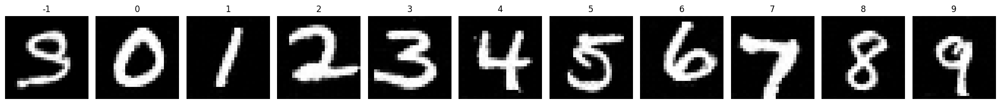

Epoch 371/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2389 - learning_rate: 7.7722e-04


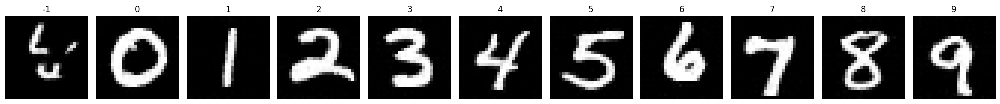

Epoch 372/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2413 - learning_rate: 7.6587e-04


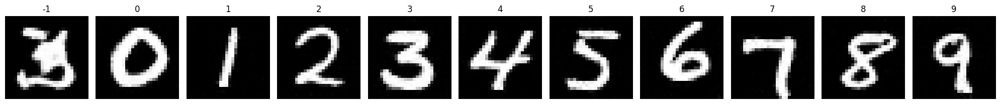

Epoch 373/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0545 - val_noise_loss: 0.0545 - val_image_loss: 0.2405 - learning_rate: 7.5459e-04


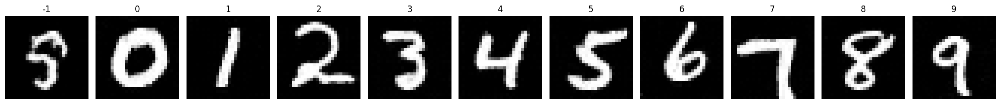

Epoch 374/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2405 - learning_rate: 7.4337e-04


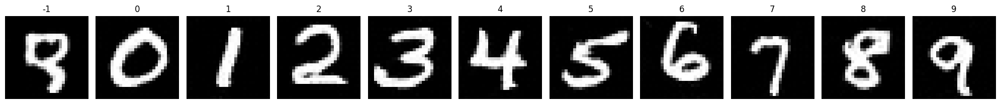

Epoch 375/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2389 - learning_rate: 7.3223e-04


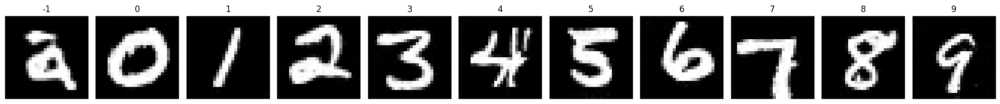

Epoch 376/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2418 - learning_rate: 7.2116e-04


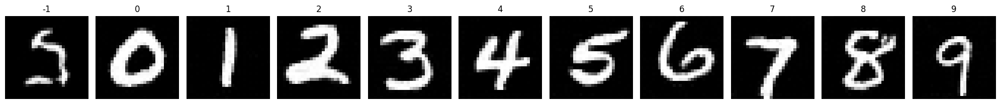

Epoch 377/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2456 - learning_rate: 7.1016e-04


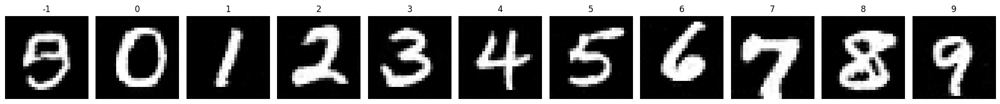

Epoch 378/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2404 - learning_rate: 6.9923e-04


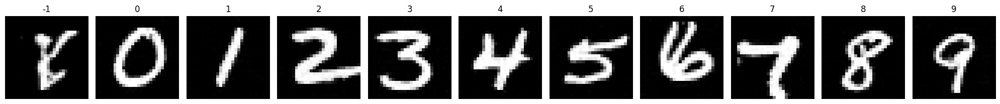

Epoch 379/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2419 - learning_rate: 6.8837e-04


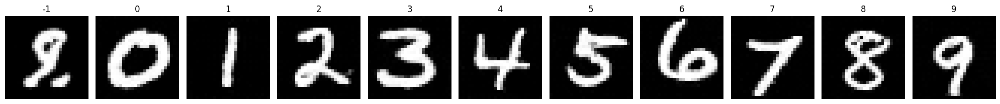

Epoch 380/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2405 - learning_rate: 6.7758e-04


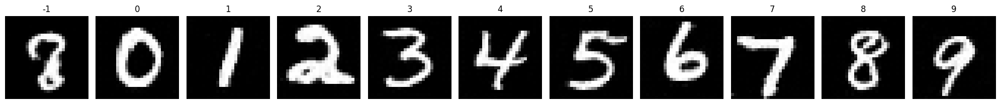

Epoch 381/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0279 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2409 - learning_rate: 6.6686e-04


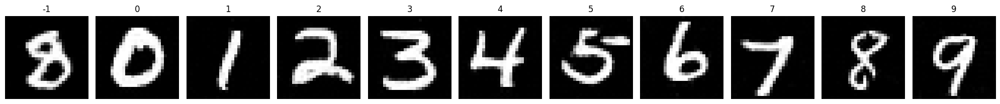

Epoch 382/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2402 - learning_rate: 6.5622e-04


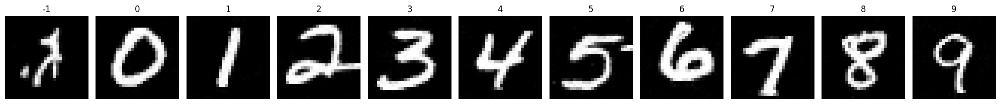

Epoch 383/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2477 - learning_rate: 6.4565e-04


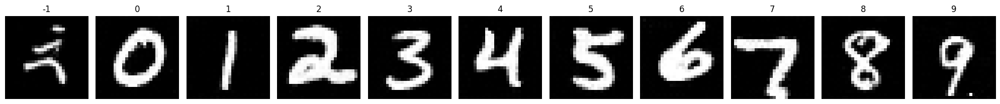

Epoch 384/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2409 - learning_rate: 6.3515e-04


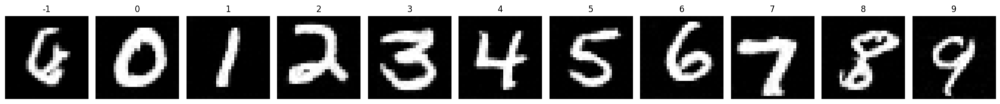

Epoch 385/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2396 - learning_rate: 6.2472e-04


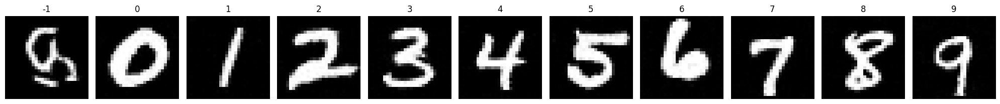

Epoch 386/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2420 - learning_rate: 6.1437e-04


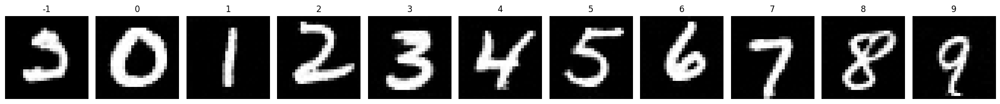

Epoch 387/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2401 - learning_rate: 6.0410e-04


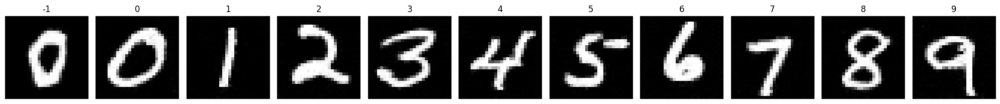

Epoch 388/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2389 - learning_rate: 5.9389e-04


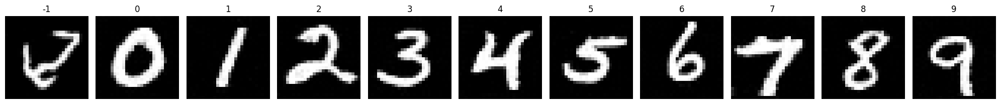

Epoch 389/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0277 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2400 - learning_rate: 5.8377e-04


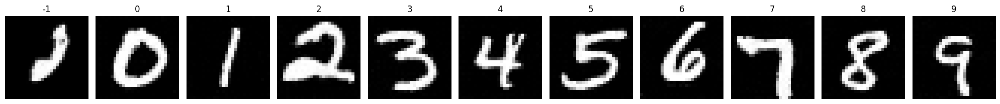

Epoch 390/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2443 - learning_rate: 5.7372e-04


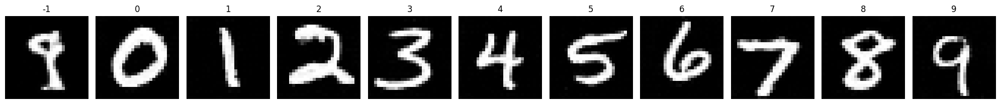

Epoch 391/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2385 - learning_rate: 5.6374e-04


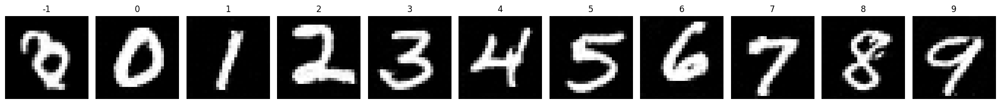

Epoch 392/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2393 - learning_rate: 5.5384e-04


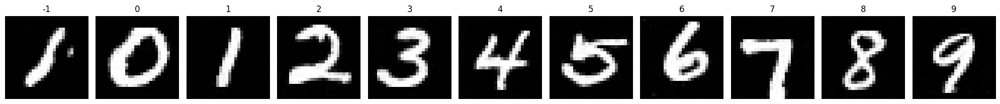

Epoch 393/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2421 - learning_rate: 5.4402e-04


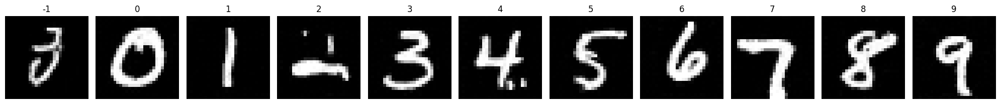

Epoch 394/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2441 - learning_rate: 5.3428e-04


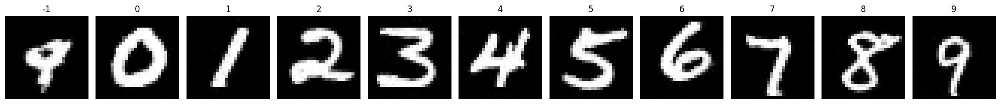

Epoch 395/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0277 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2421 - learning_rate: 5.2461e-04


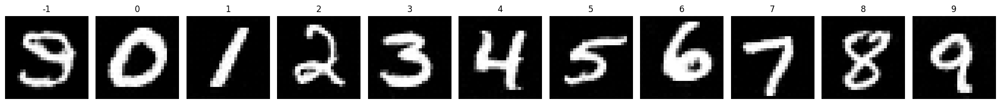

Epoch 396/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0277 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2446 - learning_rate: 5.1502e-04


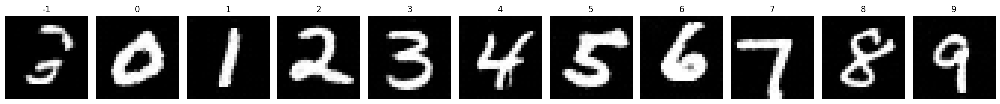

Epoch 397/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0277 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2416 - learning_rate: 5.0551e-04


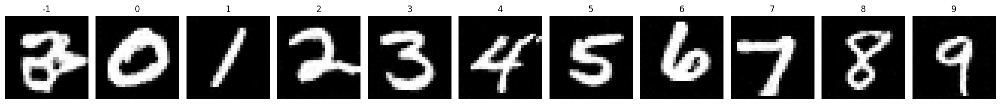

Epoch 398/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2422 - learning_rate: 4.9608e-04


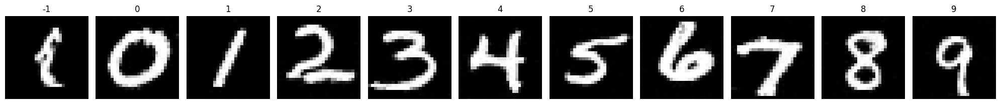

Epoch 399/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0277 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2421 - learning_rate: 4.8673e-04


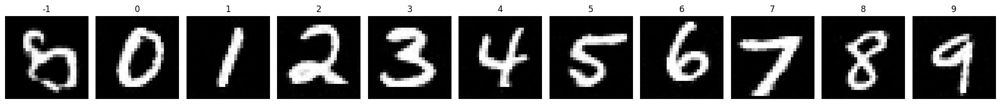

Epoch 400/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2451 - learning_rate: 4.7746e-04


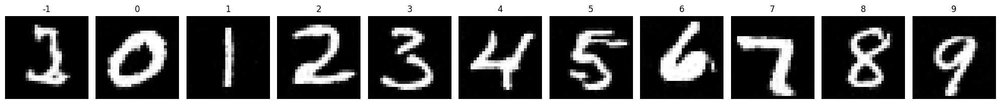

Epoch 401/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0275 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2400 - learning_rate: 4.6826e-04


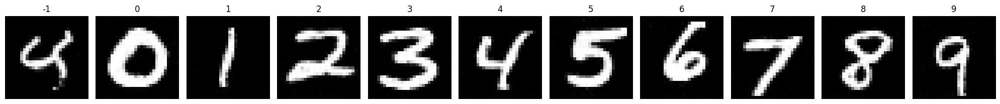

Epoch 402/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2411 - learning_rate: 4.5915e-04


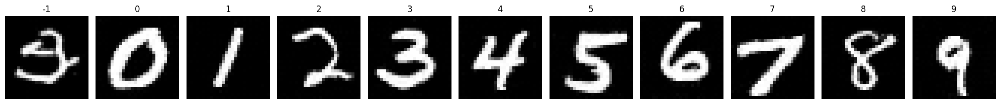

Epoch 403/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0278 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2437 - learning_rate: 4.5012e-04


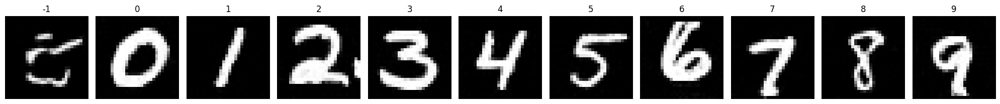

Epoch 404/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0278 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2395 - learning_rate: 4.4117e-04


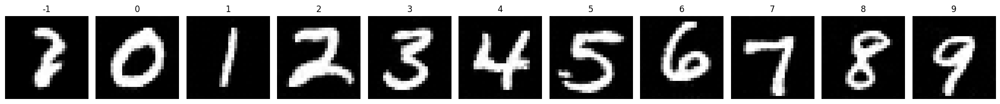

Epoch 405/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2441 - learning_rate: 4.3230e-04


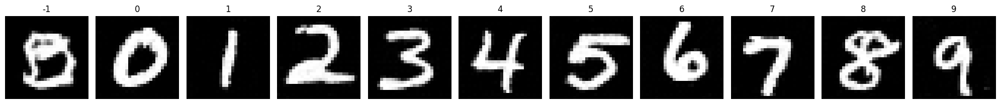

Epoch 406/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2435 - learning_rate: 4.2351e-04


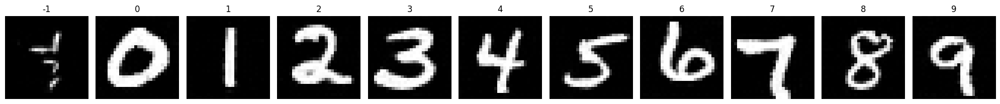

Epoch 407/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2443 - learning_rate: 4.1480e-04


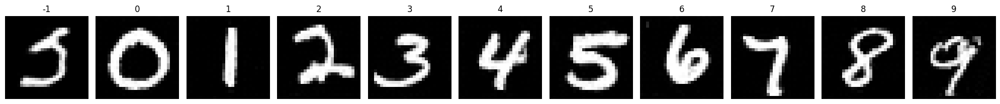

Epoch 408/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2391 - learning_rate: 4.0618e-04


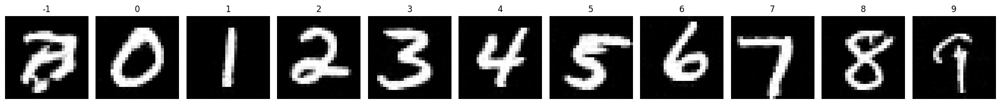

Epoch 409/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2378 - learning_rate: 3.9764e-04


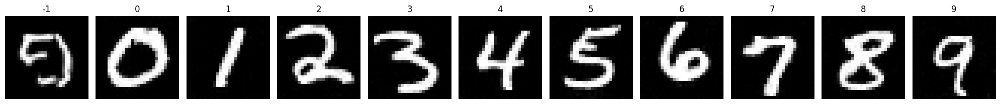

Epoch 410/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2398 - learning_rate: 3.8918e-04


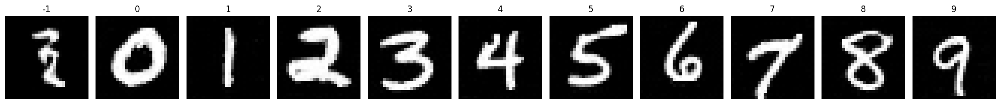

Epoch 411/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2415 - learning_rate: 3.8080e-04


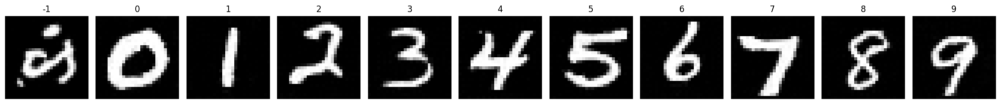

Epoch 412/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0275 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2422 - learning_rate: 3.7251e-04


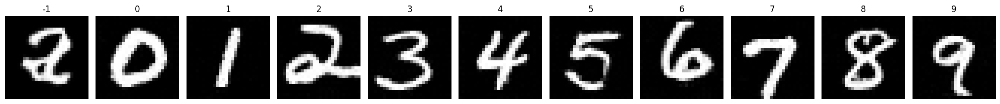

Epoch 413/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2418 - learning_rate: 3.6431e-04


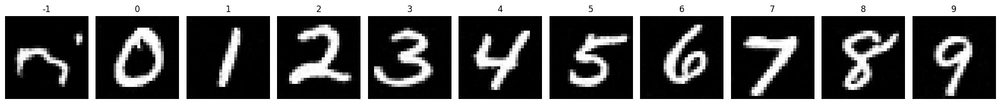

Epoch 414/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2393 - learning_rate: 3.5618e-04


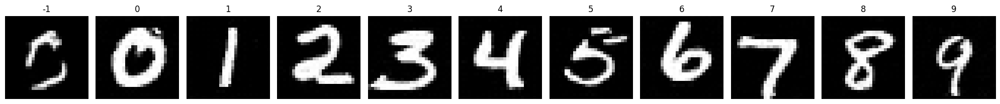

Epoch 415/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0274 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2427 - learning_rate: 3.4814e-04


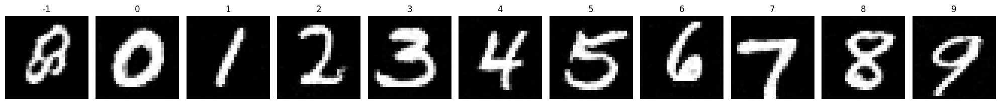

Epoch 416/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0277 - val_loss: 0.0548 - val_noise_loss: 0.0548 - val_image_loss: 0.2474 - learning_rate: 3.4019e-04


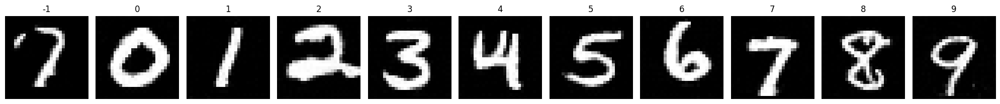

Epoch 417/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0277 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2413 - learning_rate: 3.3232e-04


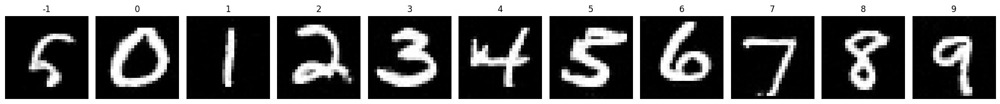

Epoch 418/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2421 - learning_rate: 3.2454e-04


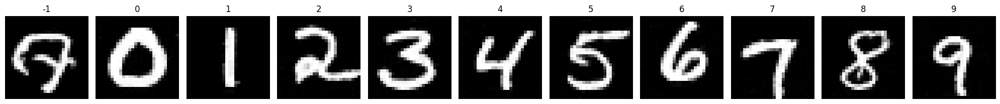

Epoch 419/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2426 - learning_rate: 3.1684e-04


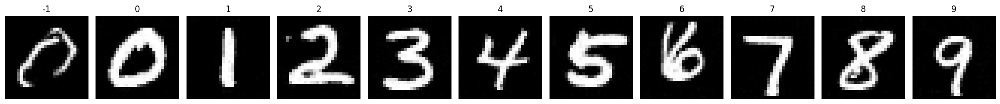

Epoch 420/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0276 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2418 - learning_rate: 3.0923e-04


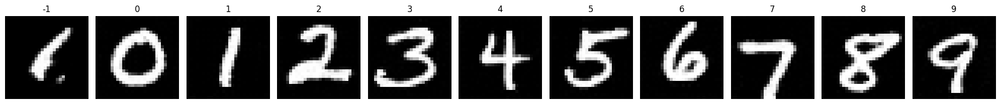

Epoch 421/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0275 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2401 - learning_rate: 3.0171e-04


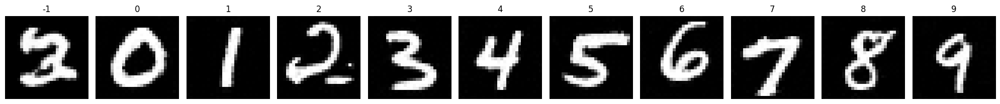

Epoch 422/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2414 - learning_rate: 2.9427e-04


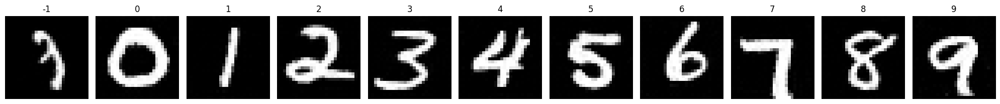

Epoch 423/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2437 - learning_rate: 2.8692e-04


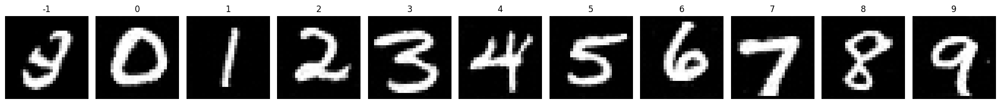

Epoch 424/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2448 - learning_rate: 2.7966e-04


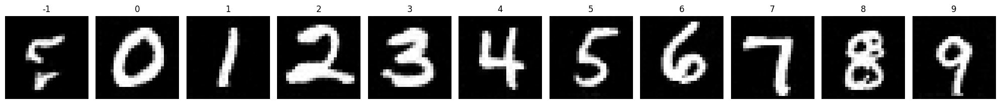

Epoch 425/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2428 - learning_rate: 2.7248e-04


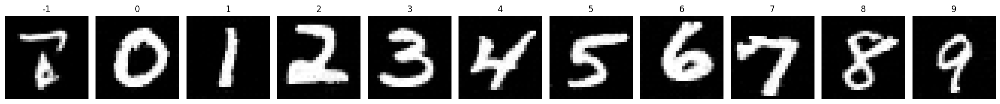

Epoch 426/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2389 - learning_rate: 2.6540e-04


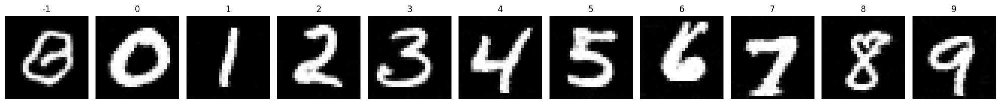

Epoch 427/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2408 - learning_rate: 2.5840e-04


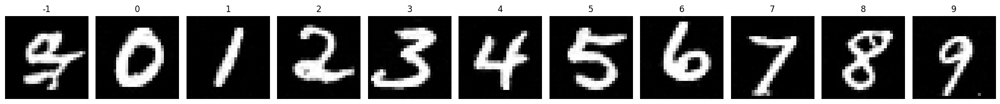

Epoch 428/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2455 - learning_rate: 2.5149e-04


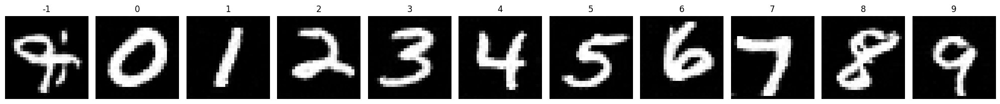

Epoch 429/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0277 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2413 - learning_rate: 2.4466e-04


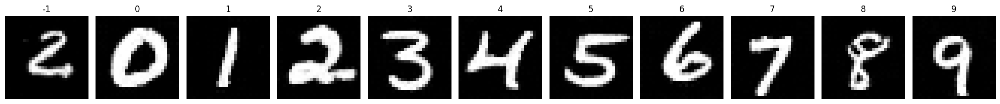

Epoch 430/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2433 - learning_rate: 2.3793e-04


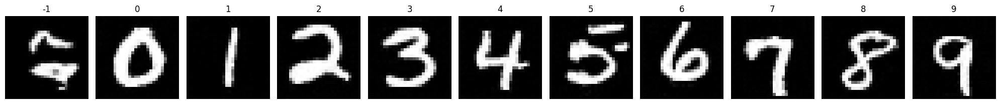

Epoch 431/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2430 - learning_rate: 2.3129e-04


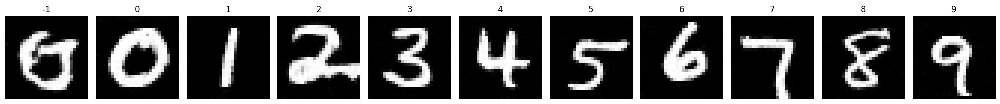

Epoch 432/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0276 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2438 - learning_rate: 2.2473e-04


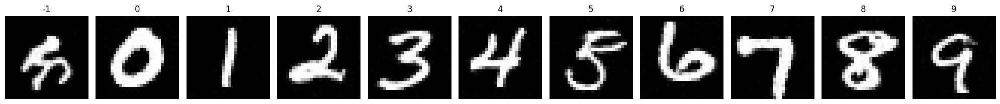

Epoch 433/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2460 - learning_rate: 2.1827e-04


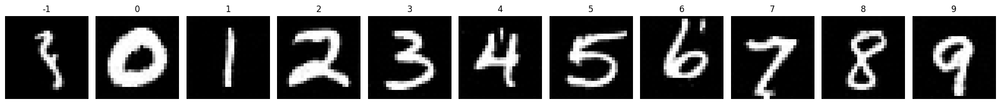

Epoch 434/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2414 - learning_rate: 2.1190e-04


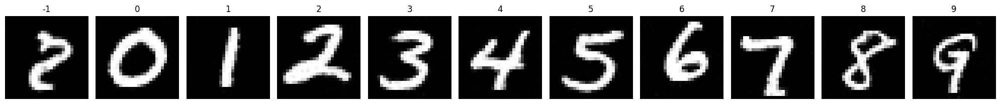

Epoch 435/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0275 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2430 - learning_rate: 2.0561e-04


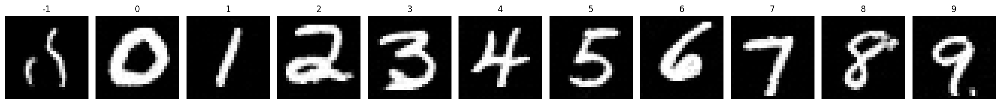

Epoch 436/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0275 - val_loss: 0.0549 - val_noise_loss: 0.0549 - val_image_loss: 0.2454 - learning_rate: 1.9942e-04


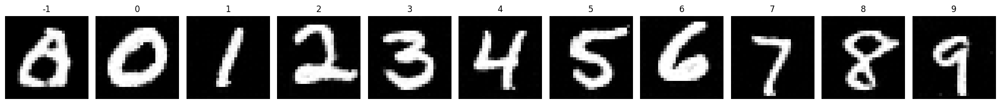

Epoch 437/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0277 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2396 - learning_rate: 1.9332e-04


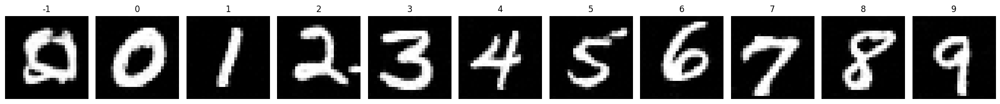

Epoch 438/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0275 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2438 - learning_rate: 1.8731e-04


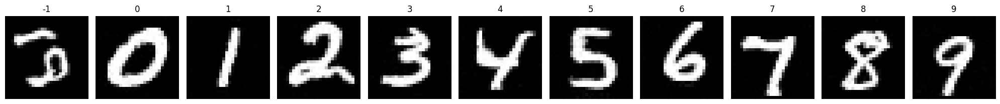

Epoch 439/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0275 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2402 - learning_rate: 1.8139e-04


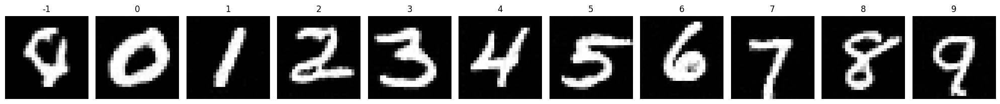

Epoch 440/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0276 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2424 - learning_rate: 1.7556e-04


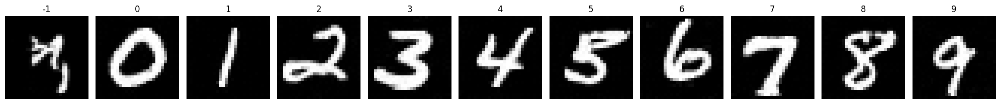

Epoch 441/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0276 - val_loss: 0.0560 - val_noise_loss: 0.0560 - val_image_loss: 0.2404 - learning_rate: 1.6982e-04


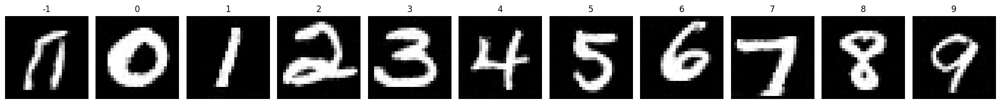

Epoch 442/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0276 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2391 - learning_rate: 1.6418e-04


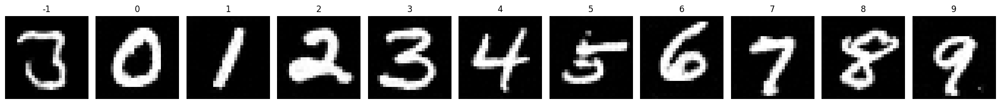

Epoch 443/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0276 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2418 - learning_rate: 1.5863e-04


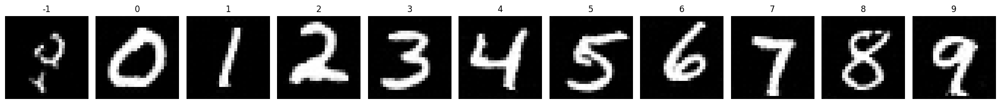

Epoch 444/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2451 - learning_rate: 1.5317e-04


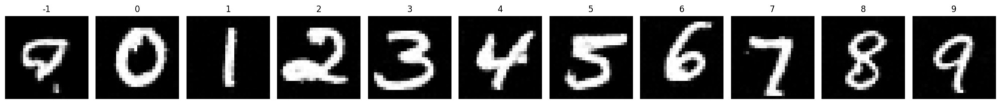

Epoch 445/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0274 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2412 - learning_rate: 1.4780e-04


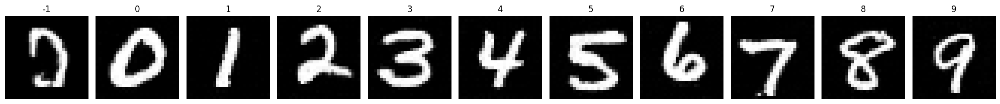

Epoch 446/500
468/468 [==============================] - 19s 42ms/step - noise_loss: 0.0277 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2468 - learning_rate: 1.4252e-04


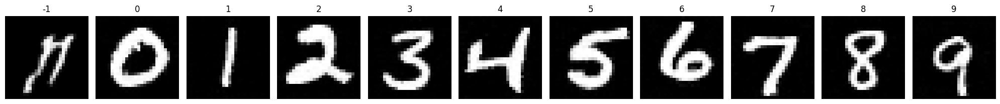

Epoch 447/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0276 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2430 - learning_rate: 1.3734e-04


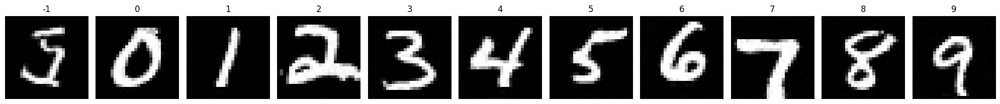

Epoch 448/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0276 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2392 - learning_rate: 1.3225e-04


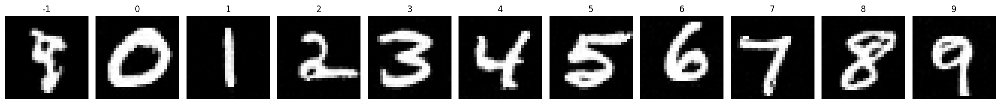

Epoch 449/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0561 - val_noise_loss: 0.0561 - val_image_loss: 0.2466 - learning_rate: 1.2726e-04


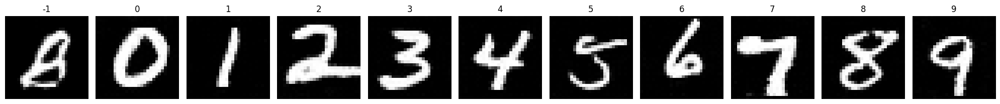

Epoch 450/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2467 - learning_rate: 1.2236e-04


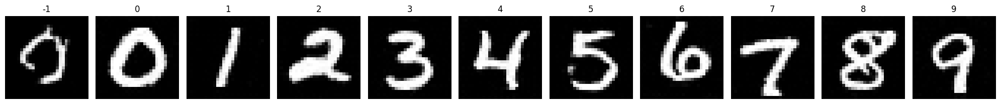

Epoch 451/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2434 - learning_rate: 1.1755e-04


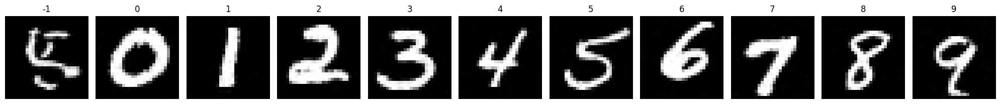

Epoch 452/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0274 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2462 - learning_rate: 1.1284e-04


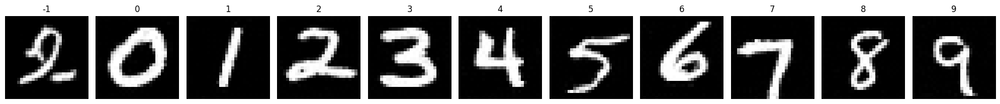

Epoch 453/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0276 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2459 - learning_rate: 1.0822e-04


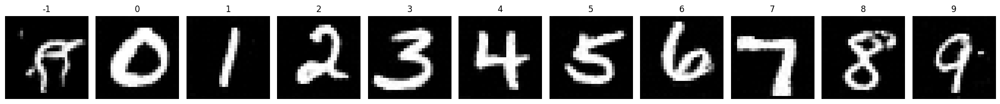

Epoch 454/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0274 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2433 - learning_rate: 1.0370e-04


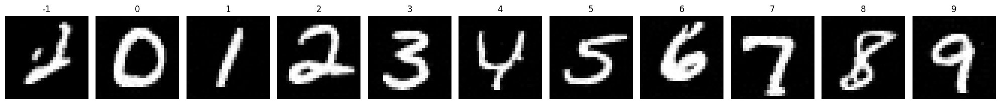

Epoch 455/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0274 - val_loss: 0.0552 - val_noise_loss: 0.0552 - val_image_loss: 0.2469 - learning_rate: 9.9266e-05


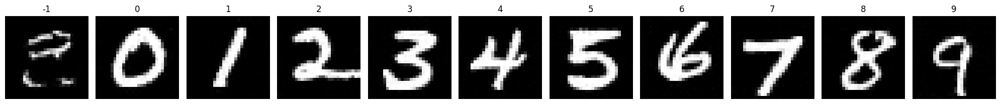

Epoch 456/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0276 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2502 - learning_rate: 9.4931e-05


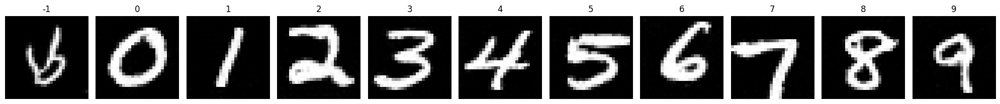

Epoch 457/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2432 - learning_rate: 9.0691e-05


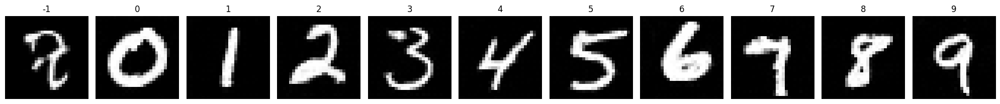

Epoch 458/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0274 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2438 - learning_rate: 8.6546e-05


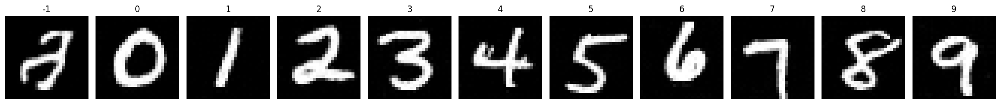

Epoch 459/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0276 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2434 - learning_rate: 8.2496e-05


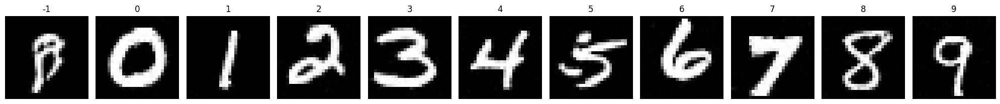

Epoch 460/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0276 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2461 - learning_rate: 7.8542e-05


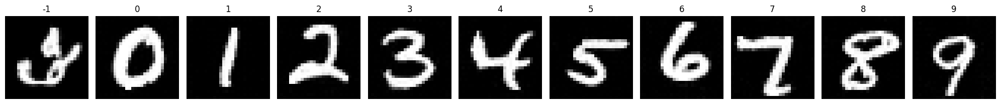

Epoch 461/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2433 - learning_rate: 7.4683e-05


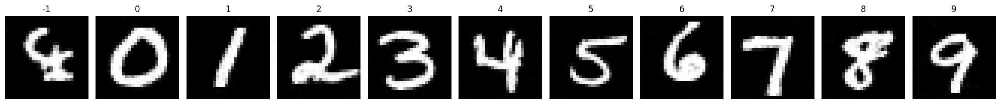

Epoch 462/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0550 - val_noise_loss: 0.0550 - val_image_loss: 0.2483 - learning_rate: 7.0921e-05


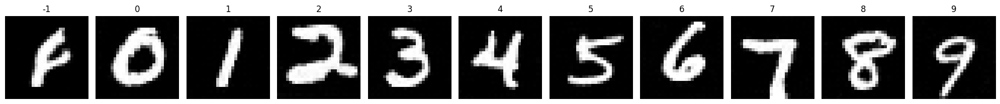

Epoch 463/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0274 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2471 - learning_rate: 6.7254e-05


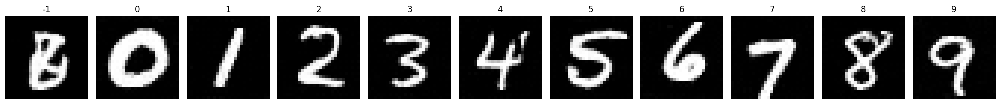

Epoch 464/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0277 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2444 - learning_rate: 6.3683e-05


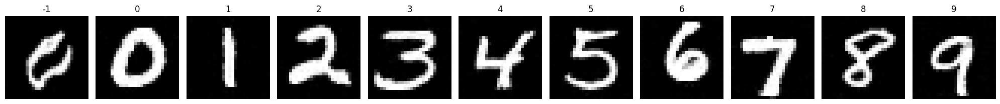

Epoch 465/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2440 - learning_rate: 6.0208e-05


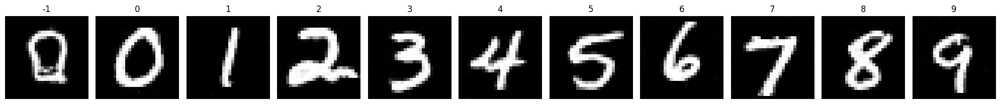

Epoch 466/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2491 - learning_rate: 5.6830e-05


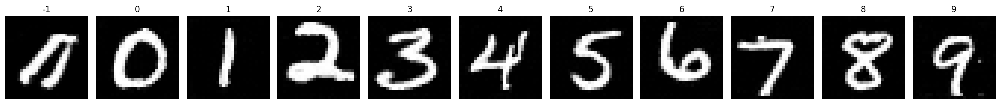

Epoch 467/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2505 - learning_rate: 5.3548e-05


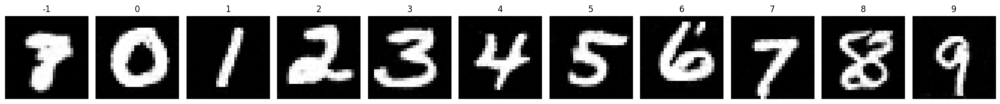

Epoch 468/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2434 - learning_rate: 5.0362e-05


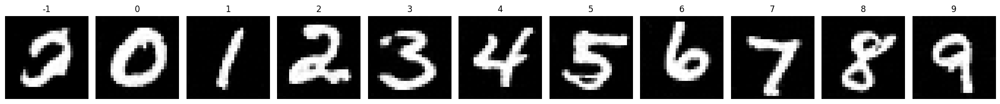

Epoch 469/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2409 - learning_rate: 4.7274e-05


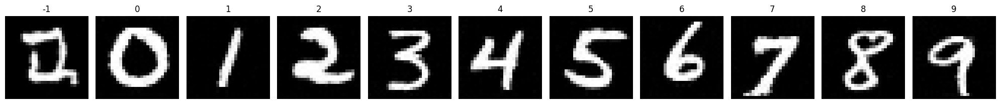

Epoch 470/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2421 - learning_rate: 4.4282e-05


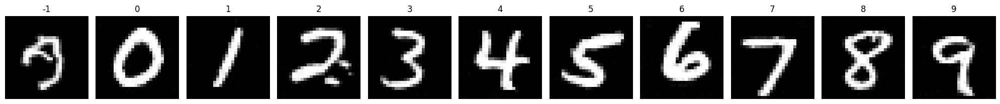

Epoch 471/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2454 - learning_rate: 4.1387e-05


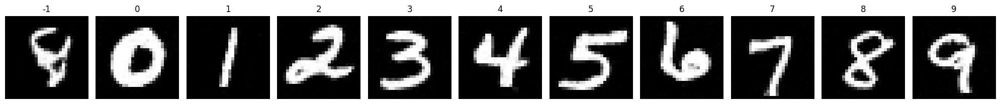

Epoch 472/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0275 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2408 - learning_rate: 3.8589e-05


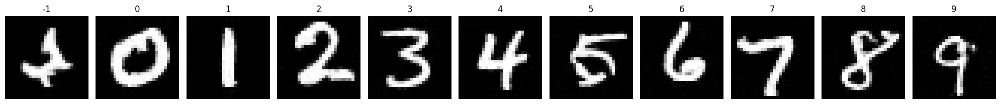

Epoch 473/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2441 - learning_rate: 3.5889e-05


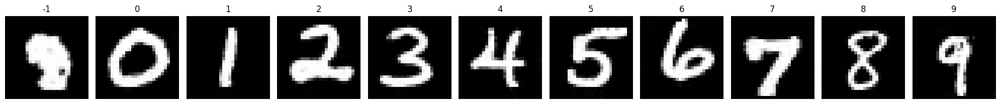

Epoch 474/500
468/468 [==============================] - 19s 39ms/step - noise_loss: 0.0275 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2456 - learning_rate: 3.3285e-05


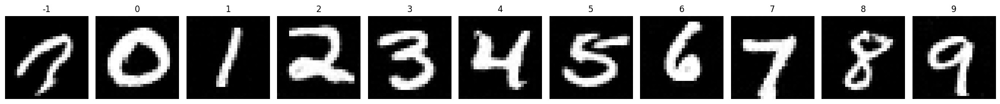

Epoch 475/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0273 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2476 - learning_rate: 3.0779e-05


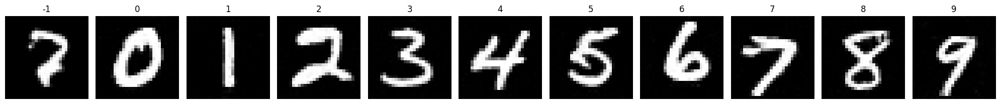

Epoch 476/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2420 - learning_rate: 2.8371e-05


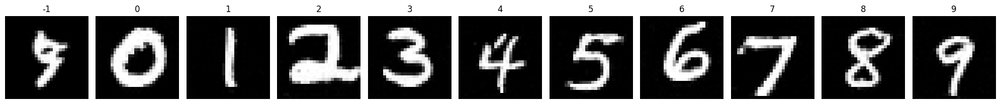

Epoch 477/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2469 - learning_rate: 2.6060e-05


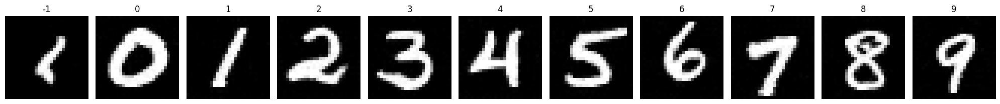

Epoch 478/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2441 - learning_rate: 2.3846e-05


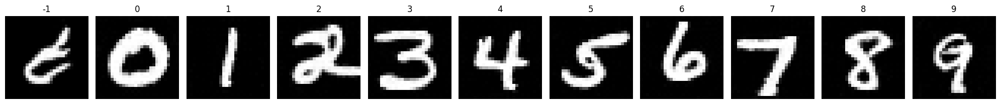

Epoch 479/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2425 - learning_rate: 2.1731e-05


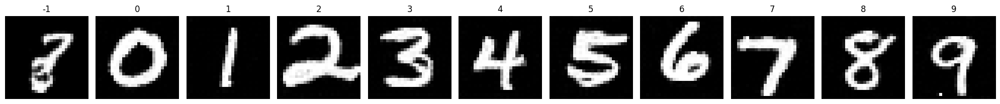

Epoch 480/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0274 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2472 - learning_rate: 1.9713e-05


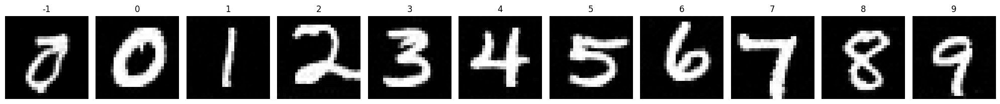

Epoch 481/500
468/468 [==============================] - 18s 39ms/step - noise_loss: 0.0276 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2452 - learning_rate: 1.7793e-05


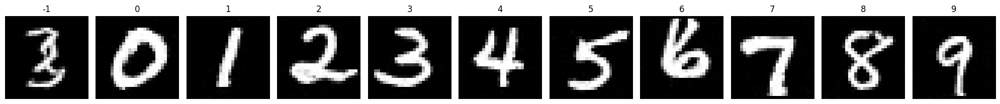

Epoch 482/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2416 - learning_rate: 1.5972e-05


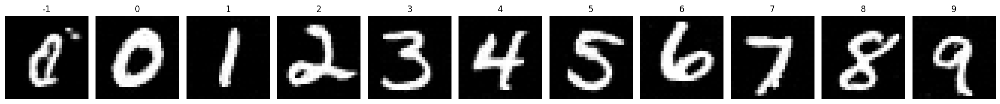

Epoch 483/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0558 - val_noise_loss: 0.0558 - val_image_loss: 0.2443 - learning_rate: 1.4248e-05


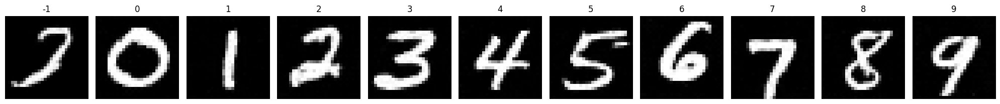

Epoch 484/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2407 - learning_rate: 1.2622e-05


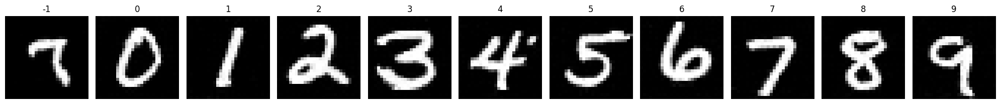

Epoch 485/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0553 - val_noise_loss: 0.0553 - val_image_loss: 0.2462 - learning_rate: 1.1095e-05


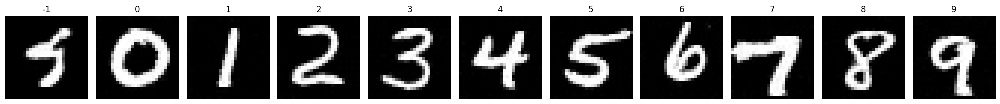

Epoch 486/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0560 - val_noise_loss: 0.0560 - val_image_loss: 0.2417 - learning_rate: 9.6659e-06


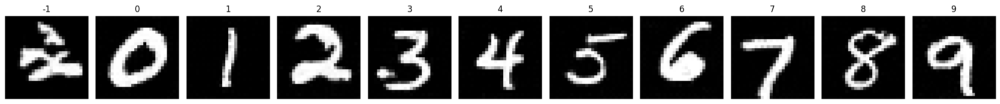

Epoch 487/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0276 - val_loss: 0.0561 - val_noise_loss: 0.0561 - val_image_loss: 0.2456 - learning_rate: 8.3351e-06


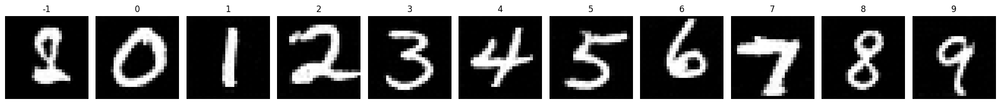

Epoch 488/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0563 - val_noise_loss: 0.0563 - val_image_loss: 0.2438 - learning_rate: 7.1028e-06


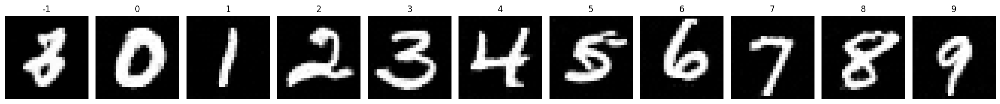

Epoch 489/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0559 - val_noise_loss: 0.0559 - val_image_loss: 0.2443 - learning_rate: 5.9688e-06


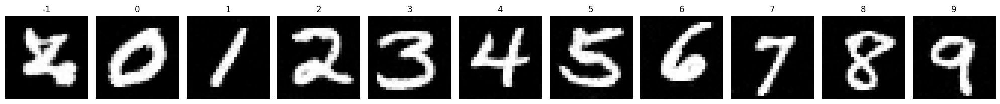

Epoch 490/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0274 - val_loss: 0.0560 - val_noise_loss: 0.0560 - val_image_loss: 0.2419 - learning_rate: 4.9332e-06


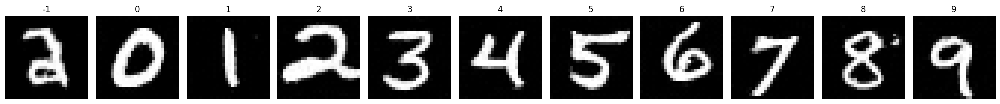

Epoch 491/500
468/468 [==============================] - 21s 45ms/step - noise_loss: 0.0274 - val_loss: 0.0554 - val_noise_loss: 0.0554 - val_image_loss: 0.2483 - learning_rate: 3.9960e-06


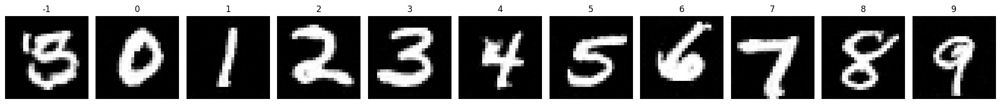

Epoch 492/500
468/468 [==============================] - 21s 45ms/step - noise_loss: 0.0275 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2465 - learning_rate: 3.1576e-06


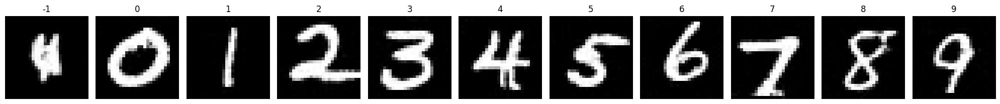

Epoch 493/500
468/468 [==============================] - 20s 42ms/step - noise_loss: 0.0274 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2451 - learning_rate: 2.4177e-06


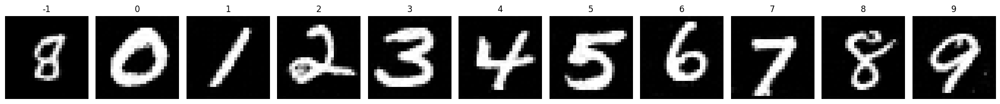

Epoch 494/500
468/468 [==============================] - 19s 41ms/step - noise_loss: 0.0275 - val_loss: 0.0557 - val_noise_loss: 0.0557 - val_image_loss: 0.2413 - learning_rate: 1.7764e-06


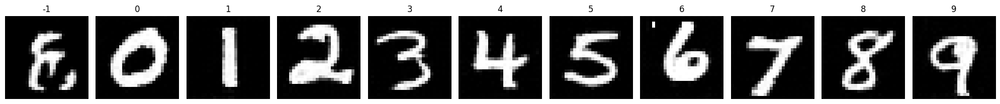

Epoch 495/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0273 - val_loss: 0.0555 - val_noise_loss: 0.0555 - val_image_loss: 0.2495 - learning_rate: 1.2337e-06


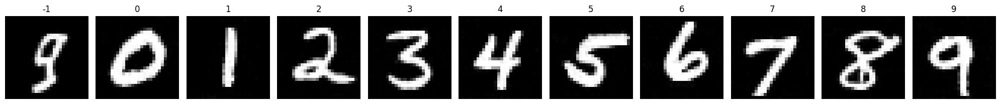

Epoch 496/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0562 - val_noise_loss: 0.0562 - val_image_loss: 0.2398 - learning_rate: 7.8946e-07


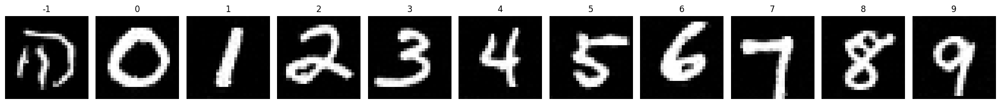

Epoch 497/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2436 - learning_rate: 4.4405e-07


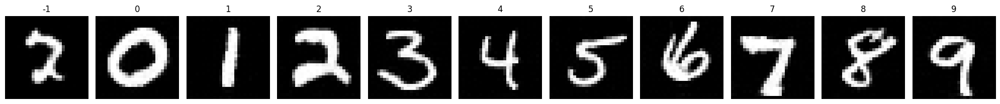

Epoch 498/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0556 - val_noise_loss: 0.0556 - val_image_loss: 0.2462 - learning_rate: 1.9744e-07


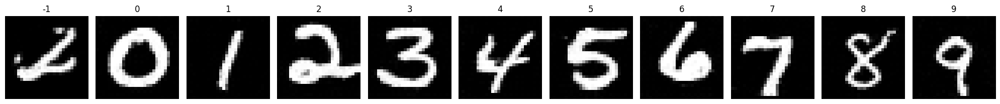

Epoch 499/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0274 - val_loss: 0.0551 - val_noise_loss: 0.0551 - val_image_loss: 0.2466 - learning_rate: 4.9323e-08


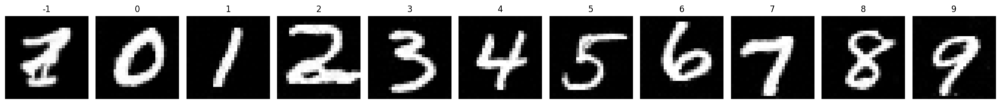

Epoch 500/500
468/468 [==============================] - 19s 40ms/step - noise_loss: 0.0275 - val_loss: 0.0561 - val_noise_loss: 0.0561 - val_image_loss: 0.2417 - learning_rate: 0.0000e+00


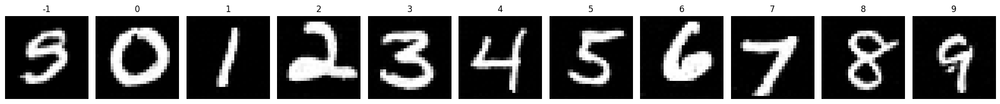

In [8]:
history = model.fit(
    trainset, 
    epochs=epochs, 
    validation_data=valset, 
    callbacks=callbacks_list
).history

In [ ]:
model.save_weights("./models/DiT mini/model.weights.h5")

In [11]:
model.evaluate(valset, network_name="ema")

79/79 [==============================] - 3s 32ms/step - loss: 0.0554 - noise_loss: 0.0554 - image_loss: 0.2425


[0.055416639894247055, 0.055416639894247055, 0.2425171434879303]

In [12]:
model.evaluate(valset, network_name="raw")

79/79 [==============================] - 4s 33ms/step - loss: 0.0556 - noise_loss: 0.0556 - image_loss: 0.2460


[0.055601634085178375, 0.055601634085178375, 0.2459917962551117]

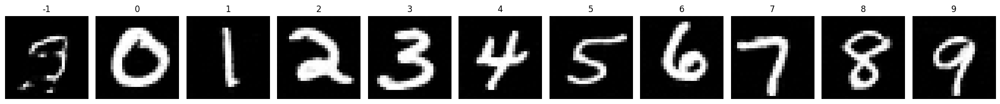

In [13]:
from common.utils import plot_images


imgs = model.sample(add_null_label=True, scale=3., eta=1., steps=1_000)
plot_images(imgs, has_null_label=True)

Steps: 1000/1000


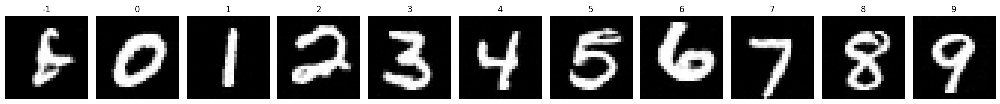

In [14]:
imgs = model.sample(add_null_label=True, scale=3., steps=1_000, verbose=True)
plot_images(imgs, has_null_label=True)

Steps: 50/50


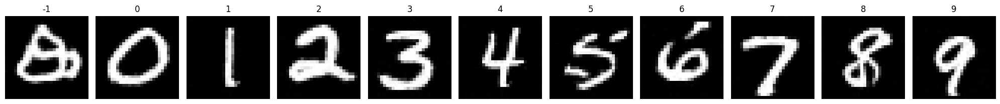

In [15]:
imgs = model.sample(add_null_label=True, scale=3., verbose=True)
plot_images(imgs, has_null_label=True)

Steps: 50/50


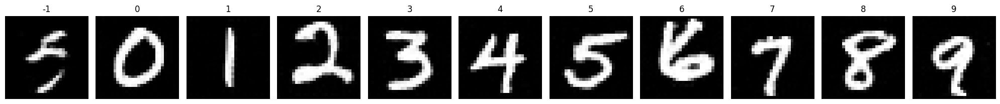

In [16]:
imgs = model.sample(add_null_label=True, scale=4., verbose=True)
plot_images(imgs, has_null_label=True)

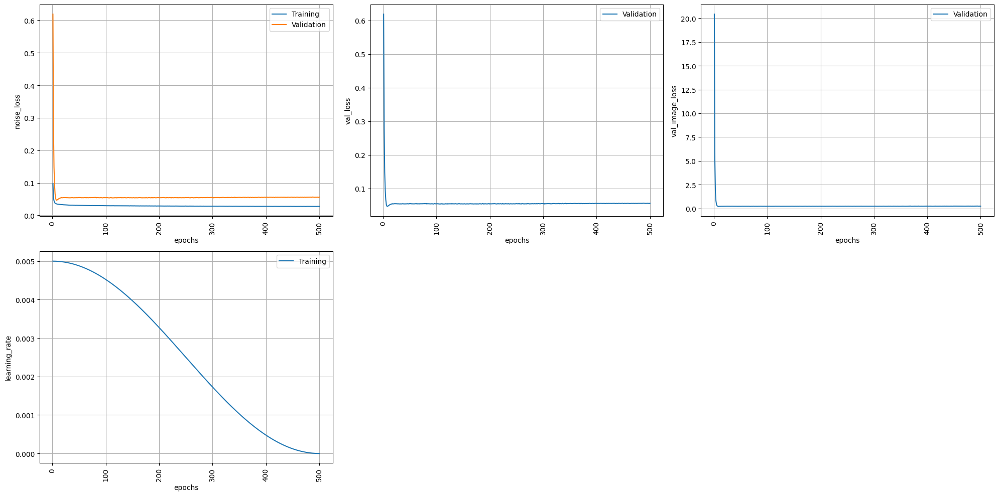

In [17]:
from common.utils import plot_history


plot_history(history, show_all_x_ticks=False)

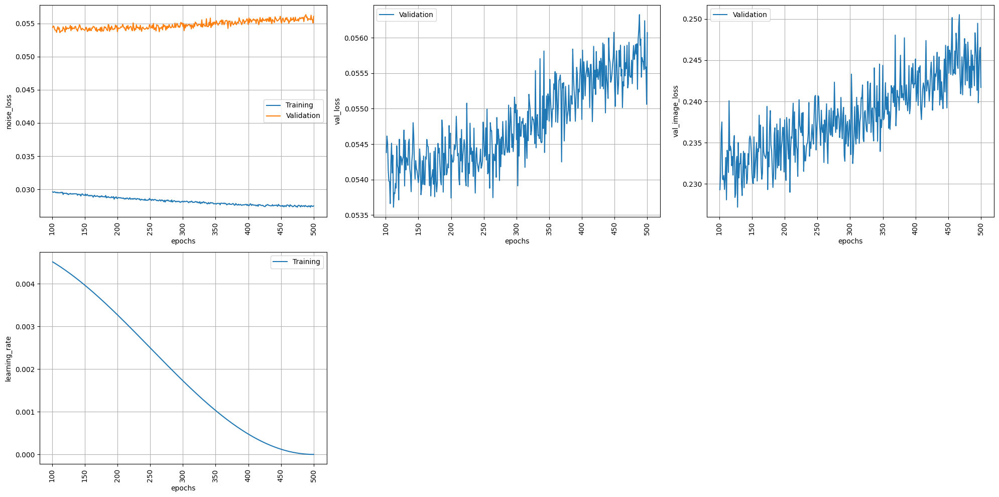

In [18]:
plot_history(history, show_all_x_ticks=False, range_=(100, None))